In [2]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import hvplot.pandas  
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split  
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression  
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier 
import xgboost as xgb
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.feature_selection import SequentialFeatureSelector
import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv('smoke_detection_iot.csv')
df.head()

,Unnamed: 0,UTC,Temperature[C],Humidity[%],TVOC[ppb],eCO2[ppm],Raw H2,Raw Ethanol,Pressure[hPa],PM1.0,PM2.5,NC0.5,NC1.0,NC2.5,CNT,Fire Alarm
0,0,1654733331,20.000,57.36,0,400,12306,18520,939.735,0.0,0.0,0.0,0.0,0.0,0,0
1,1,1654733332,20.015,56.67,0,400,12345,18651,939.744,0.0,0.0,0.0,0.0,0.0,1,0
2,2,1654733333,20.029,55.96,0,400,12374,18764,939.738,0.0,0.0,0.0,0.0,0.0,2,0
3,3,1654733334,20.044,55.28,0,400,12390,18849,939.736,0.0,0.0,0.0,0.0,0.0,3,0
4,4,1654733335,20.059,54.69,0,400,12403,18921,939.744,0.0,0.0,0.0,0.0,0.0,4,0


In [4]:
df.rename(columns={'Unnamed: 0': 'id'}, inplace=True)

In [5]:
df.columns = df.columns.str.replace('[', '').str.replace(']', '').str.replace(',', '').str.replace('%', '')


In [6]:
df.id

0            0
1            1
2            2
3            3
4            4
         ...  
62625    62625
62626    62626
62627    62627
62628    62628
62629    62629
Name: id, Length: 62630, dtype: int64

In [7]:
len(df.id)

62630

In [8]:
df.shape

(62630, 16)

In [9]:
df.head()

,id,UTC,TemperatureC,Humidity,TVOCppb,eCO2ppm,Raw H2,Raw Ethanol,PressurehPa,PM1.0,PM2.5,NC0.5,NC1.0,NC2.5,CNT,Fire Alarm
0,0,1654733331,20.000,57.36,0,400,12306,18520,939.735,0.0,0.0,0.0,0.0,0.0,0,0
1,1,1654733332,20.015,56.67,0,400,12345,18651,939.744,0.0,0.0,0.0,0.0,0.0,1,0
2,2,1654733333,20.029,55.96,0,400,12374,18764,939.738,0.0,0.0,0.0,0.0,0.0,2,0
3,3,1654733334,20.044,55.28,0,400,12390,18849,939.736,0.0,0.0,0.0,0.0,0.0,3,0
4,4,1654733335,20.059,54.69,0,400,12403,18921,939.744,0.0,0.0,0.0,0.0,0.0,4,0


In [10]:
df.duplicated().sum()

0

In [11]:
df.isna().sum()

id              0
UTC             0
TemperatureC    0
Humidity        0
TVOCppb         0
eCO2ppm         0
Raw H2          0
Raw Ethanol     0
PressurehPa     0
PM1.0           0
PM2.5           0
NC0.5           0
NC1.0           0
NC2.5           0
CNT             0
Fire Alarm      0
dtype: int64

In [12]:
df.columns

Index(['id', 'UTC', 'TemperatureC', 'Humidity', 'TVOCppb', 'eCO2ppm', 'Raw H2',
       'Raw Ethanol', 'PressurehPa', 'PM1.0', 'PM2.5', 'NC0.5', 'NC1.0',
       'NC2.5', 'CNT', 'Fire Alarm'],
      dtype='object')

In [13]:
len(df.columns)

16

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62630 entries, 0 to 62629
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   id            62630 non-null  int64  
 1   UTC           62630 non-null  int64  
 2   TemperatureC  62630 non-null  float64
 3   Humidity      62630 non-null  float64
 4   TVOCppb       62630 non-null  int64  
 5   eCO2ppm       62630 non-null  int64  
 6   Raw H2        62630 non-null  int64  
 7   Raw Ethanol   62630 non-null  int64  
 8   PressurehPa   62630 non-null  float64
 9   PM1.0         62630 non-null  float64
 10  PM2.5         62630 non-null  float64
 11  NC0.5         62630 non-null  float64
 12  NC1.0         62630 non-null  float64
 13  NC2.5         62630 non-null  float64
 14  CNT           62630 non-null  int64  
 15  Fire Alarm    62630 non-null  int64  
dtypes: float64(8), int64(8)
memory usage: 7.6 MB


In [15]:
df.describe()

,id,UTC,TemperatureC,Humidity,TVOCppb,eCO2ppm,Raw H2,Raw Ethanol,PressurehPa,PM1.0,PM2.5,NC0.5,NC1.0,NC2.5,CNT,Fire Alarm
count,62630.000000,6.263000e+04,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000,62630.000000
mean,31314.500000,1.654792e+09,15.970424,48.539499,1942.057528,670.021044,12942.453936,19754.257912,938.627649,100.594309,184.467770,491.463608,203.586487,80.049042,10511.386157,0.714626
std,18079.868017,1.100025e+05,14.359576,8.865367,7811.589055,1905.885439,272.464305,609.513156,1.331344,922.524245,1976.305615,4265.661251,2214.738556,1083.383189,7597.870997,0.451596
min,0.000000,1.654712e+09,-22.010000,10.740000,0.000000,400.000000,10668.000000,15317.000000,930.852000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15657.250000,1.654743e+09,10.994250,47.530000,130.000000,400.000000,12830.000000,19435.000000,938.700000,1.280000,1.340000,8.820000,1.384000,0.033000,3625.250000,0.000000
50%,31314.500000,1.654762e+09,20.130000,50.150000,981.000000,400.000000,12924.000000,19501.000000,938.816000,1.810000,1.880000,12.450000,1.943000,0.044000,9336.000000,1.000000
75%,46971.750000,1.654778e+09,25.409500,53.240000,1189.000000,438.000000,13109.000000,20078.000000,939.418000,2.090000,2.180000,14.420000,2.249000,0.051000,17164.750000,1.000000
max,62629.000000,1.655130e+09,59.930000,75.200000,60000.000000,60000.000000,13803.000000,21410.000000,939.861000,14333.690000,45432.260000,61482.030000,51914.680000,30026.438000,24993.000000,1.000000


In [16]:
df.hvplot.hist(y='Humidity', by='Fire Alarm', subplots=False, width=600, height=300, bins=30)

:NdOverlay   [Fire Alarm]
   :Histogram   [Humidity]   (Humidity_count)

In [17]:
df.hvplot.hist(y='UTC', by='Fire Alarm', subplots=False, width=600, height=300, bins=30)

:NdOverlay   [Fire Alarm]
   :Histogram   [UTC]   (UTC_count)

In [18]:
df.hvplot.hist(y='TemperatureC', by='Fire Alarm', subplots=False, width=600, height=300, bins=30)

:NdOverlay   [Fire Alarm]
   :Histogram   [TemperatureC]   (TemperatureC_count)

In [19]:
df.hvplot.hist(y='eCO2ppm', by='Fire Alarm', subplots=False, width=600, height=300, bins=30)

:NdOverlay   [Fire Alarm]
   :Histogram   [eCO2ppm]   (eCO2ppm_count)

In [20]:
df.hvplot.hist(y='Raw Ethanol', by='Fire Alarm', subplots=False, width=600, height=300, bins=30)

:NdOverlay   [Fire Alarm]
   :Histogram   [Raw Ethanol]   (Raw Ethanol_count)

In [21]:
df.hvplot.hist(y='CNT', by='Fire Alarm', subplots=False, width=600, height=300, bins=30)

:NdOverlay   [Fire Alarm]
   :Histogram   [CNT]   (CNT_count)

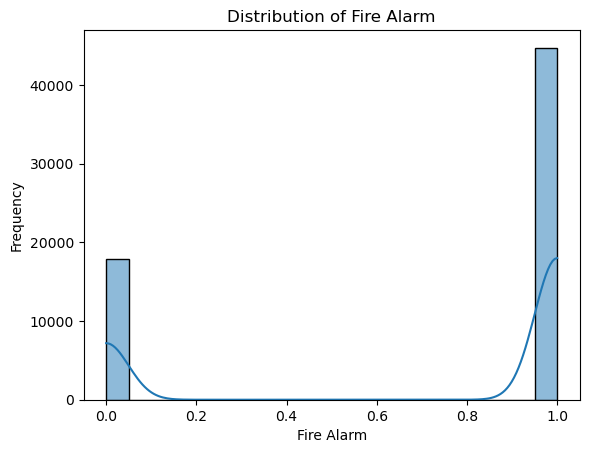

In [23]:
sns.histplot(df['Fire Alarm'], bins=20, kde=True)
plt.title('Distribution of Fire Alarm')
plt.xlabel('Fire Alarm')
plt.ylabel('Frequency')
plt.show()

1    44757
0    17873
Name: Fire Alarm, dtype: int64


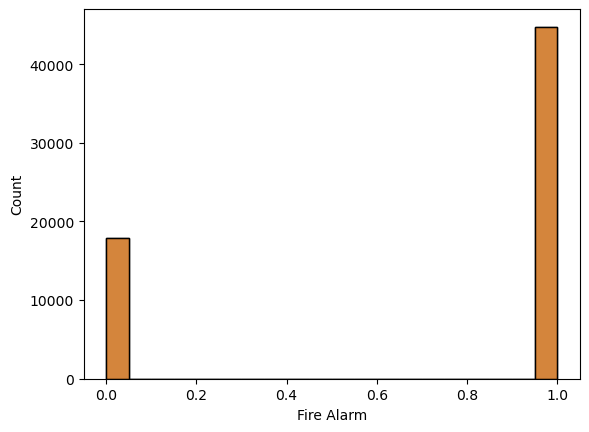

In [25]:
y = df["Fire Alarm"]

sns.histplot(y)


target_temp = df['Fire Alarm'].value_counts()

print(target_temp)
plt.show()

In [15]:
df.drop('id', axis = 1,inplace=True)

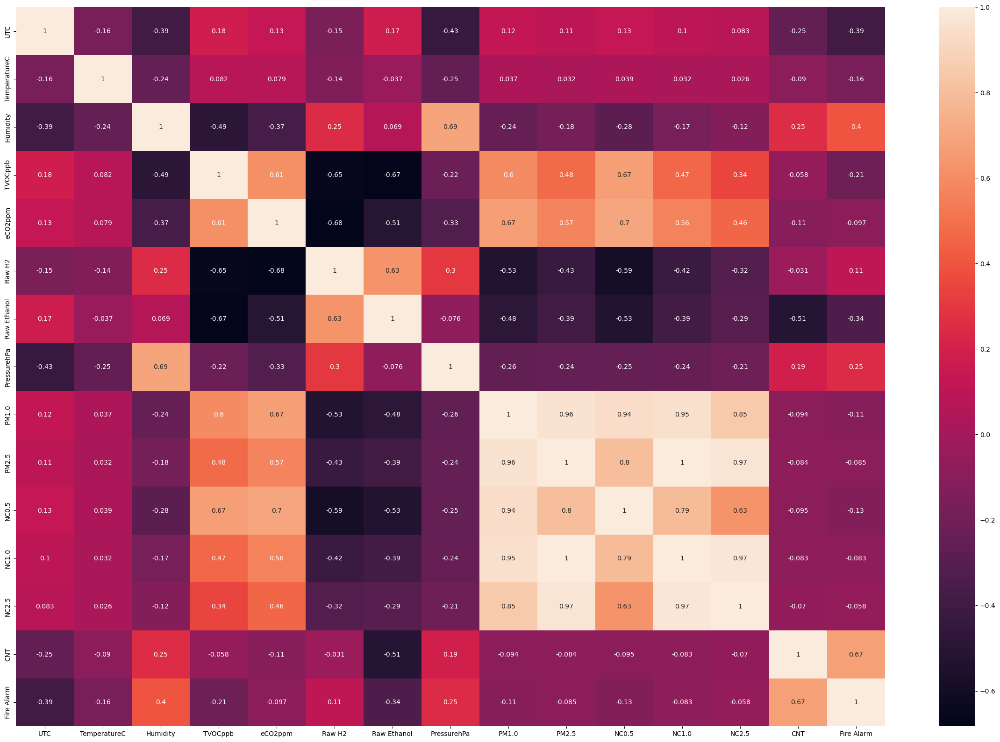

In [16]:
corr = df.corr()
plt.figure(figsize=[30,20],)
sns.heatmap(corr, annot = True)
plt.show()

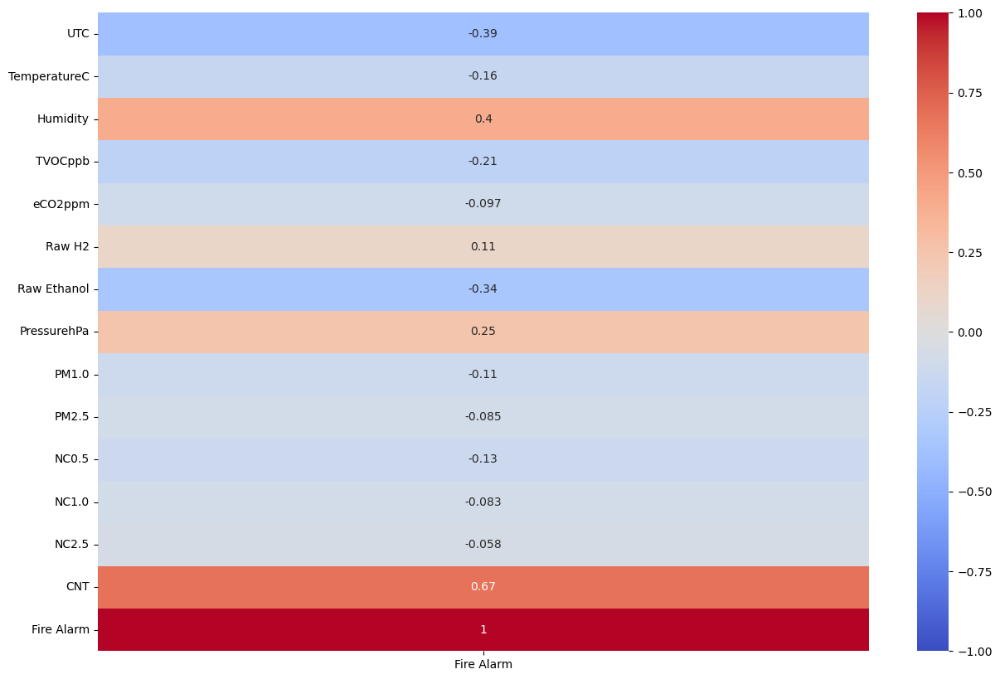

In [17]:
correlation_matrix = df.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix[['Fire Alarm']], annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.show()


In [18]:
df.columns

Index(['UTC', 'TemperatureC', 'Humidity', 'TVOCppb', 'eCO2ppm', 'Raw H2',
       'Raw Ethanol', 'PressurehPa', 'PM1.0', 'PM2.5', 'NC0.5', 'NC1.0',
       'NC2.5', 'CNT', 'Fire Alarm'],
      dtype='object')

In [19]:
X = df.drop(['Fire Alarm'], axis = 1)
y = df['Fire Alarm']

Training and evaluating Random Forest...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


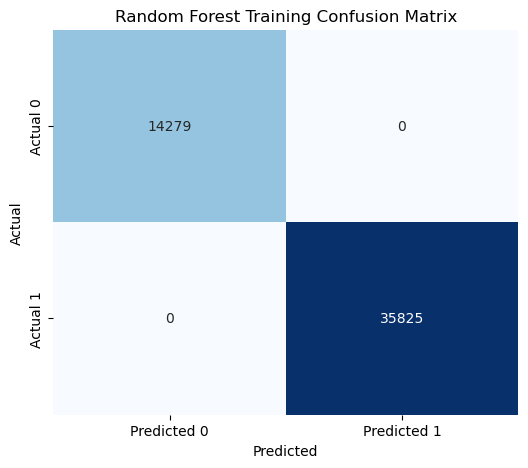

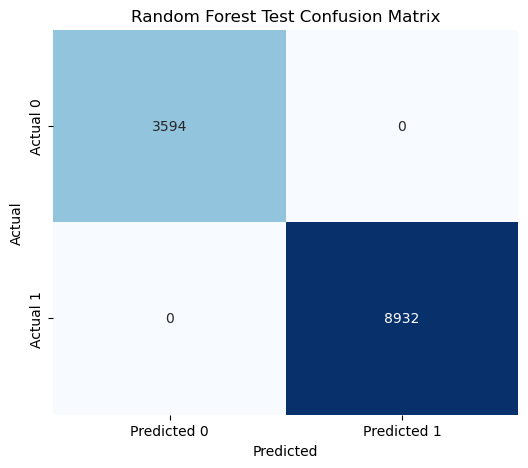

Training and evaluating Logistic Regression...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


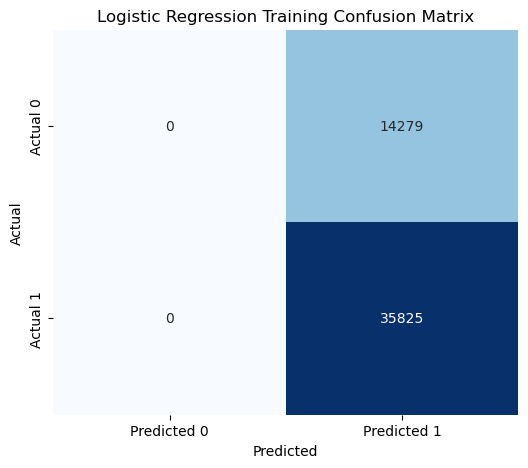

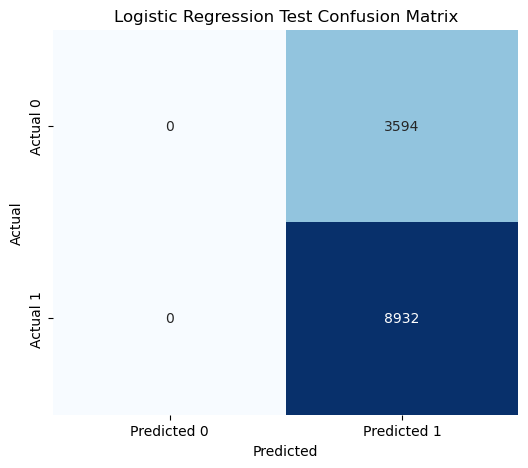

Training and evaluating SVM...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


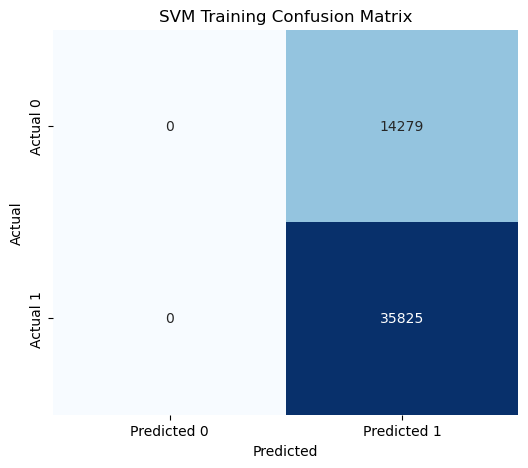

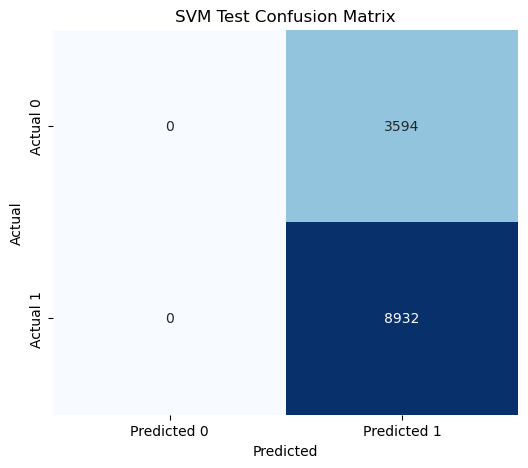

Training and evaluating Naive Bayes...

Training Scores:
Accuracy: 0.8263
Precision: 0.8171
Recall: 0.9754
F1 Score: 0.8892

Test Scores:
Accuracy: 0.8268
Precision: 0.8184
Recall: 0.9730
F1 Score: 0.8891


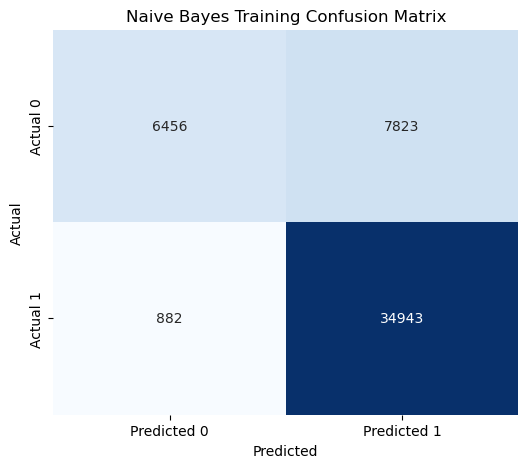

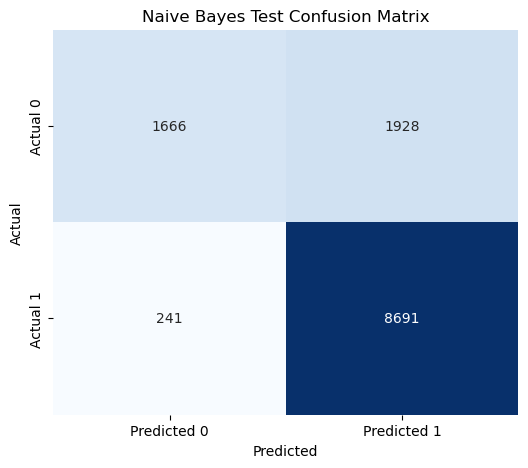

Training and evaluating K-Nearest Neighbors...

Training Scores:
Accuracy: 0.9997
Precision: 0.9997
Recall: 0.9999
F1 Score: 0.9998

Test Scores:
Accuracy: 0.9998
Precision: 0.9999
Recall: 0.9999
F1 Score: 0.9999


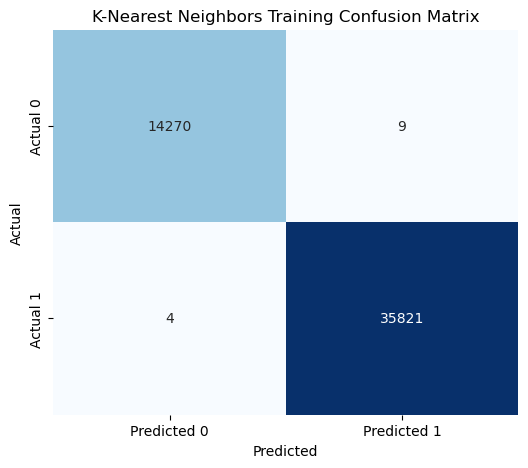

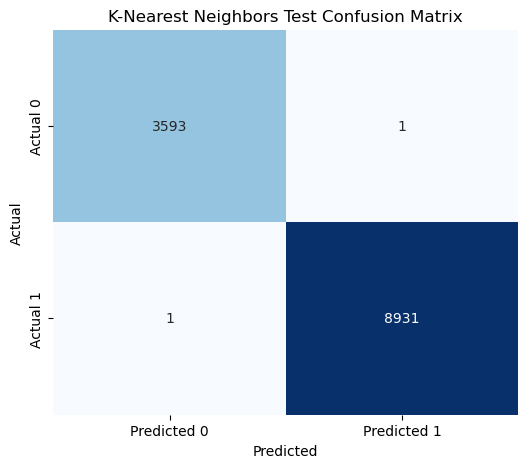

Training and evaluating Decision Tree...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 0.9998
Precision: 0.9998
Recall: 1.0000
F1 Score: 0.9999


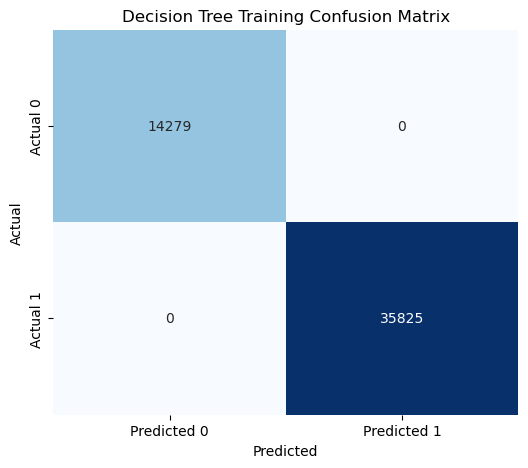

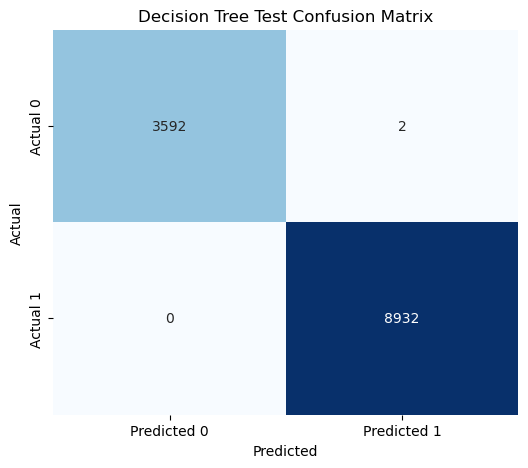

Training and evaluating AdaBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 1.0000
F1 Score: 0.9999


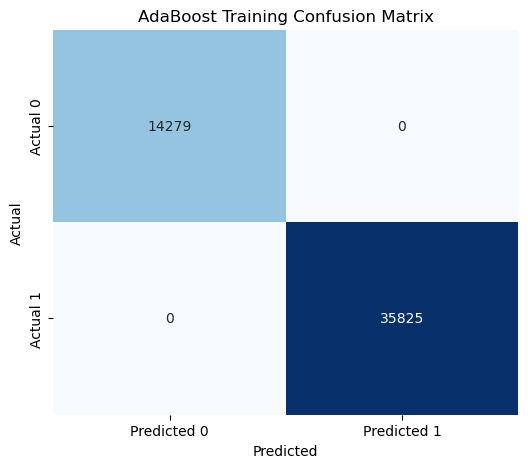

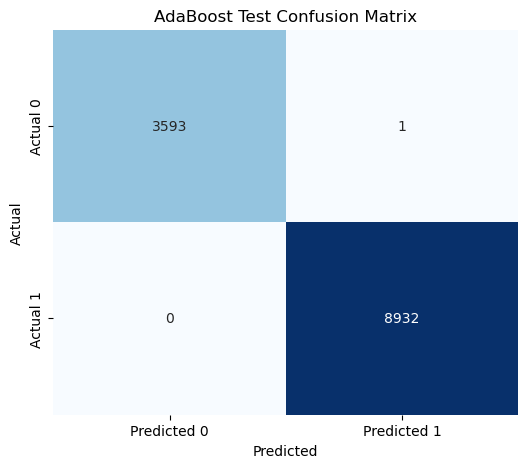

Training and evaluating Neural Network (Sigmoid)...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


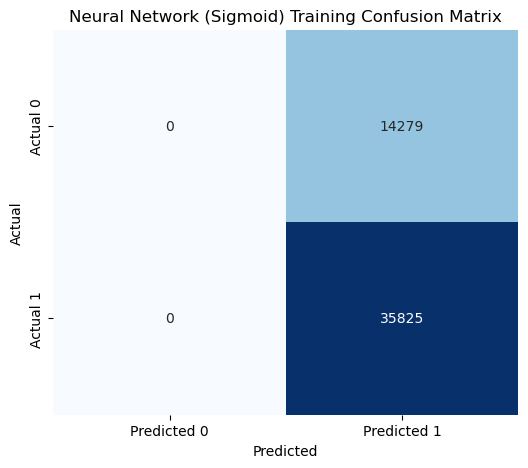

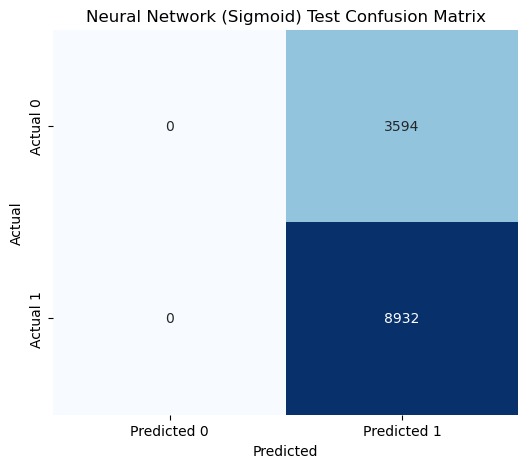

Training and evaluating XGBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


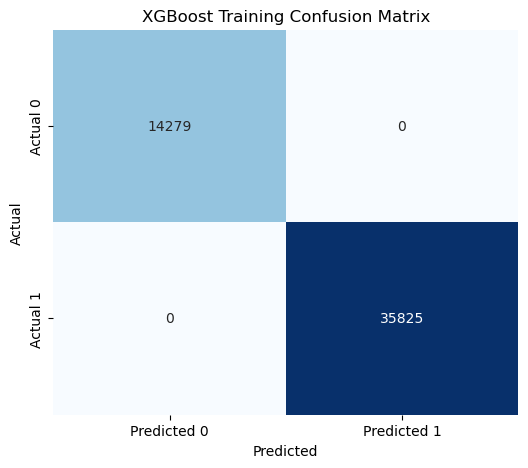

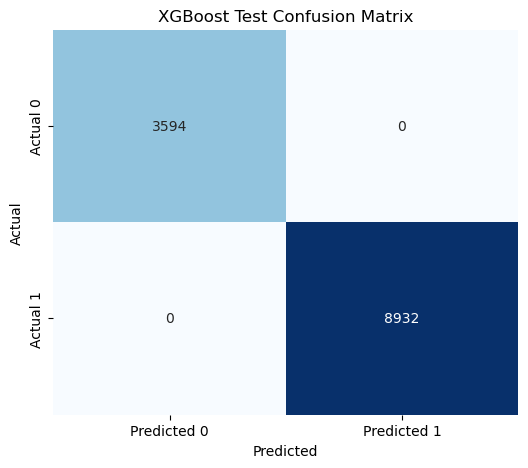

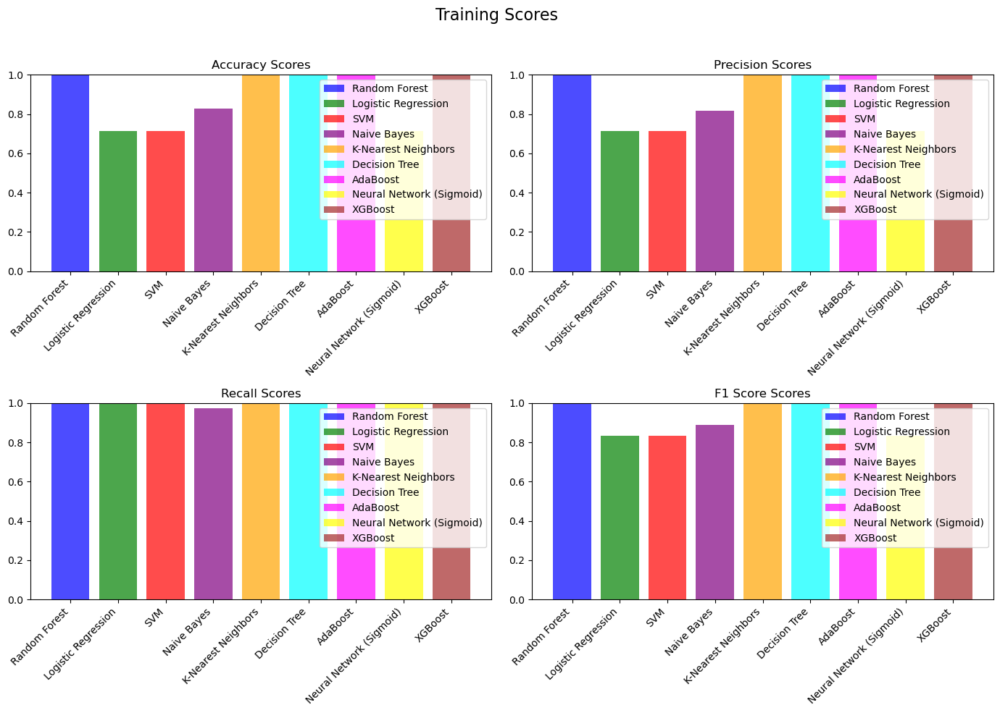

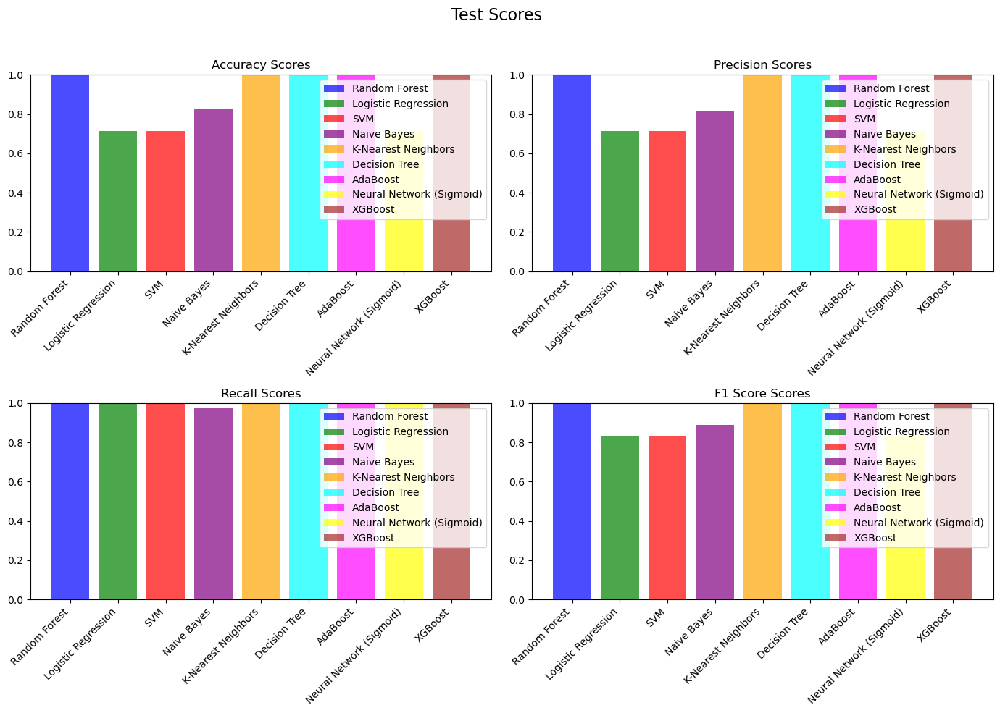

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

logreg_classifier = LogisticRegression()
svm_classifier = SVC()
nb_classifier = GaussianNB()
knn_classifier = KNeighborsClassifier()
dt_classifier = DecisionTreeClassifier()
ada_classifier = AdaBoostClassifier()
sigmoid_nn_classifier = MLPClassifier(activation='logistic')
softmax_nn_classifier = MLPClassifier(activation='softmax')
xgb_classifier = xgb.XGBClassifier()
rf_classifier = RandomForestClassifier()
classifiers = {
    'Random Forest': rf_classifier,
    'Logistic Regression': logreg_classifier,
    'SVM': svm_classifier,
    'Naive Bayes': nb_classifier,
    'K-Nearest Neighbors': knn_classifier,
    'Decision Tree': dt_classifier,
    'AdaBoost': ada_classifier,
    'Neural Network (Sigmoid)': sigmoid_nn_classifier,
    'XGBoost': xgb_classifier
}

accuracy_scores_train = []
precision_scores_train = []
recall_scores_train = []
f1_scores_train = []

accuracy_scores_test = []
precision_scores_test = []
recall_scores_test = []
f1_scores_test = []

for name, classifier in classifiers.items():
    print(f"Training and evaluating {name}...")
    classifier.fit(X_train, y_train)

    y_train_pred = classifier.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    train_precision = precision_score(y_train, y_train_pred)
    train_recall = recall_score(y_train, y_train_pred)
    train_f1 = f1_score(y_train, y_train_pred)

    y_test_pred = classifier.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_precision = precision_score(y_test, y_test_pred)
    test_recall = recall_score(y_test, y_test_pred)
    test_f1 = f1_score(y_test, y_test_pred)

    conf_matrix_train = confusion_matrix(y_train, y_train_pred)
    conf_matrix_test = confusion_matrix(y_test, y_test_pred)
    
    accuracy_scores_train.append(train_accuracy)
    precision_scores_train.append(train_precision)
    recall_scores_train.append(train_recall)
    f1_scores_train.append(train_f1)

    accuracy_scores_test.append(test_accuracy)
    precision_scores_test.append(test_precision)
    recall_scores_test.append(test_recall)
    f1_scores_test.append(test_f1)
    
    print("\nTraining Scores:")
    print(f"Accuracy: {train_accuracy:.4f}")
    print(f"Precision: {train_precision:.4f}")
    print(f"Recall: {train_recall:.4f}")
    print(f"F1 Score: {train_f1:.4f}")

    print("\nTest Scores:")
    print(f"Accuracy: {test_accuracy:.4f}")
    print(f"Precision: {test_precision:.4f}")
    print(f"Recall: {test_recall:.4f}")
    print(f"F1 Score: {test_f1:.4f}")

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Training Confusion Matrix")
    plt.show()

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Test Confusion Matrix")
    plt.show()

score_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
colors = ['blue', 'green', 'red', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown']

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Training Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_train, precision_scores_train, recall_scores_train, f1_scores_train]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Test Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_test, precision_scores_test, recall_scores_test, f1_scores_test]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')  
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

plt.show()


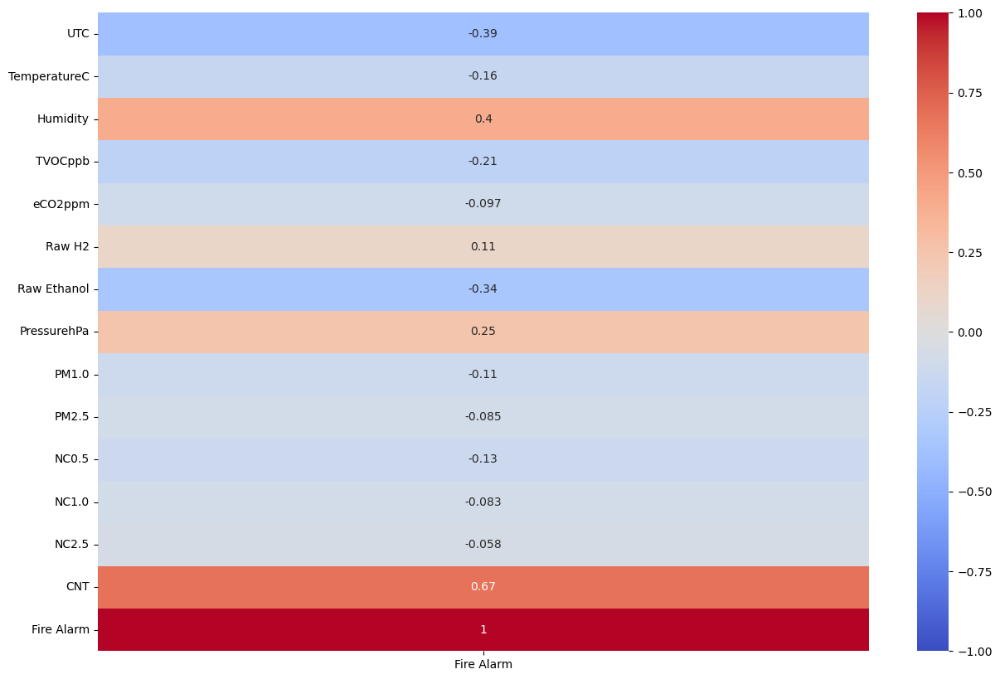

In [21]:
correlation_matrix = df.corr()
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix[['Fire Alarm']], annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.show()


Training and evaluating Random Forest...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


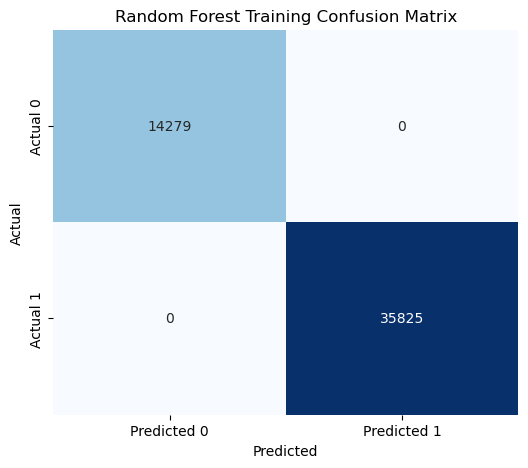

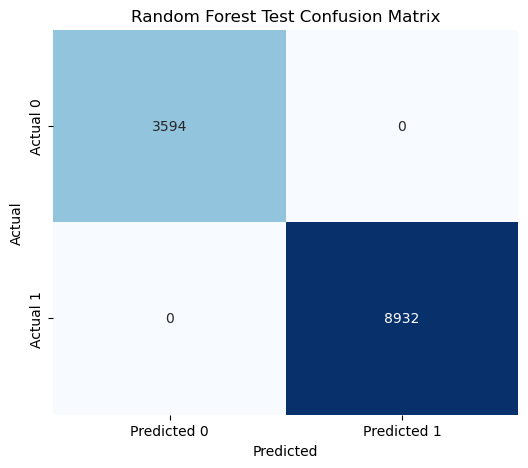

Training and evaluating Logistic Regression...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


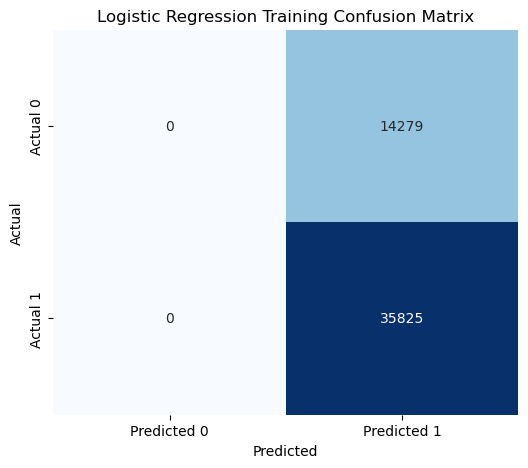

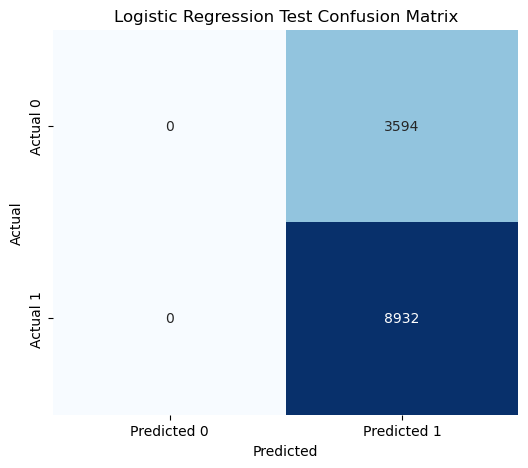

Training and evaluating SVM...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


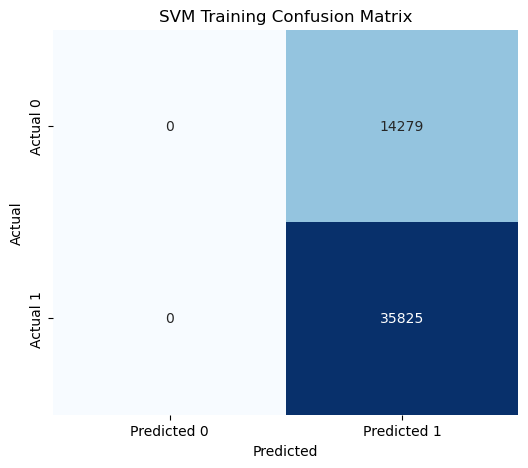

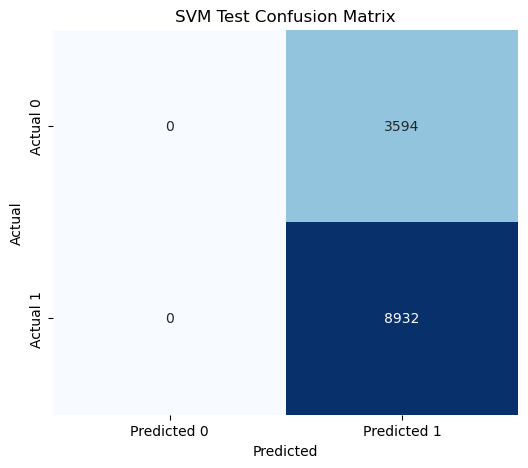

Training and evaluating Naive Bayes...

Training Scores:
Accuracy: 0.8785
Precision: 0.8724
Recall: 0.9723
F1 Score: 0.9196

Test Scores:
Accuracy: 0.8787
Precision: 0.8740
Recall: 0.9695
F1 Score: 0.9193


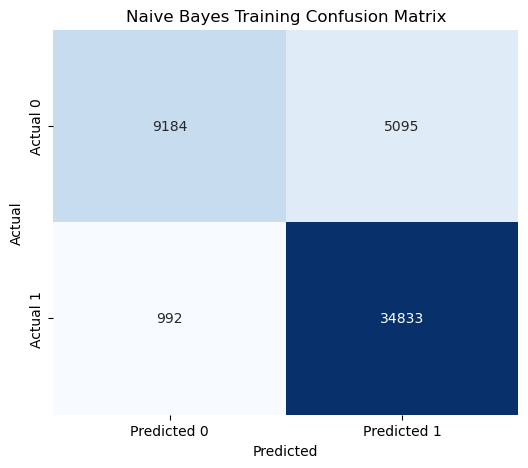

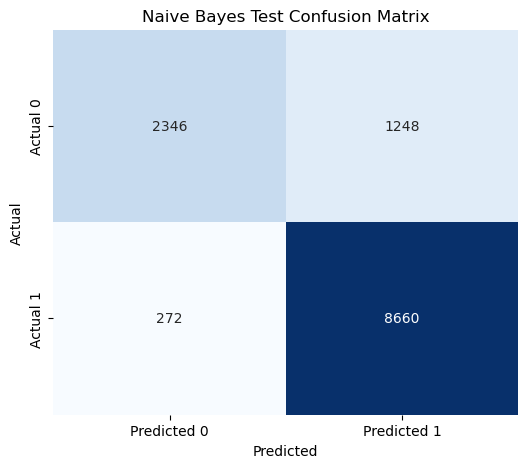

Training and evaluating K-Nearest Neighbors...

Training Scores:
Accuracy: 0.9997
Precision: 0.9997
Recall: 0.9999
F1 Score: 0.9998

Test Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 1.0000
F1 Score: 0.9999


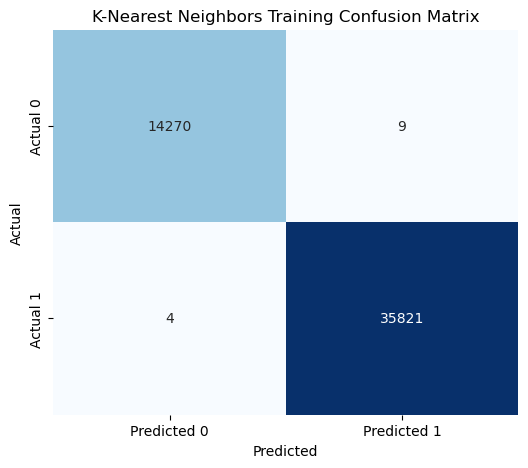

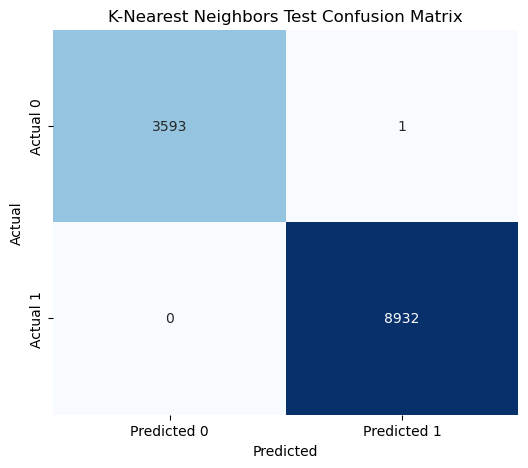

Training and evaluating Decision Tree...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


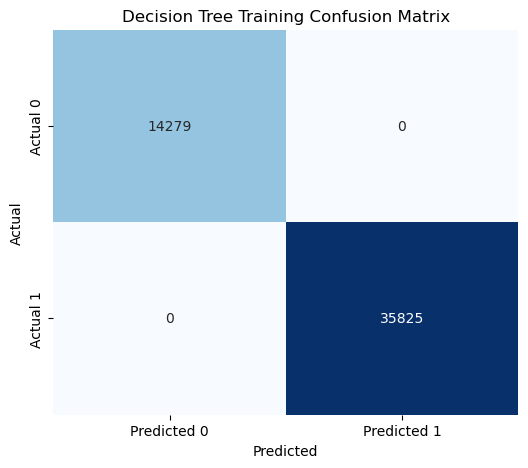

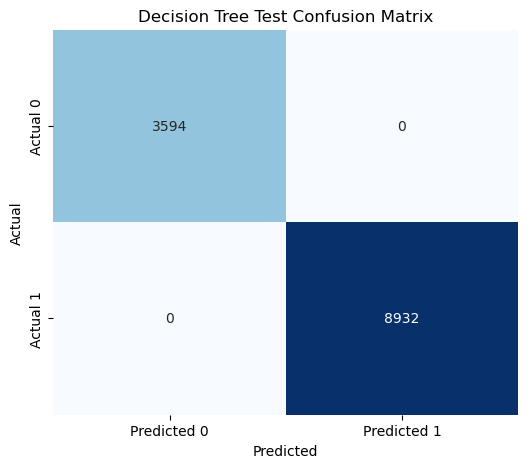

Training and evaluating AdaBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


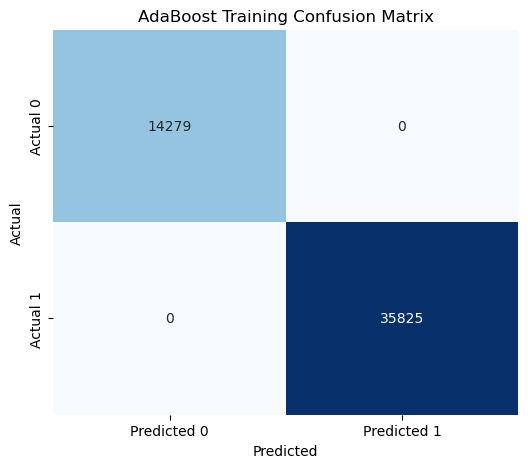

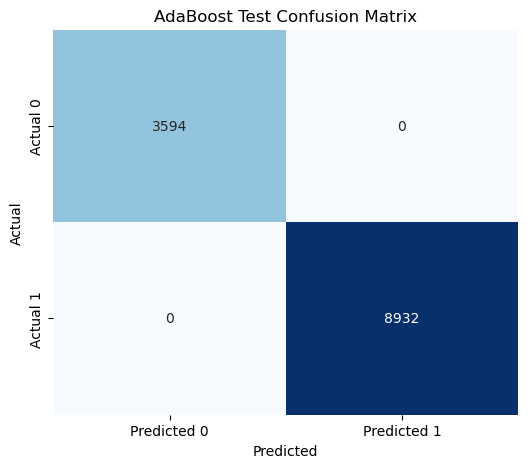

Training and evaluating Neural Network (Sigmoid)...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


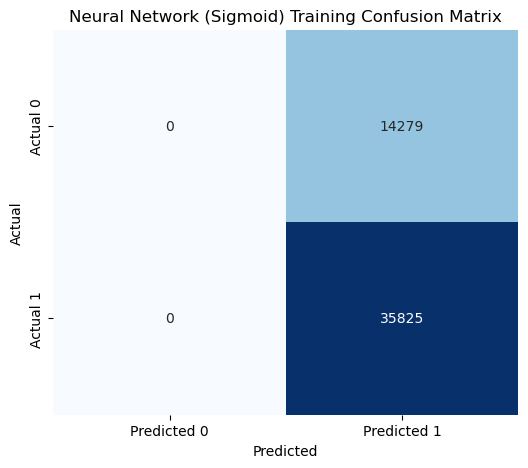

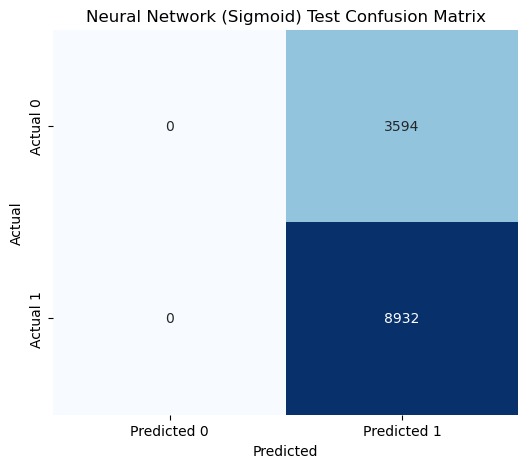

Training and evaluating XGBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


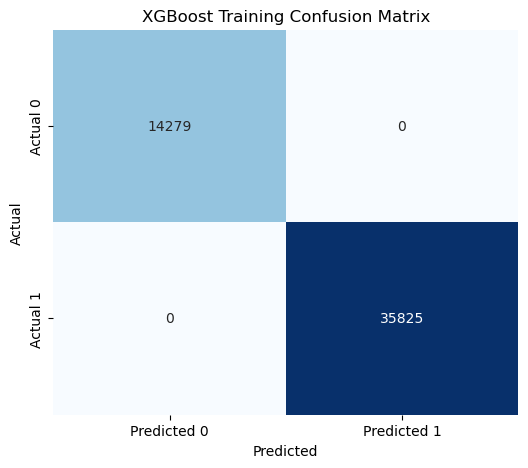

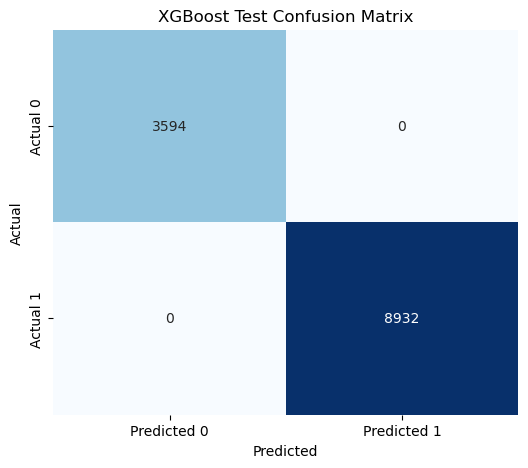

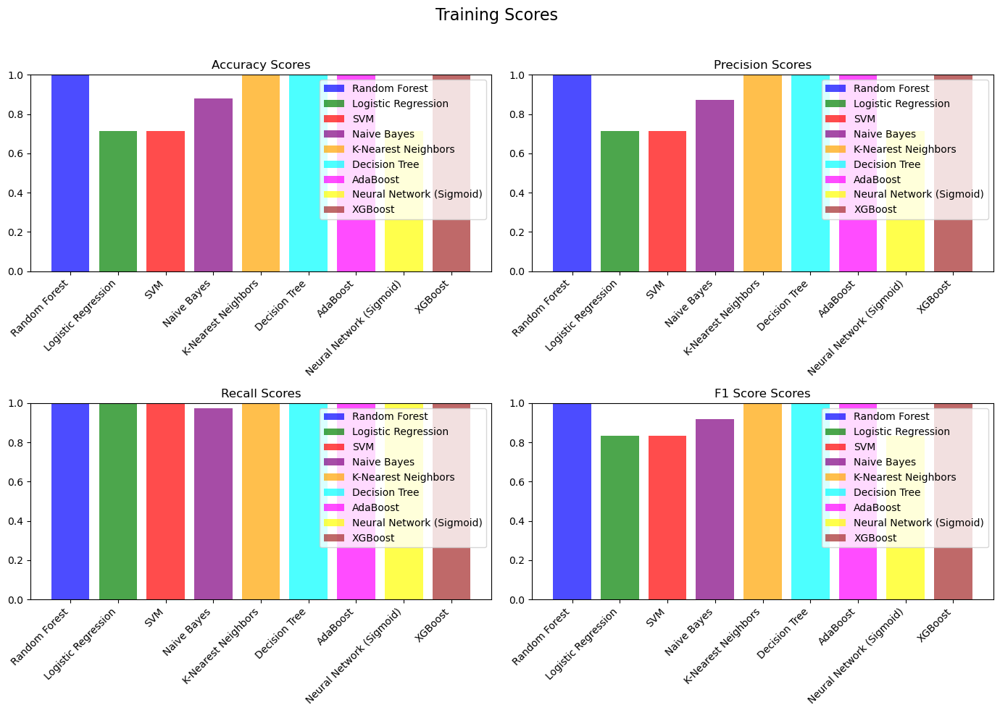

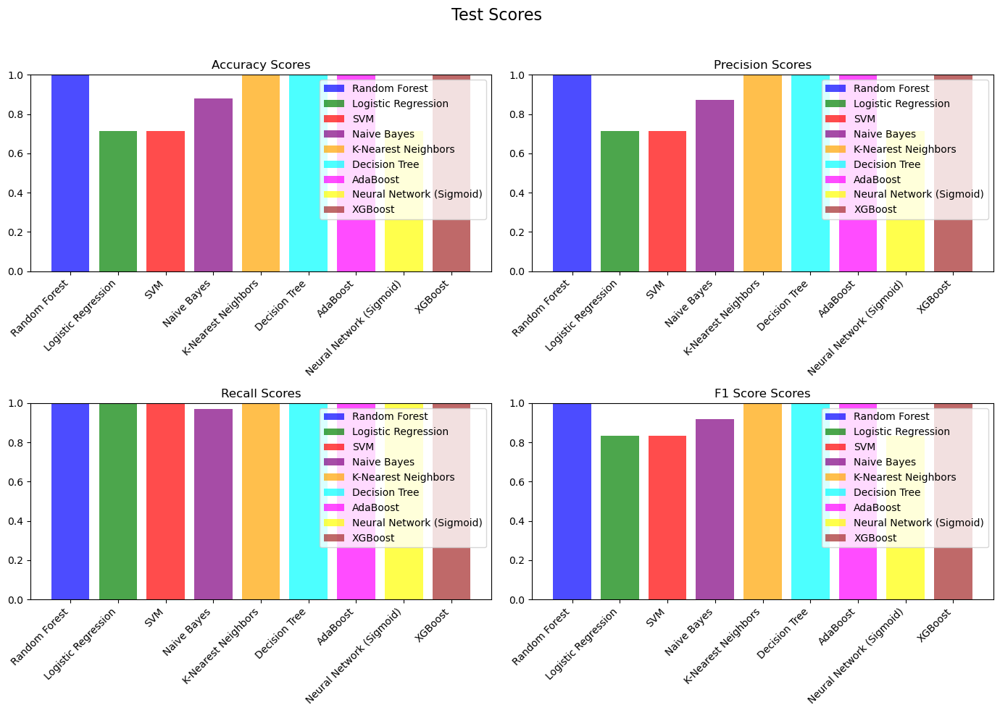

In [22]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train = X_train[['UTC', 'Humidity', 'Raw Ethanol', 'PressurehPa', 'CNT', 'Raw H2']]
X_test = X_test[['UTC', 'Humidity', 'Raw Ethanol', 'PressurehPa', 'CNT', 'Raw H2']]

logreg_classifier = LogisticRegression()
svm_classifier = SVC()
nb_classifier = GaussianNB()
knn_classifier = KNeighborsClassifier()
dt_classifier = DecisionTreeClassifier()
ada_classifier = AdaBoostClassifier()
sigmoid_nn_classifier = MLPClassifier(activation='logistic')
softmax_nn_classifier = MLPClassifier(activation='softmax')
xgb_classifier = xgb.XGBClassifier()
rf_classifier = RandomForestClassifier()
classifiers = {
    'Random Forest': rf_classifier,
    'Logistic Regression': logreg_classifier,
    'SVM': svm_classifier,
    'Naive Bayes': nb_classifier,
    'K-Nearest Neighbors': knn_classifier,
    'Decision Tree': dt_classifier,
    'AdaBoost': ada_classifier,
    'Neural Network (Sigmoid)': sigmoid_nn_classifier,
    'XGBoost': xgb_classifier
}

accuracy_scores_train = []
precision_scores_train = []
recall_scores_train = []
f1_scores_train = []

accuracy_scores_test = []
precision_scores_test = []
recall_scores_test = []
f1_scores_test = []

for name, classifier in classifiers.items():
    print(f"Training and evaluating {name}...")
    classifier.fit(X_train, y_train)

    y_train_pred = classifier.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    train_precision = precision_score(y_train, y_train_pred)
    train_recall = recall_score(y_train, y_train_pred)
    train_f1 = f1_score(y_train, y_train_pred)

    y_test_pred = classifier.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_precision = precision_score(y_test, y_test_pred)
    test_recall = recall_score(y_test, y_test_pred)
    test_f1 = f1_score(y_test, y_test_pred)

    conf_matrix_train = confusion_matrix(y_train, y_train_pred)
    conf_matrix_test = confusion_matrix(y_test, y_test_pred)
    
    accuracy_scores_train.append(train_accuracy)
    precision_scores_train.append(train_precision)
    recall_scores_train.append(train_recall)
    f1_scores_train.append(train_f1)

    accuracy_scores_test.append(test_accuracy)
    precision_scores_test.append(test_precision)
    recall_scores_test.append(test_recall)
    f1_scores_test.append(test_f1)
    
    print("\nTraining Scores:")
    print(f"Accuracy: {train_accuracy:.4f}")
    print(f"Precision: {train_precision:.4f}")
    print(f"Recall: {train_recall:.4f}")
    print(f"F1 Score: {train_f1:.4f}")

    print("\nTest Scores:")
    print(f"Accuracy: {test_accuracy:.4f}")
    print(f"Precision: {test_precision:.4f}")
    print(f"Recall: {test_recall:.4f}")
    print(f"F1 Score: {test_f1:.4f}")

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Training Confusion Matrix")
    plt.show()

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Test Confusion Matrix")
    plt.show()

score_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
colors = ['blue', 'green', 'red', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown']

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Training Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_train, precision_scores_train, recall_scores_train, f1_scores_train]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Test Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_test, precision_scores_test, recall_scores_test, f1_scores_test]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')  
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

plt.show()


In [26]:
feature_importances

array([5.55839784e-10, 3.05364571e-17, 5.80141823e-15, 3.16709703e-16,
       2.41168932e-14, 4.46433663e-15])

Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325
Confusion Matrix:
[[   0 3594]
 [   0 8932]]


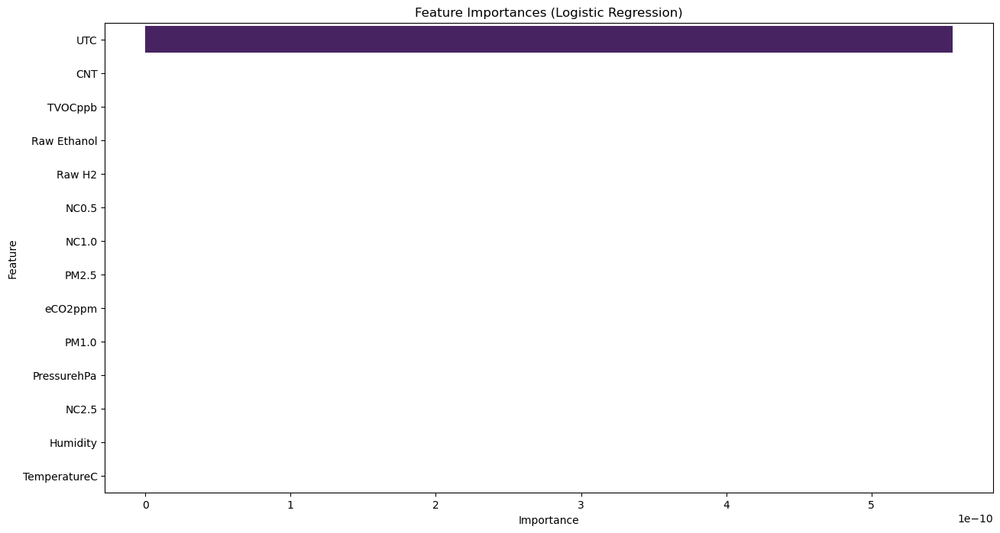


Feature Importances:
         Feature    Importance
0            UTC  5.558398e-10
13           CNT  2.411690e-14
3        TVOCppb -6.037594e-15
6    Raw Ethanol  5.801418e-15
5         Raw H2  4.464337e-15
10         NC0.5 -1.973757e-15
11         NC1.0 -6.327477e-16
9          PM2.5 -5.802411e-16
4        eCO2ppm -5.025996e-16
8          PM1.0 -3.614894e-16
7    PressurehPa  3.167097e-16
12         NC2.5 -2.074308e-16
2       Humidity  3.053646e-17
1   TemperatureC -4.167821e-18


In [27]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
logreg_classifier = LogisticRegression()
logreg_classifier.fit(X_train, y_train)

y_pred = logreg_classifier.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

print("Confusion Matrix:")
print(conf_matrix)

feature_importances = logreg_classifier.coef_[0]

feature_importance_df_logreg = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

feature_importance_df_logreg = feature_importance_df_logreg.sort_values(by='Importance', key=lambda x: abs(x), ascending=False)

plt.figure(figsize=(15, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df_logreg, palette='viridis')
plt.title("Feature Importances (Logistic Regression)")
plt.show()

print("\nFeature Importances:")
print(feature_importance_df_logreg)

Training and evaluating Random Forest...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 1.0000
F1 Score: 0.9999


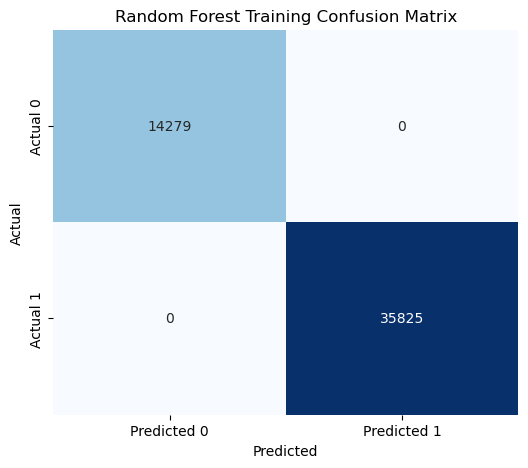

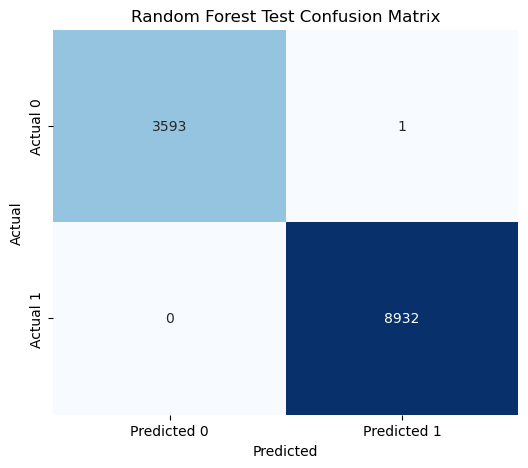

Training and evaluating Logistic Regression...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


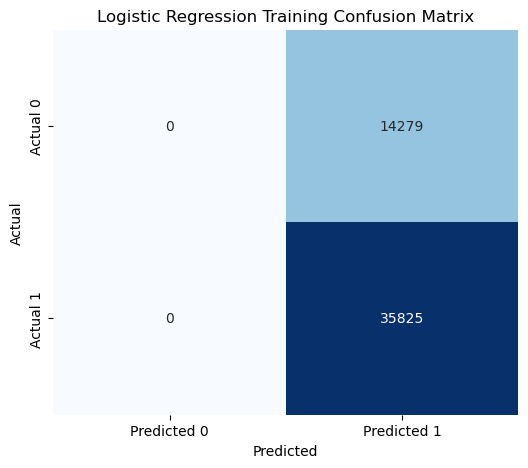

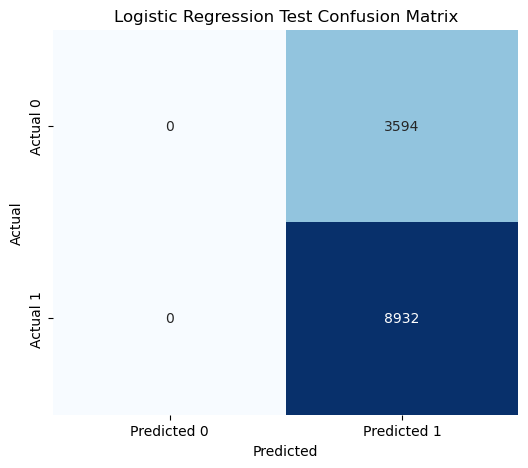

Training and evaluating SVM...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


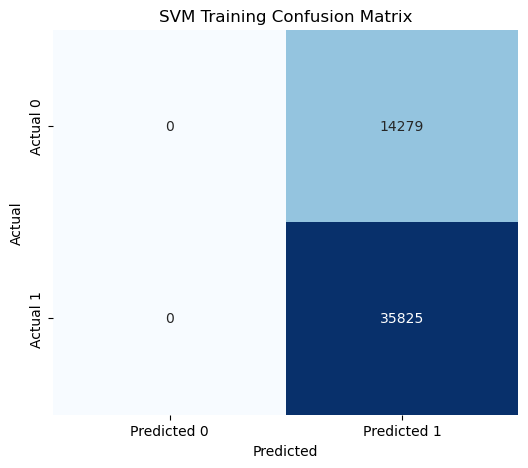

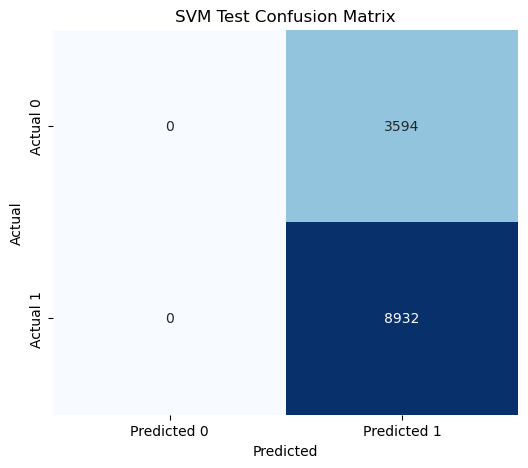

Training and evaluating Naive Bayes...

Training Scores:
Accuracy: 0.9232
Precision: 0.9248
Recall: 0.9717
F1 Score: 0.9477

Test Scores:
Accuracy: 0.9230
Precision: 0.9262
Recall: 0.9693
F1 Score: 0.9473


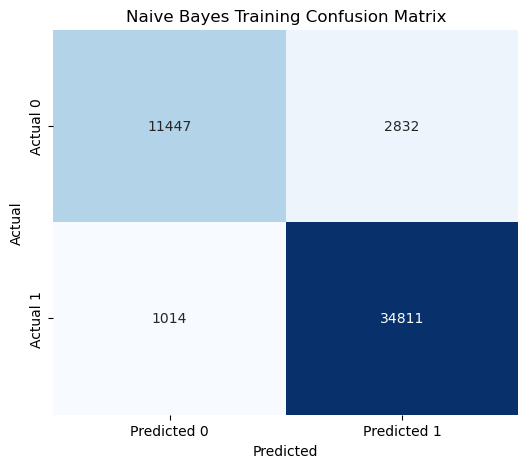

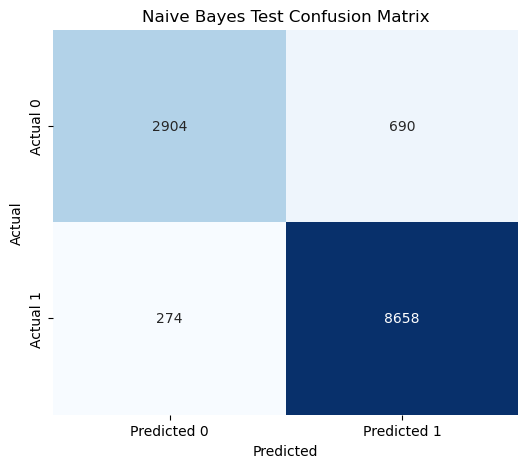

Training and evaluating K-Nearest Neighbors...

Training Scores:
Accuracy: 0.9999
Precision: 1.0000
Recall: 0.9999
F1 Score: 0.9999

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


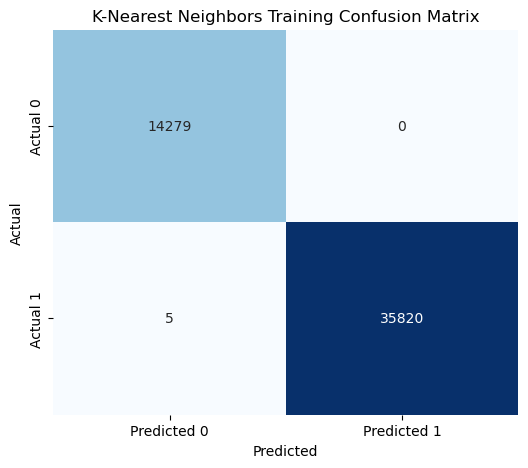

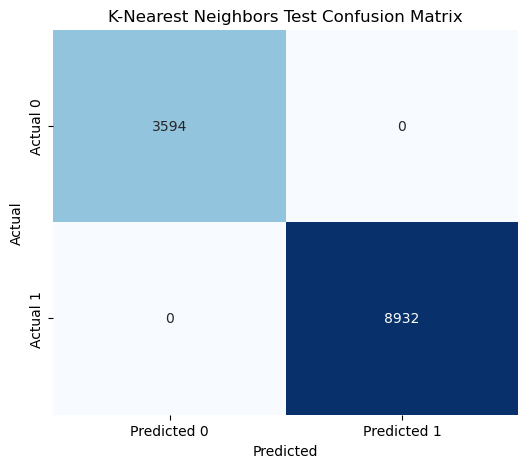

Training and evaluating Decision Tree...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 0.9998
Precision: 0.9998
Recall: 1.0000
F1 Score: 0.9999


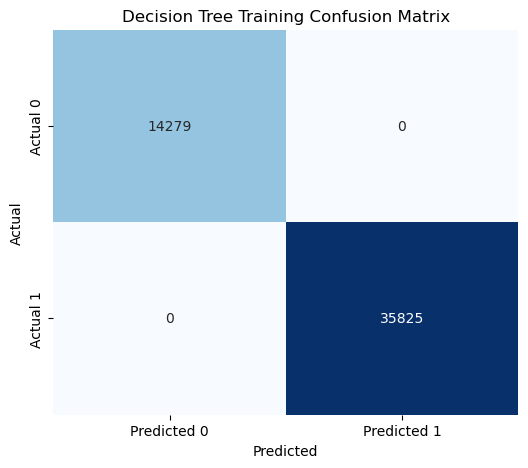

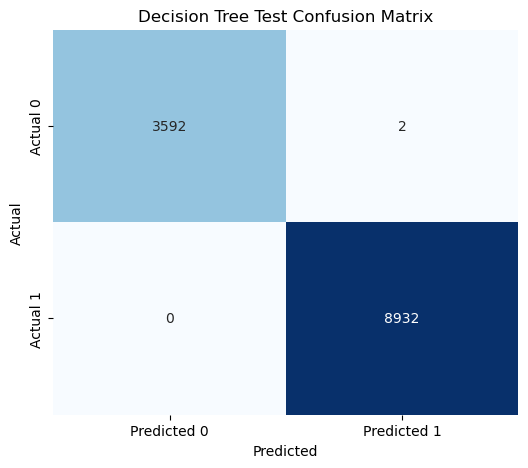

Training and evaluating AdaBoost...

Training Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 0.9999
F1 Score: 0.9999

Test Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 1.0000
F1 Score: 0.9999


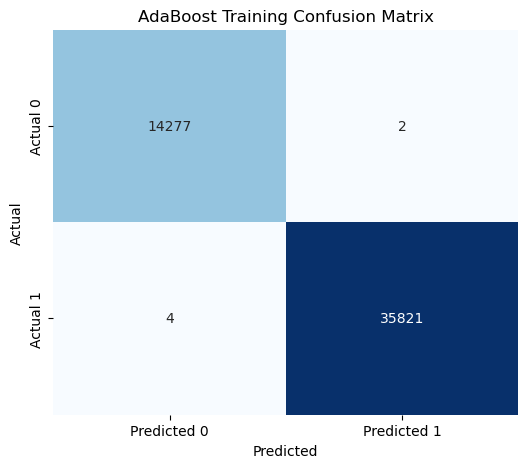

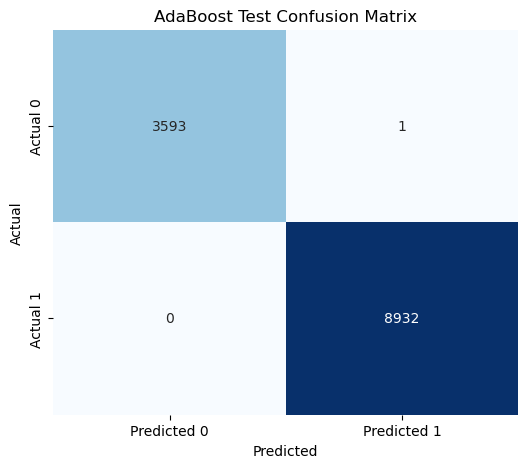

Training and evaluating Neural Network (Sigmoid)...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


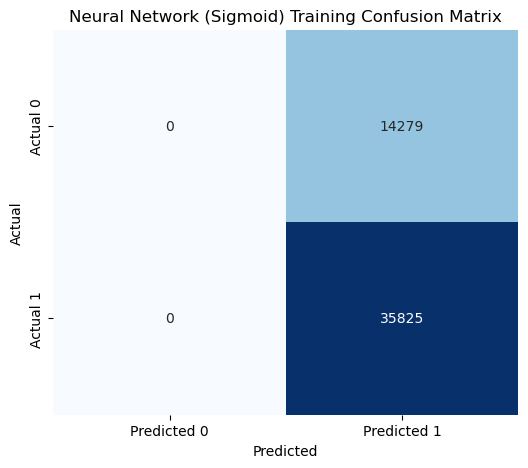

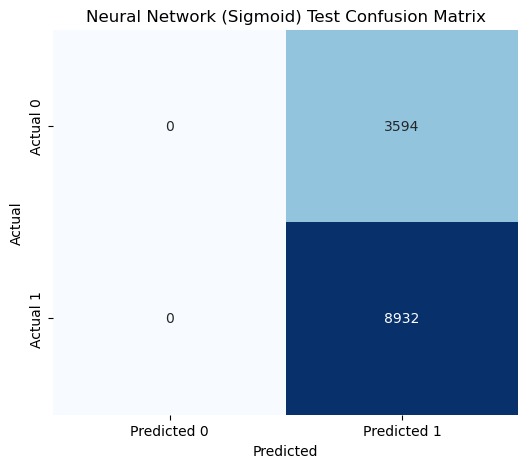

Training and evaluating XGBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


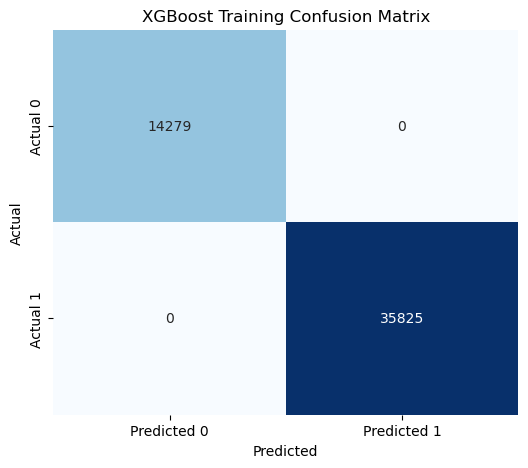

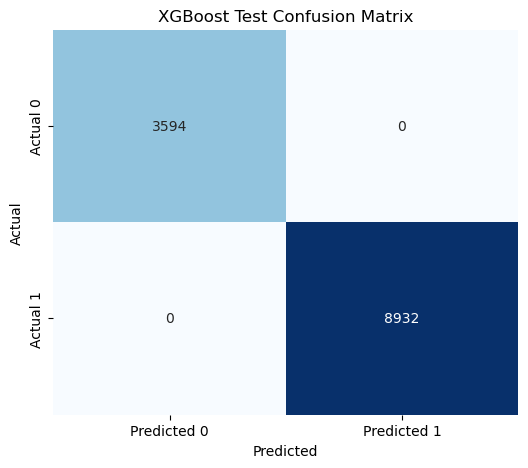

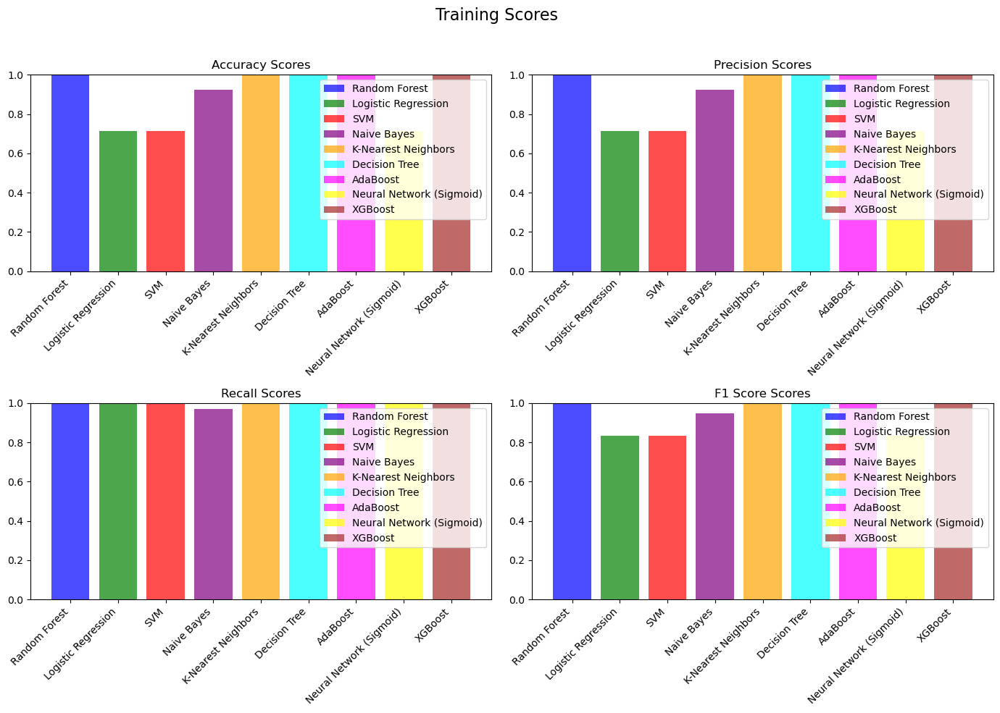

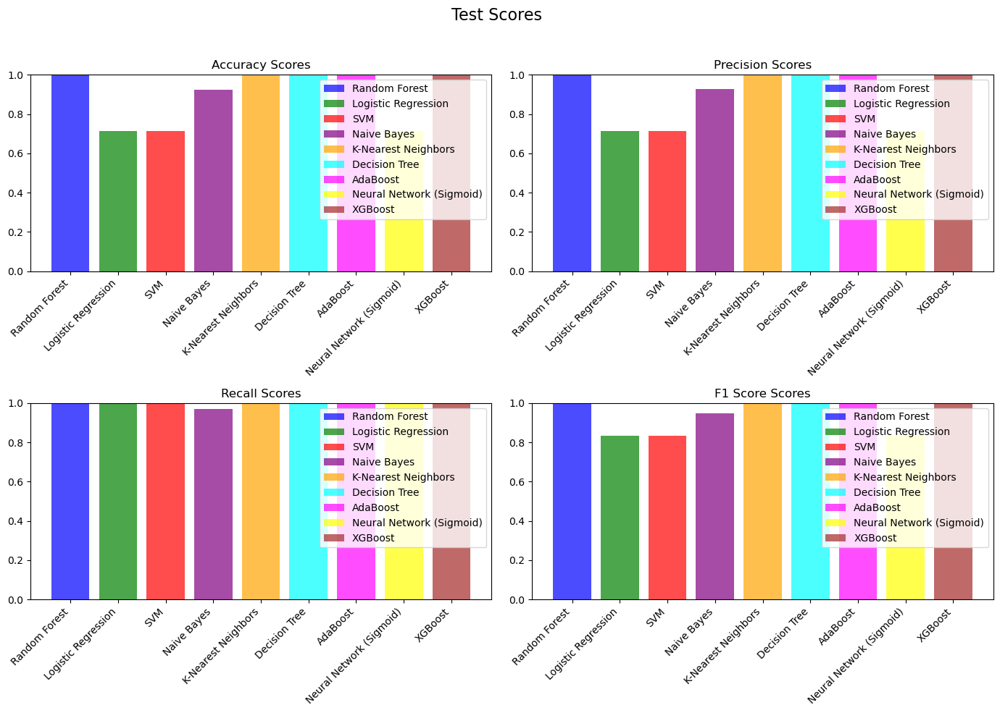

In [28]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train = X_train[['UTC', 'CNT']]
X_test = X_test[['UTC', 'CNT']]

logreg_classifier = LogisticRegression()
svm_classifier = SVC()
nb_classifier = GaussianNB()
knn_classifier = KNeighborsClassifier()
dt_classifier = DecisionTreeClassifier()
ada_classifier = AdaBoostClassifier()
sigmoid_nn_classifier = MLPClassifier(activation='logistic')
softmax_nn_classifier = MLPClassifier(activation='softmax')
xgb_classifier = xgb.XGBClassifier()
rf_classifier = RandomForestClassifier()
classifiers = {
    'Random Forest': rf_classifier,
    'Logistic Regression': logreg_classifier,
    'SVM': svm_classifier,
    'Naive Bayes': nb_classifier,
    'K-Nearest Neighbors': knn_classifier,
    'Decision Tree': dt_classifier,
    'AdaBoost': ada_classifier,
    'Neural Network (Sigmoid)': sigmoid_nn_classifier,
    'XGBoost': xgb_classifier
}

accuracy_scores_train = []
precision_scores_train = []
recall_scores_train = []
f1_scores_train = []

accuracy_scores_test = []
precision_scores_test = []
recall_scores_test = []
f1_scores_test = []

for name, classifier in classifiers.items():
    print(f"Training and evaluating {name}...")
    classifier.fit(X_train, y_train)

    y_train_pred = classifier.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    train_precision = precision_score(y_train, y_train_pred)
    train_recall = recall_score(y_train, y_train_pred)
    train_f1 = f1_score(y_train, y_train_pred)

    y_test_pred = classifier.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_precision = precision_score(y_test, y_test_pred)
    test_recall = recall_score(y_test, y_test_pred)
    test_f1 = f1_score(y_test, y_test_pred)

    conf_matrix_train = confusion_matrix(y_train, y_train_pred)
    conf_matrix_test = confusion_matrix(y_test, y_test_pred)
    
    accuracy_scores_train.append(train_accuracy)
    precision_scores_train.append(train_precision)
    recall_scores_train.append(train_recall)
    f1_scores_train.append(train_f1)

    accuracy_scores_test.append(test_accuracy)
    precision_scores_test.append(test_precision)
    recall_scores_test.append(test_recall)
    f1_scores_test.append(test_f1)
    
    print("\nTraining Scores:")
    print(f"Accuracy: {train_accuracy:.4f}")
    print(f"Precision: {train_precision:.4f}")
    print(f"Recall: {train_recall:.4f}")
    print(f"F1 Score: {train_f1:.4f}")

    print("\nTest Scores:")
    print(f"Accuracy: {test_accuracy:.4f}")
    print(f"Precision: {test_precision:.4f}")
    print(f"Recall: {test_recall:.4f}")
    print(f"F1 Score: {test_f1:.4f}")

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Training Confusion Matrix")
    plt.show()

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Test Confusion Matrix")
    plt.show()

score_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
colors = ['blue', 'green', 'red', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown']

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Training Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_train, precision_scores_train, recall_scores_train, f1_scores_train]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Test Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_test, precision_scores_test, recall_scores_test, f1_scores_test]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')  
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

plt.show()


Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000
Confusion Matrix:
[[3594    0]
 [   0 8932]]


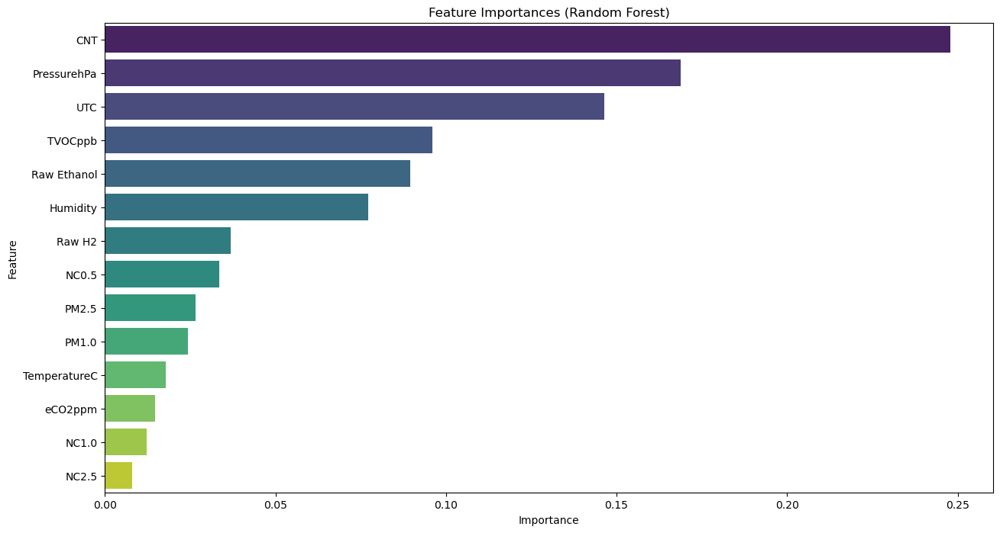


Feature Importances:
         Feature  Importance
13           CNT    0.247929
7    PressurehPa    0.168683
0            UTC    0.146412
3        TVOCppb    0.095947
6    Raw Ethanol    0.089595
2       Humidity    0.077104
5         Raw H2    0.036819
10         NC0.5    0.033621
9          PM2.5    0.026668
8          PM1.0    0.024353
1   TemperatureC    0.017855
4        eCO2ppm    0.014612
11         NC1.0    0.012336
12         NC2.5    0.008067


In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train, y_train)

y_pred = rf_classifier.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

print("Confusion Matrix:")
print(conf_matrix)

feature_importances = rf_classifier.feature_importances_

feature_importance_df_rf = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

feature_importance_df_rf = feature_importance_df_rf.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(15, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df_rf, palette='viridis')
plt.title("Feature Importances (Random Forest)")
plt.show()

print("\nFeature Importances:")
print(feature_importance_df_rf)


Training and evaluating Random Forest...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


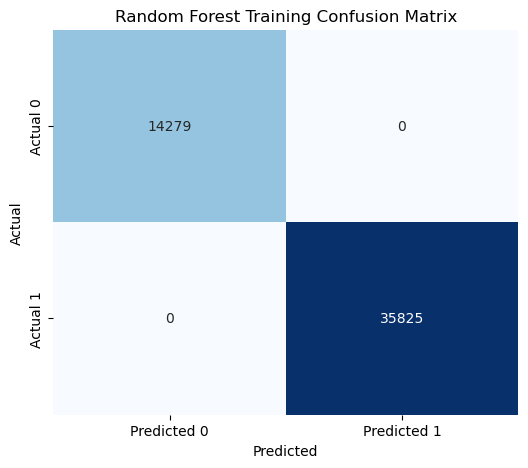

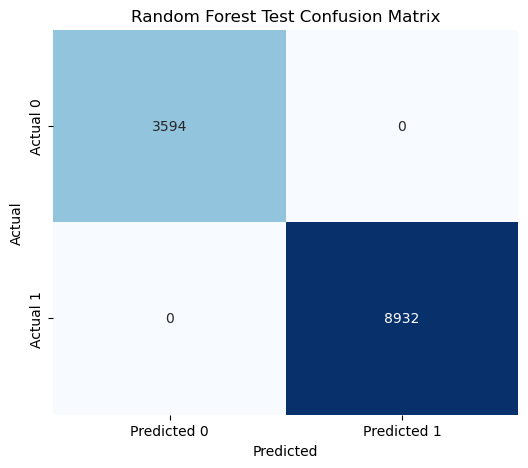

Training and evaluating Logistic Regression...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


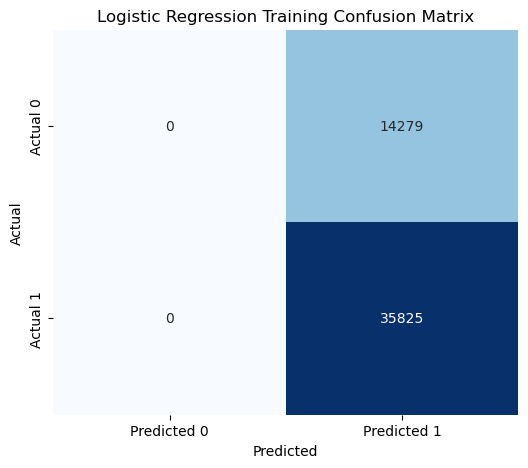

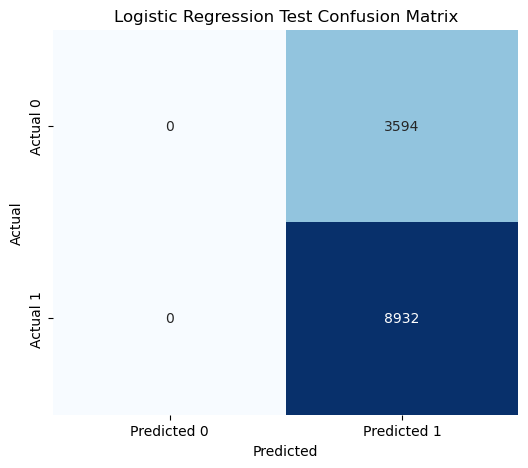

Training and evaluating SVM...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


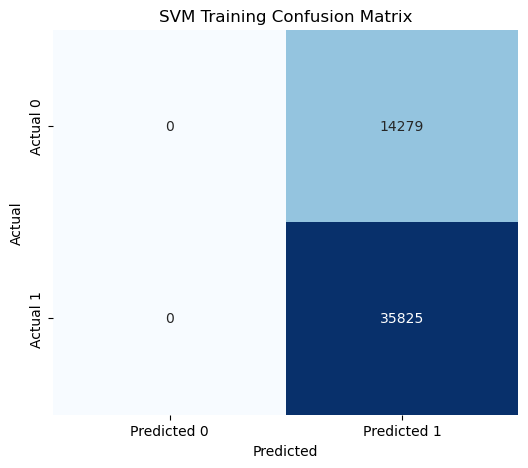

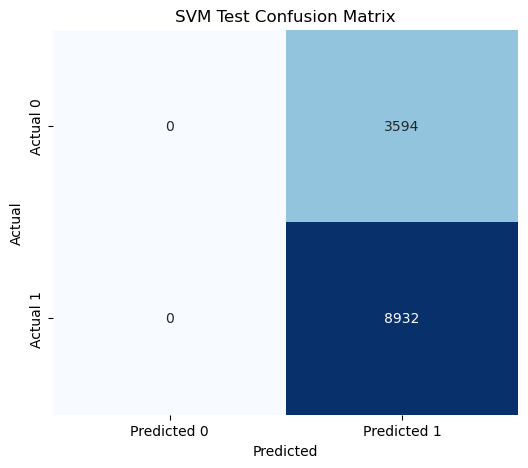

Training and evaluating Naive Bayes...

Training Scores:
Accuracy: 0.8785
Precision: 0.8722
Recall: 0.9726
F1 Score: 0.9197

Test Scores:
Accuracy: 0.8792
Precision: 0.8743
Recall: 0.9701
F1 Score: 0.9197


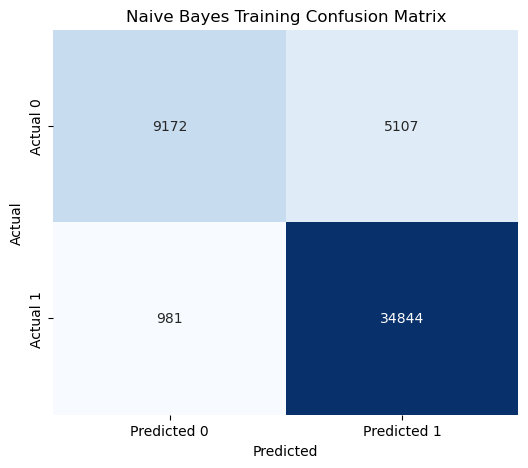

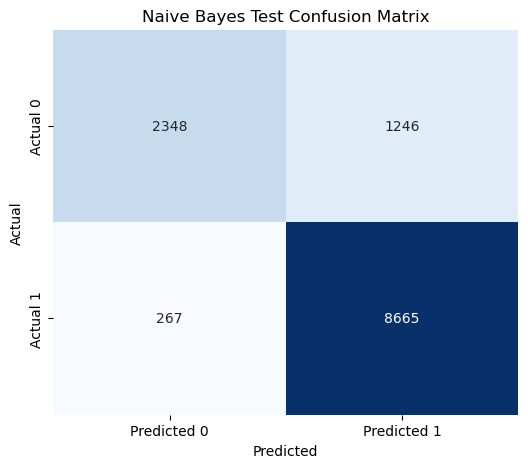

Training and evaluating K-Nearest Neighbors...

Training Scores:
Accuracy: 0.9998
Precision: 0.9998
Recall: 0.9999
F1 Score: 0.9999

Test Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 1.0000
F1 Score: 0.9999


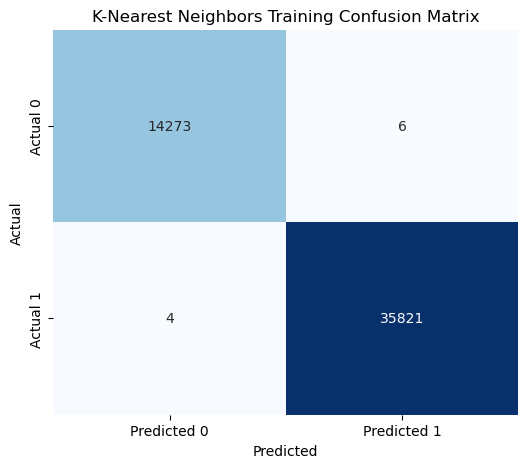

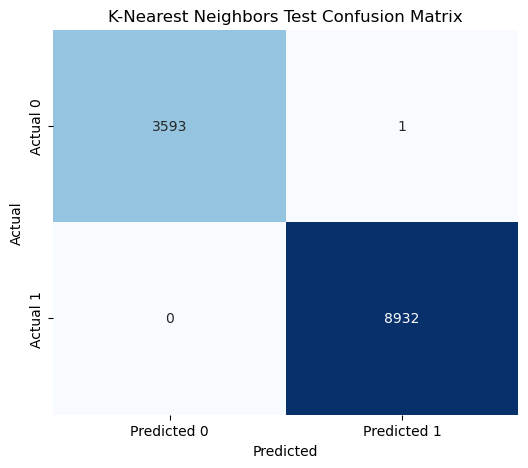

Training and evaluating Decision Tree...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 1.0000
F1 Score: 0.9999


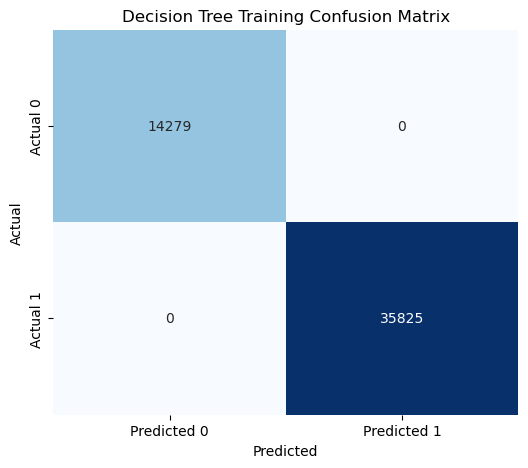

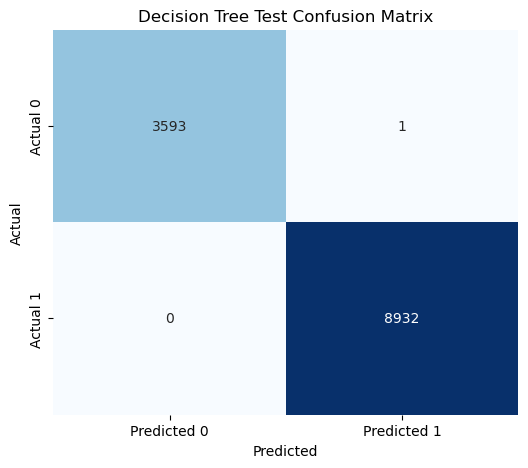

Training and evaluating AdaBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 1.0000
F1 Score: 0.9999


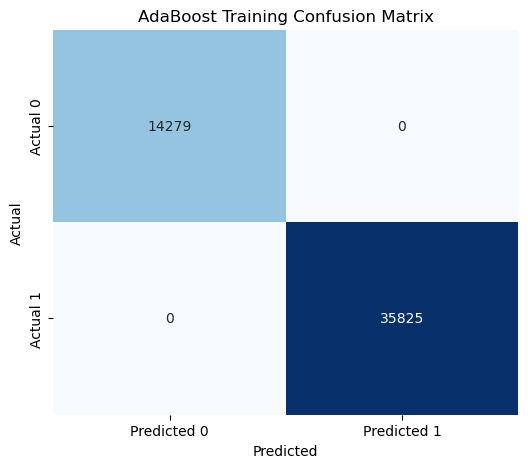

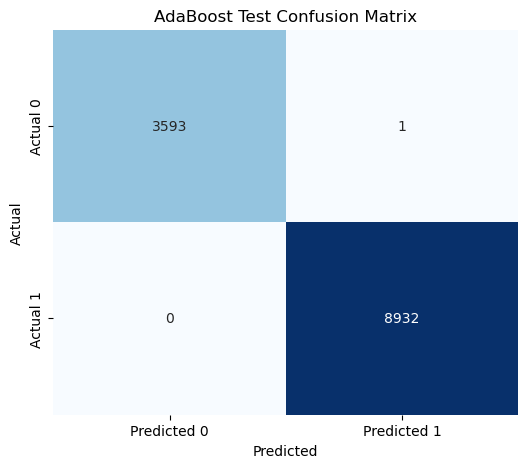

Training and evaluating Neural Network (Sigmoid)...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


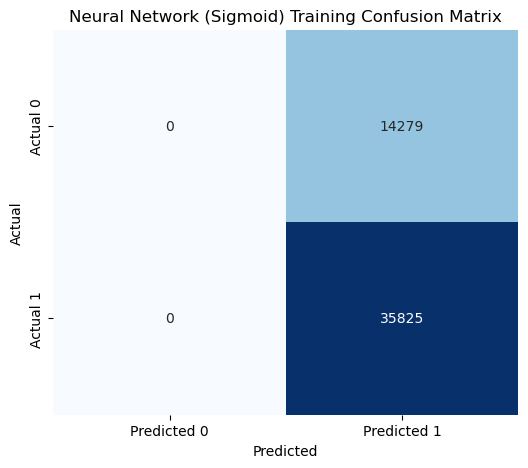

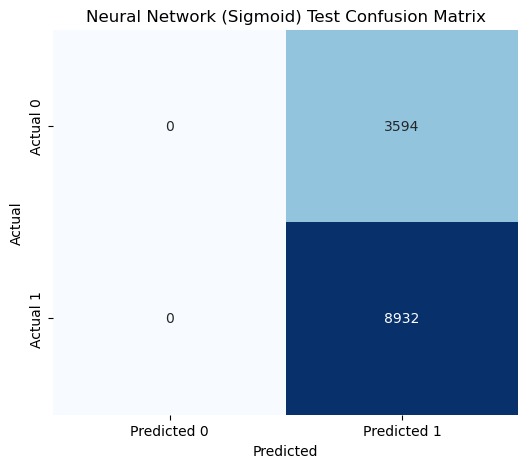

Training and evaluating XGBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


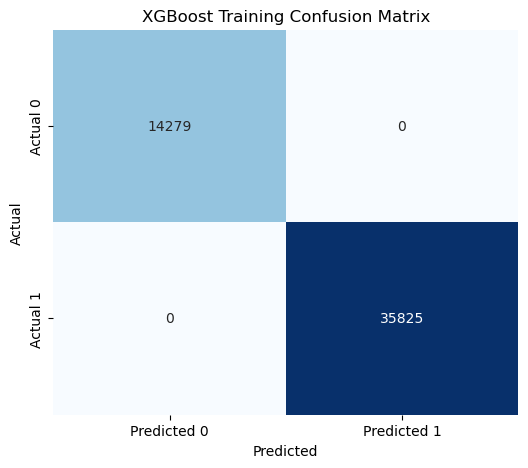

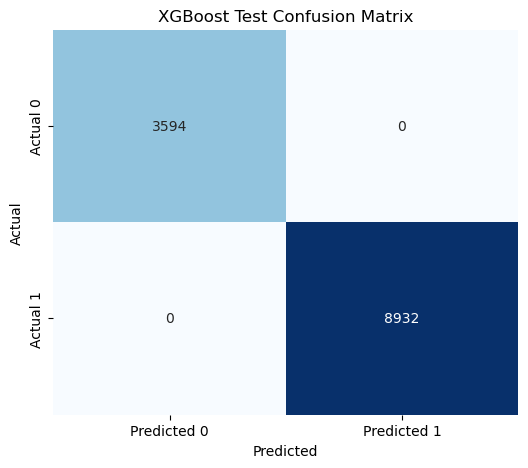

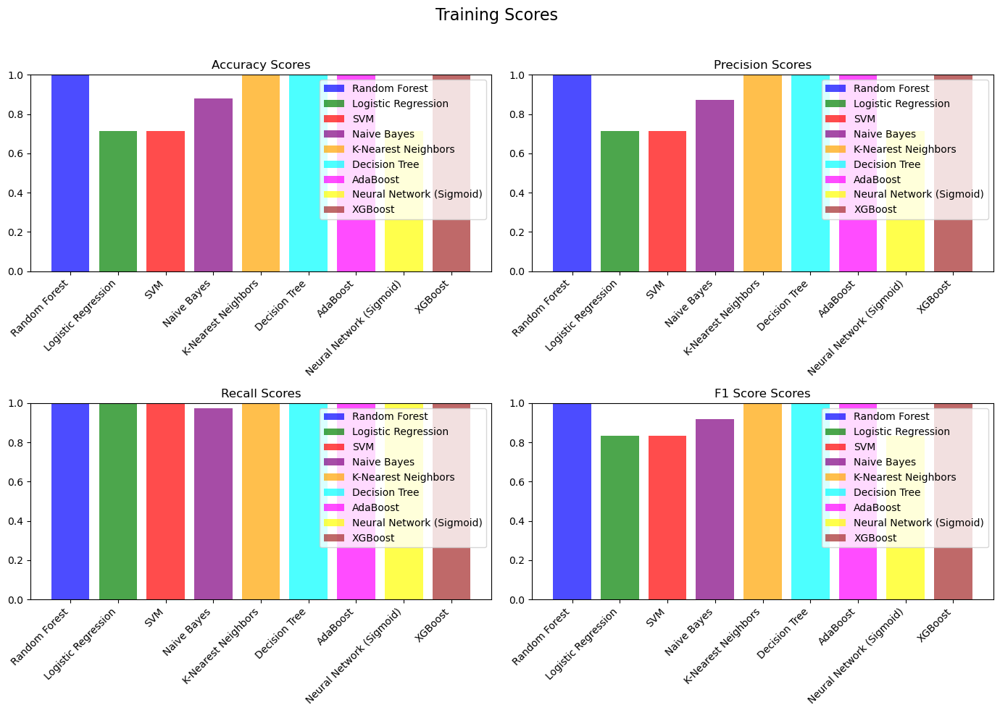

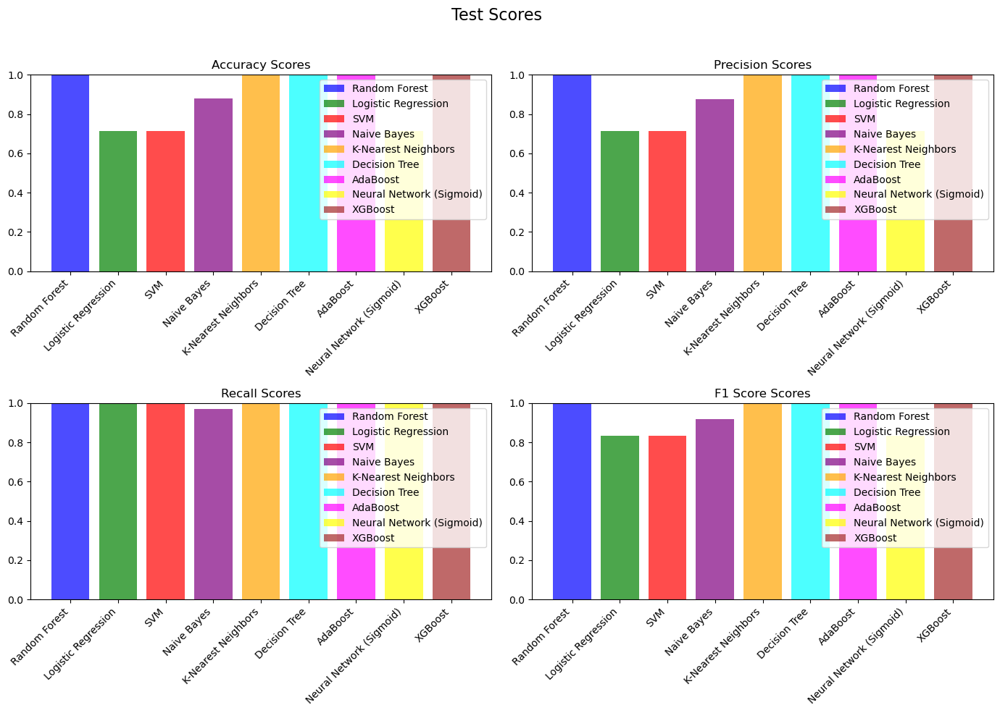

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train = X_train[['CNT', 'PressurehPa', 'UTC', 'Raw Ethanol', 'Humidity']]
X_test = X_test[['CNT', 'PressurehPa', 'UTC', 'Raw Ethanol', 'Humidity']]

logreg_classifier = LogisticRegression()
svm_classifier = SVC()
nb_classifier = GaussianNB()
knn_classifier = KNeighborsClassifier()
dt_classifier = DecisionTreeClassifier()
ada_classifier = AdaBoostClassifier()
sigmoid_nn_classifier = MLPClassifier(activation='logistic')
softmax_nn_classifier = MLPClassifier(activation='softmax')
xgb_classifier = xgb.XGBClassifier()
rf_classifier = RandomForestClassifier()
classifiers = {
    'Random Forest': rf_classifier,
    'Logistic Regression': logreg_classifier,
    'SVM': svm_classifier,
    'Naive Bayes': nb_classifier,
    'K-Nearest Neighbors': knn_classifier,
    'Decision Tree': dt_classifier,
    'AdaBoost': ada_classifier,
    'Neural Network (Sigmoid)': sigmoid_nn_classifier,
    'XGBoost': xgb_classifier
}

accuracy_scores_train = []
precision_scores_train = []
recall_scores_train = []
f1_scores_train = []

accuracy_scores_test = []
precision_scores_test = []
recall_scores_test = []
f1_scores_test = []

for name, classifier in classifiers.items():
    print(f"Training and evaluating {name}...")
    classifier.fit(X_train, y_train)

    y_train_pred = classifier.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    train_precision = precision_score(y_train, y_train_pred)
    train_recall = recall_score(y_train, y_train_pred)
    train_f1 = f1_score(y_train, y_train_pred)

    y_test_pred = classifier.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_precision = precision_score(y_test, y_test_pred)
    test_recall = recall_score(y_test, y_test_pred)
    test_f1 = f1_score(y_test, y_test_pred)

    conf_matrix_train = confusion_matrix(y_train, y_train_pred)
    conf_matrix_test = confusion_matrix(y_test, y_test_pred)
    
    accuracy_scores_train.append(train_accuracy)
    precision_scores_train.append(train_precision)
    recall_scores_train.append(train_recall)
    f1_scores_train.append(train_f1)

    accuracy_scores_test.append(test_accuracy)
    precision_scores_test.append(test_precision)
    recall_scores_test.append(test_recall)
    f1_scores_test.append(test_f1)
    
    print("\nTraining Scores:")
    print(f"Accuracy: {train_accuracy:.4f}")
    print(f"Precision: {train_precision:.4f}")
    print(f"Recall: {train_recall:.4f}")
    print(f"F1 Score: {train_f1:.4f}")

    print("\nTest Scores:")
    print(f"Accuracy: {test_accuracy:.4f}")
    print(f"Precision: {test_precision:.4f}")
    print(f"Recall: {test_recall:.4f}")
    print(f"F1 Score: {test_f1:.4f}")

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Training Confusion Matrix")
    plt.show()

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Test Confusion Matrix")
    plt.show()

score_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
colors = ['blue', 'green', 'red', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown']

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Training Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_train, precision_scores_train, recall_scores_train, f1_scores_train]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Test Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_test, precision_scores_test, recall_scores_test, f1_scores_test]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')  
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

plt.show()


Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000
Confusion Matrix:
[[3594    0]
 [   0 8932]]


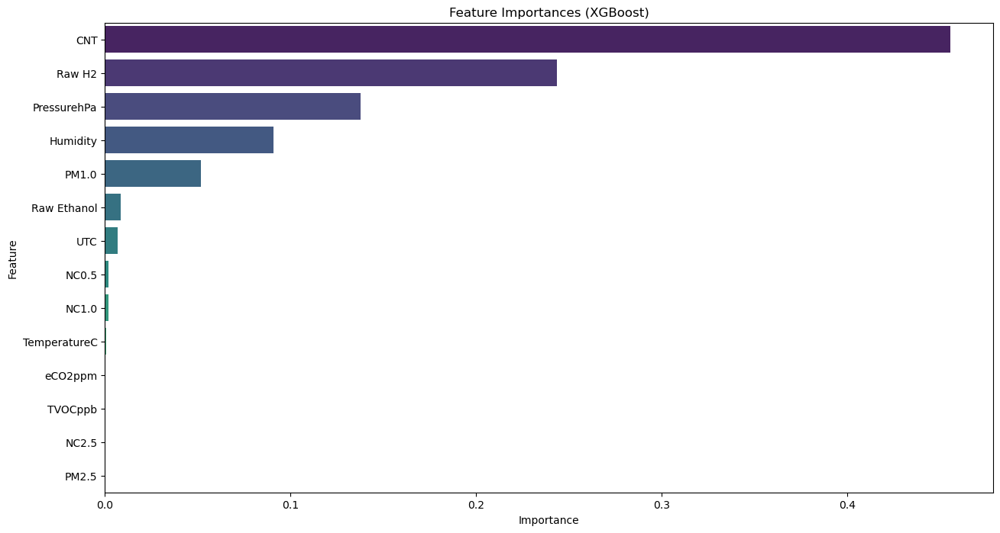


Feature Importances:
         Feature  Importance
13           CNT    0.455550
5         Raw H2    0.243535
7    PressurehPa    0.137775
2       Humidity    0.090846
8          PM1.0    0.051876
6    Raw Ethanol    0.008480
0            UTC    0.007014
10         NC0.5    0.001877
11         NC1.0    0.001816
1   TemperatureC    0.000624
4        eCO2ppm    0.000357
3        TVOCppb    0.000204
12         NC2.5    0.000047
9          PM2.5    0.000000


In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
xgb_classifier = xgb.XGBClassifier()

xgb_classifier.fit(X_train, y_train)

y_pred = xgb_classifier.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

print("Confusion Matrix:")
print(conf_matrix)

feature_importances = xgb_classifier.feature_importances_

feature_importance_df_xgb = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

feature_importance_df_xgb = feature_importance_df_xgb.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(15, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df_xgb, palette='viridis')
plt.title("Feature Importances (XGBoost)")
plt.show()

print("\nFeature Importances:")
print(feature_importance_df_xgb)


Training and evaluating Random Forest...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


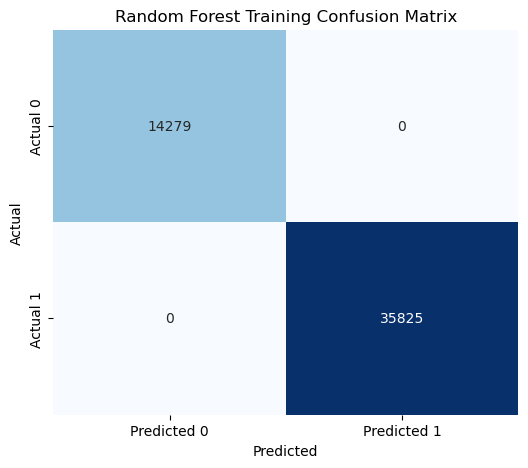

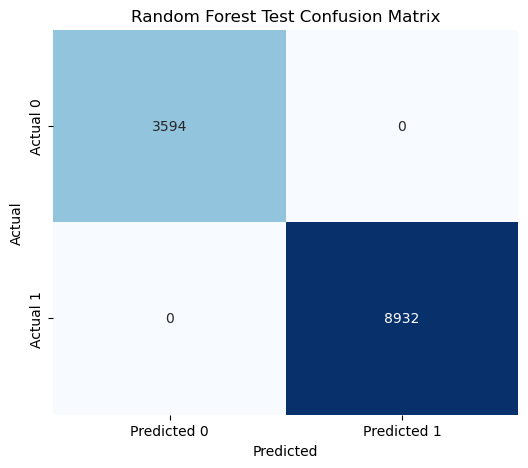

Training and evaluating Logistic Regression...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


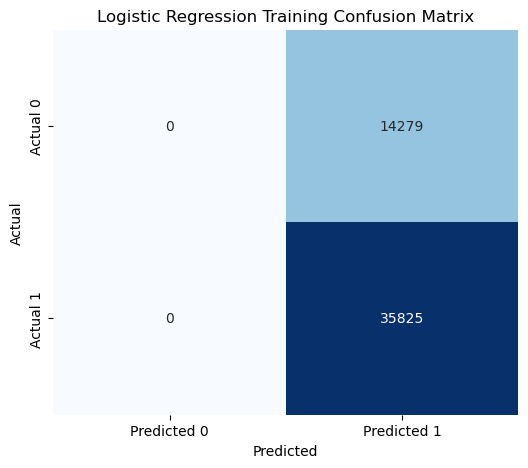

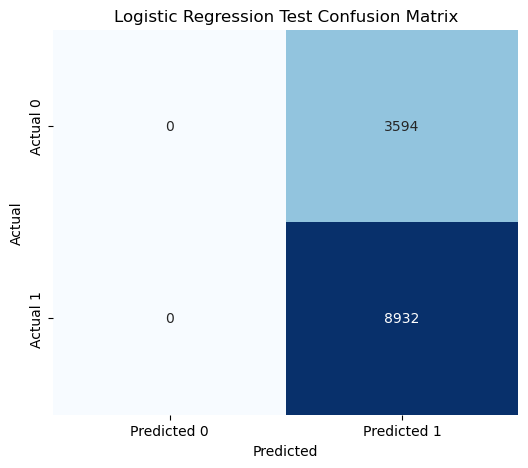

Training and evaluating SVM...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


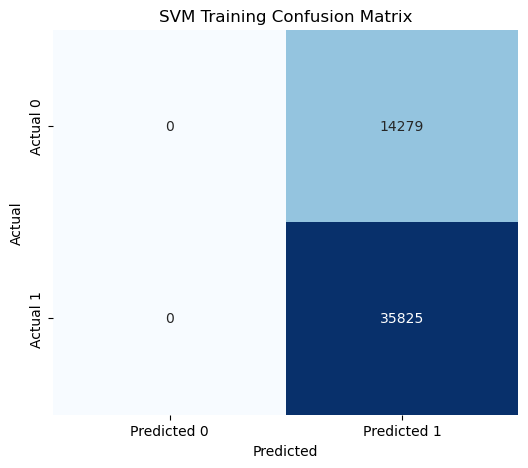

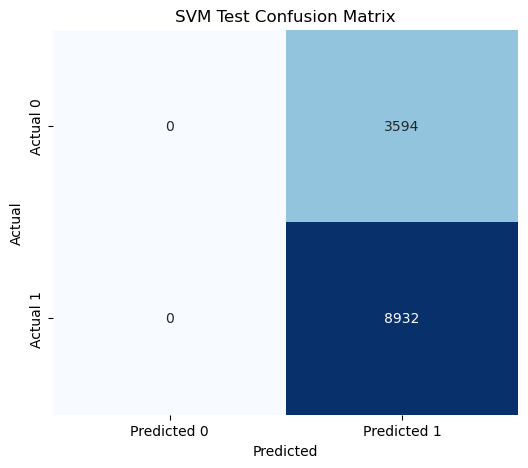

Training and evaluating Naive Bayes...

Training Scores:
Accuracy: 0.8762
Precision: 0.8691
Recall: 0.9734
F1 Score: 0.9183

Test Scores:
Accuracy: 0.8775
Precision: 0.8717
Recall: 0.9711
F1 Score: 0.9187


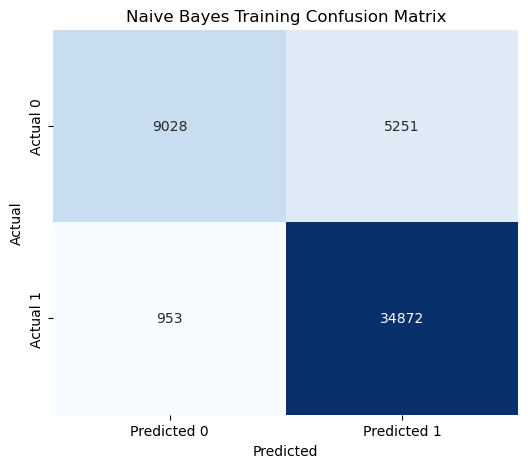

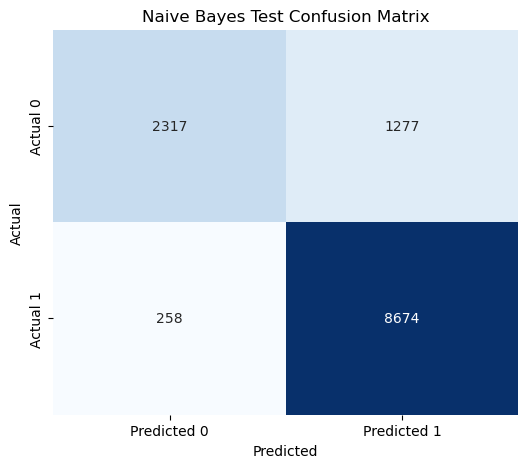

Training and evaluating K-Nearest Neighbors...

Training Scores:
Accuracy: 0.9998
Precision: 0.9999
Recall: 0.9999
F1 Score: 0.9999

Test Scores:
Accuracy: 0.9999
Precision: 1.0000
Recall: 0.9999
F1 Score: 0.9999


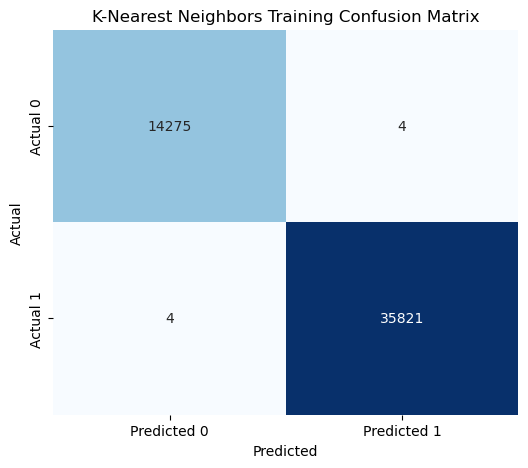

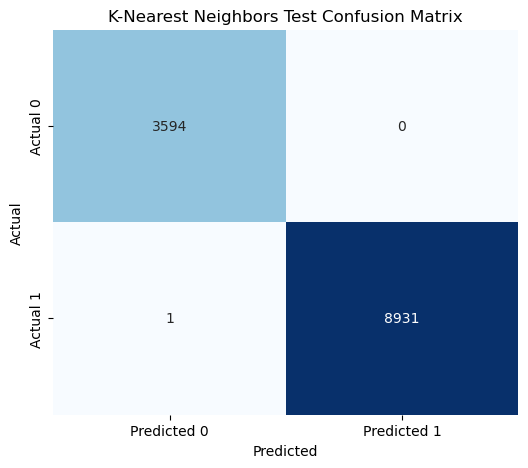

Training and evaluating Decision Tree...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


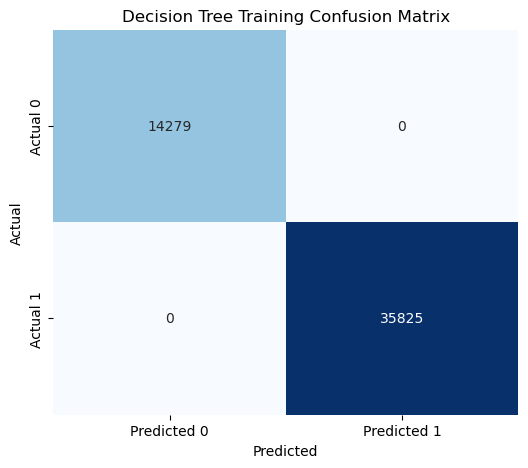

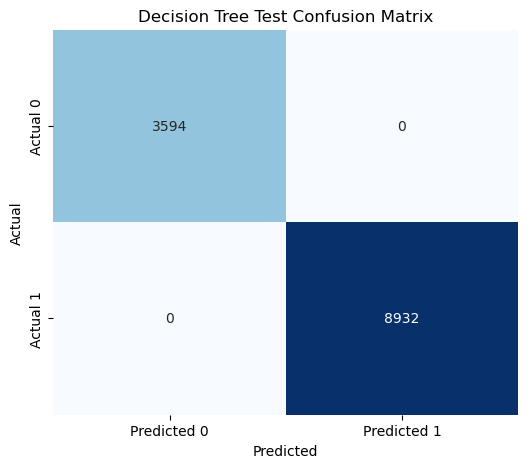

Training and evaluating AdaBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 0.9999
Precision: 1.0000
Recall: 0.9999
F1 Score: 0.9999


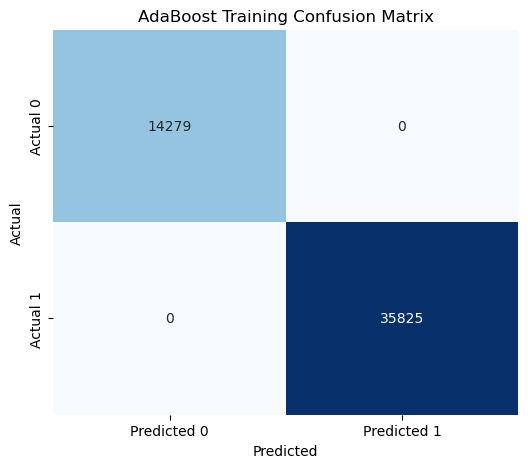

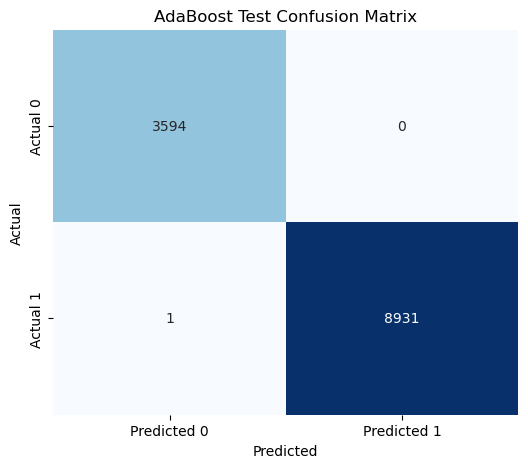

Training and evaluating Neural Network (Sigmoid)...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


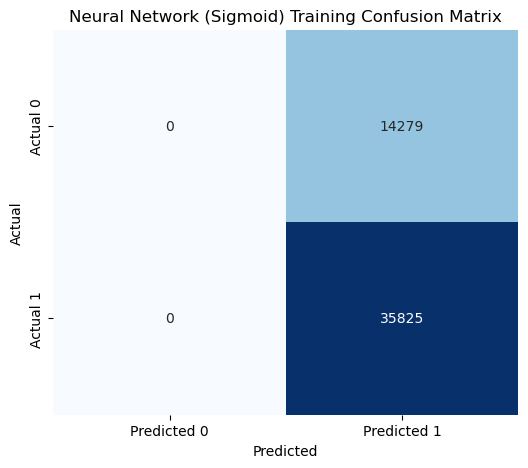

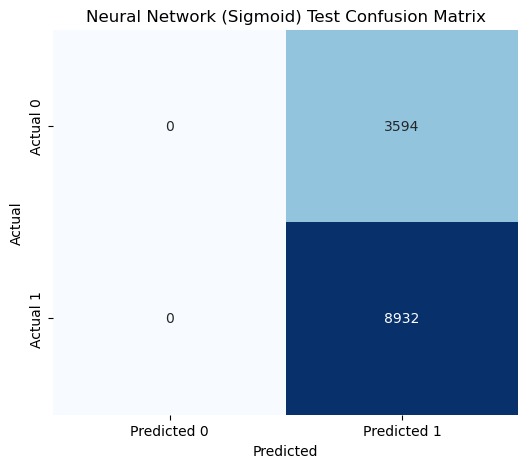

Training and evaluating XGBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


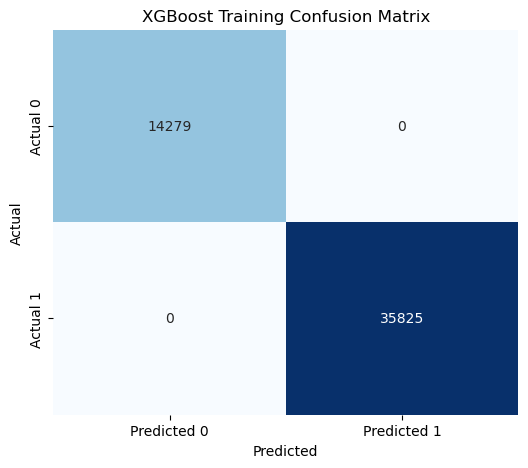

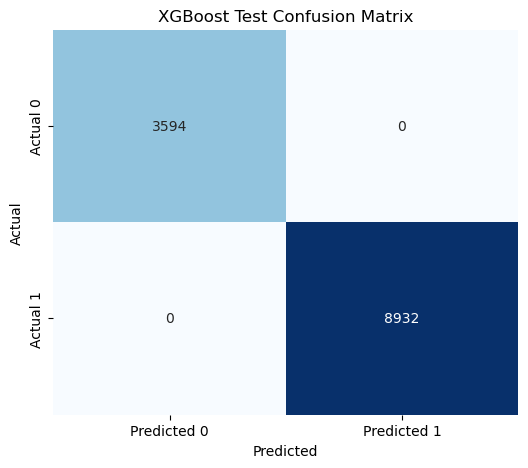

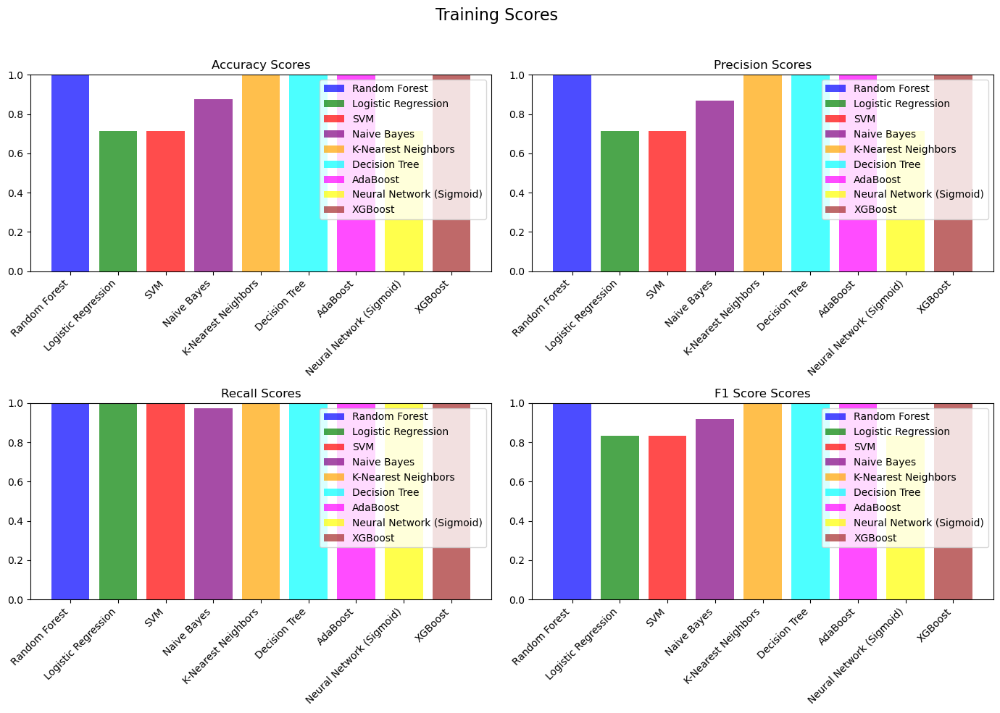

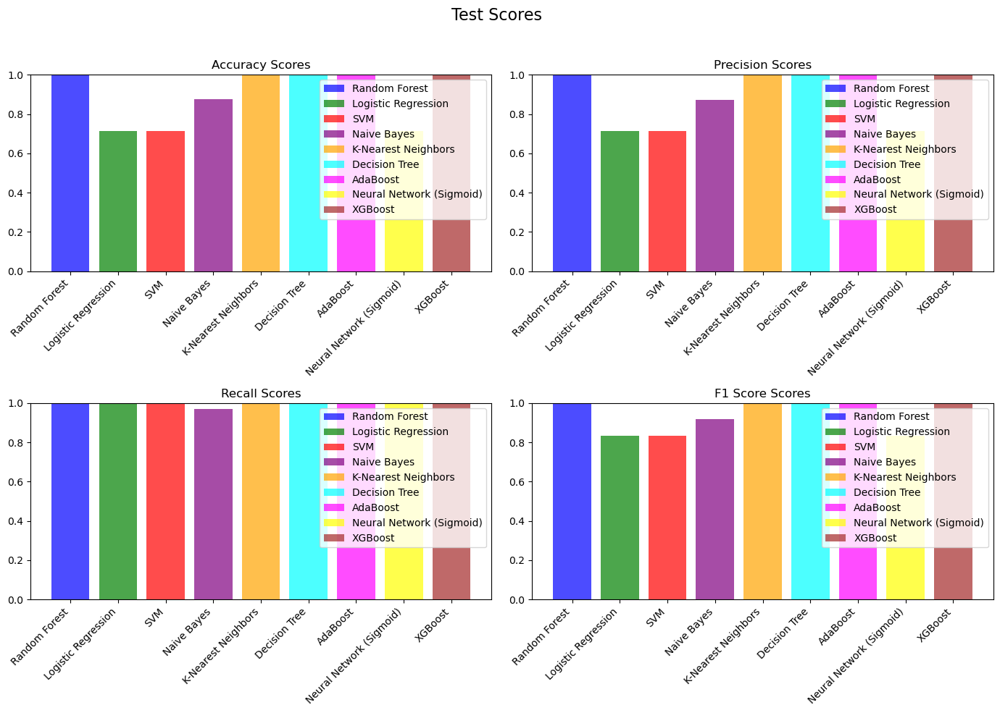

In [32]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train = X_train[['CNT', 'Raw H2', 'PressurehPa', 'Humidity', 'PM1.0', 'Raw Ethanol', 'UTC']]
X_test = X_test[['CNT', 'Raw H2', 'PressurehPa', 'Humidity', 'PM1.0', 'Raw Ethanol', 'UTC']]

logreg_classifier = LogisticRegression()
svm_classifier = SVC()
nb_classifier = GaussianNB()
knn_classifier = KNeighborsClassifier()
dt_classifier = DecisionTreeClassifier()
ada_classifier = AdaBoostClassifier()
sigmoid_nn_classifier = MLPClassifier(activation='logistic')
softmax_nn_classifier = MLPClassifier(activation='softmax')
xgb_classifier = xgb.XGBClassifier()
rf_classifier = RandomForestClassifier()
classifiers = {
    'Random Forest': rf_classifier,
    'Logistic Regression': logreg_classifier,
    'SVM': svm_classifier,
    'Naive Bayes': nb_classifier,
    'K-Nearest Neighbors': knn_classifier,
    'Decision Tree': dt_classifier,
    'AdaBoost': ada_classifier,
    'Neural Network (Sigmoid)': sigmoid_nn_classifier,
    'XGBoost': xgb_classifier
}

accuracy_scores_train = []
precision_scores_train = []
recall_scores_train = []
f1_scores_train = []

accuracy_scores_test = []
precision_scores_test = []
recall_scores_test = []
f1_scores_test = []

for name, classifier in classifiers.items():
    print(f"Training and evaluating {name}...")
    classifier.fit(X_train, y_train)

    y_train_pred = classifier.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    train_precision = precision_score(y_train, y_train_pred)
    train_recall = recall_score(y_train, y_train_pred)
    train_f1 = f1_score(y_train, y_train_pred)

    y_test_pred = classifier.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_precision = precision_score(y_test, y_test_pred)
    test_recall = recall_score(y_test, y_test_pred)
    test_f1 = f1_score(y_test, y_test_pred)

    conf_matrix_train = confusion_matrix(y_train, y_train_pred)
    conf_matrix_test = confusion_matrix(y_test, y_test_pred)
    
    accuracy_scores_train.append(train_accuracy)
    precision_scores_train.append(train_precision)
    recall_scores_train.append(train_recall)
    f1_scores_train.append(train_f1)

    accuracy_scores_test.append(test_accuracy)
    precision_scores_test.append(test_precision)
    recall_scores_test.append(test_recall)
    f1_scores_test.append(test_f1)
    
    print("\nTraining Scores:")
    print(f"Accuracy: {train_accuracy:.4f}")
    print(f"Precision: {train_precision:.4f}")
    print(f"Recall: {train_recall:.4f}")
    print(f"F1 Score: {train_f1:.4f}")

    print("\nTest Scores:")
    print(f"Accuracy: {test_accuracy:.4f}")
    print(f"Precision: {test_precision:.4f}")
    print(f"Recall: {test_recall:.4f}")
    print(f"F1 Score: {test_f1:.4f}")

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Training Confusion Matrix")
    plt.show()

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Test Confusion Matrix")
    plt.show()

score_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
colors = ['blue', 'green', 'red', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown']

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Training Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_train, precision_scores_train, recall_scores_train, f1_scores_train]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Test Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_test, precision_scores_test, recall_scores_test, f1_scores_test]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')  
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

plt.show()


In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

threshold = 0.1
selector = VarianceThreshold(threshold=threshold)
X_train_selected = selector.fit_transform(X_train_scaled)
X_test_selected = selector.transform(X_test_scaled)

zero_variance_features = X.columns[X_train_selected.var(axis=0) == 0]
selected_features = X.columns[selector.get_support()]  

final_selected_features_list = list(selected_features)

X_selected = X[final_selected_features_list]

print("Selected features:", final_selected_features_list)
print(len(final_selected_features_list))

Selected features: ['UTC', 'TemperatureC', 'Humidity', 'TVOCppb', 'eCO2ppm', 'Raw H2', 'Raw Ethanol', 'PressurehPa', 'PM1.0', 'PM2.5', 'NC0.5', 'NC1.0', 'NC2.5', 'CNT']
14


Training and evaluating Random Forest...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


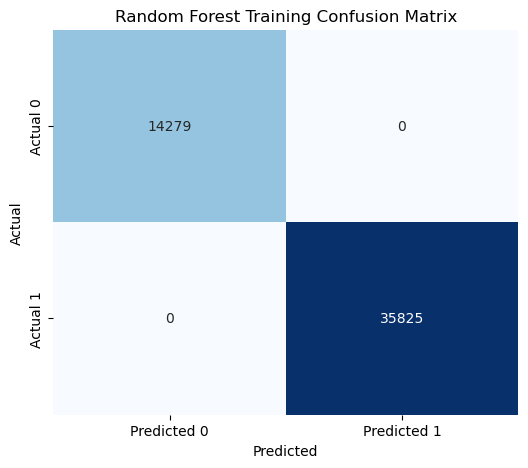

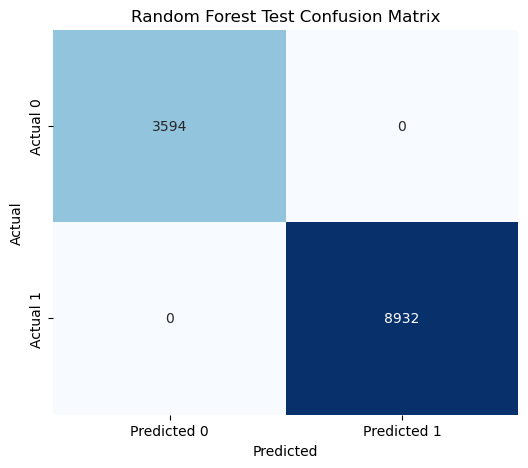

Training and evaluating Logistic Regression...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


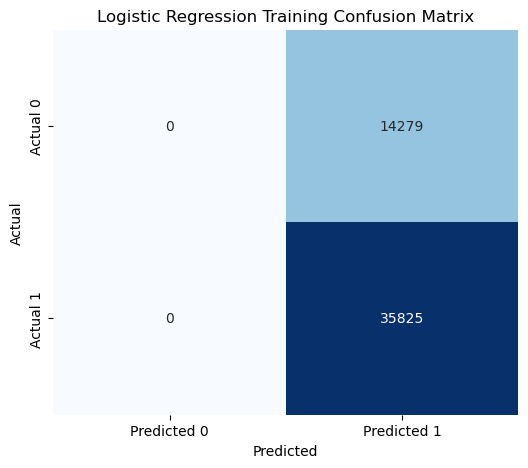

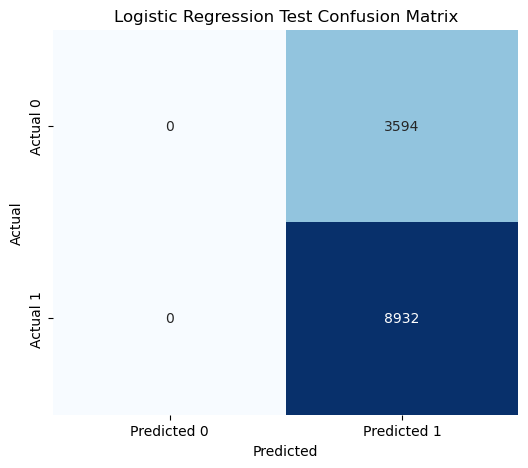

Training and evaluating SVM...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


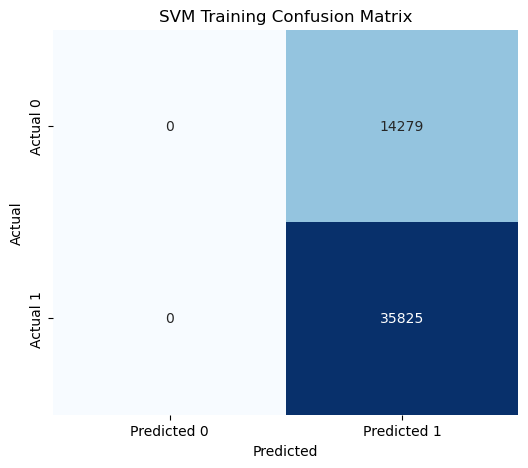

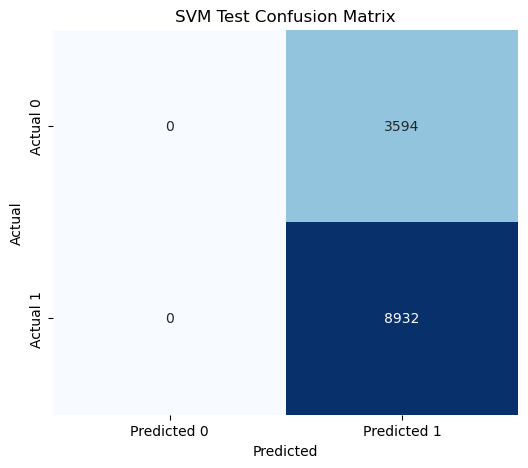

Training and evaluating Naive Bayes...

Training Scores:
Accuracy: 0.8263
Precision: 0.8171
Recall: 0.9754
F1 Score: 0.8892

Test Scores:
Accuracy: 0.8268
Precision: 0.8184
Recall: 0.9730
F1 Score: 0.8891


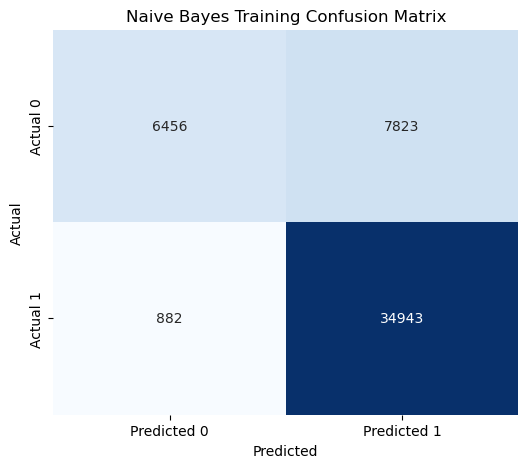

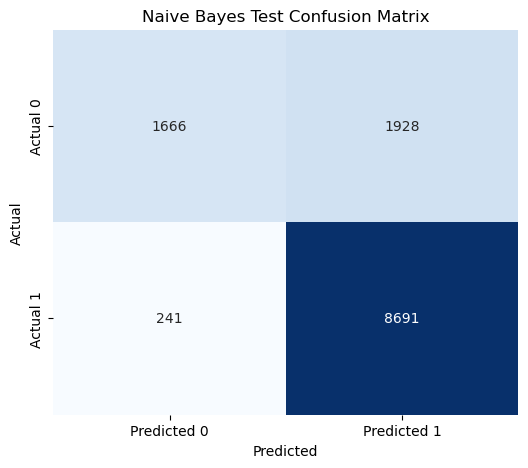

Training and evaluating K-Nearest Neighbors...

Training Scores:
Accuracy: 0.9997
Precision: 0.9997
Recall: 0.9999
F1 Score: 0.9998

Test Scores:
Accuracy: 0.9998
Precision: 0.9999
Recall: 0.9999
F1 Score: 0.9999


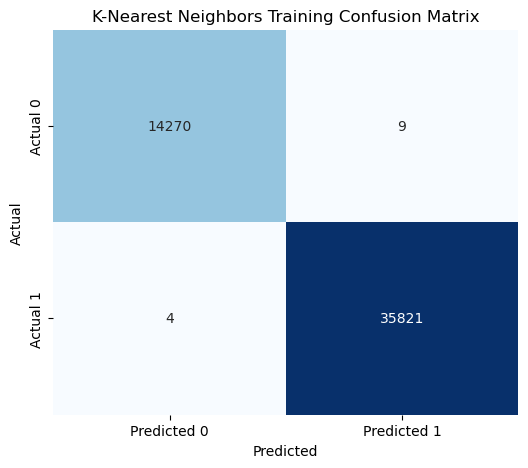

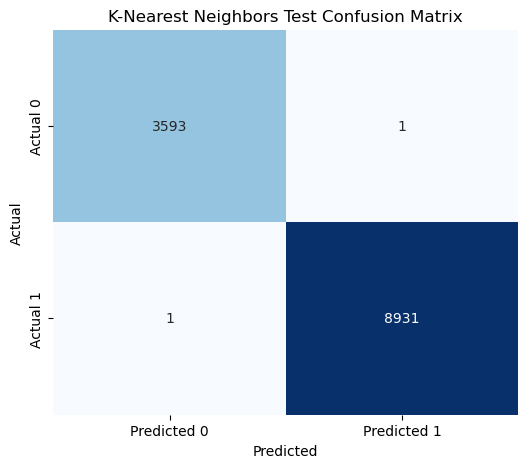

Training and evaluating Decision Tree...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 0.9998
Precision: 0.9998
Recall: 1.0000
F1 Score: 0.9999


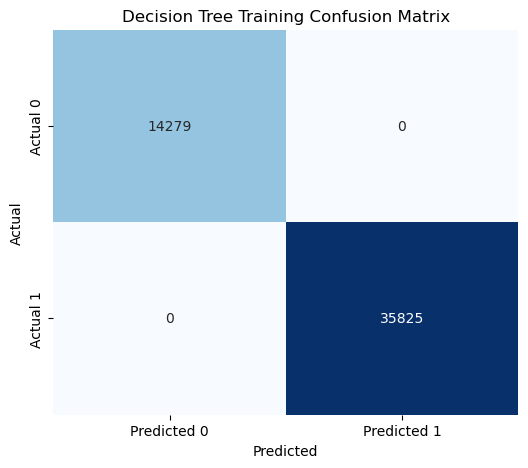

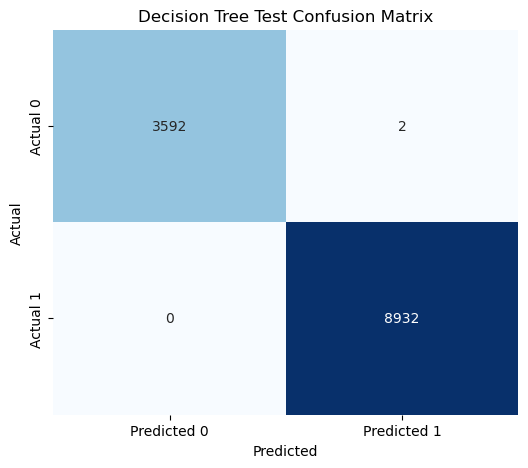

Training and evaluating AdaBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 1.0000
F1 Score: 0.9999


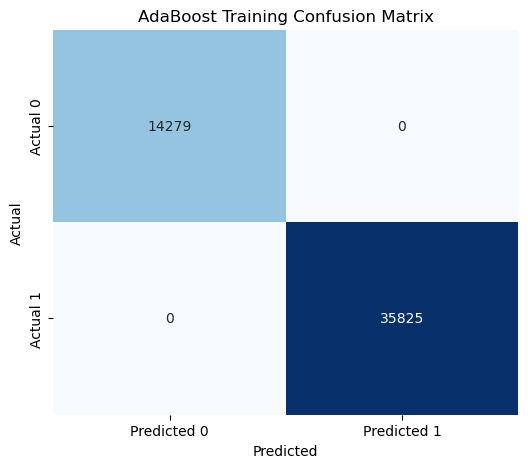

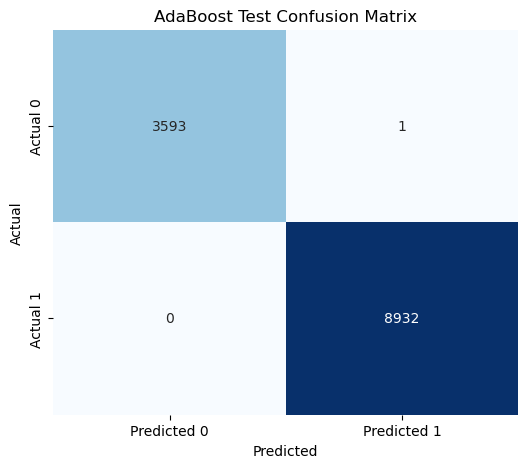

Training and evaluating Neural Network (Sigmoid)...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


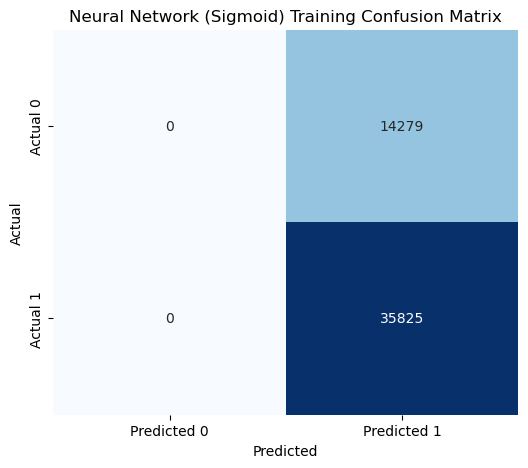

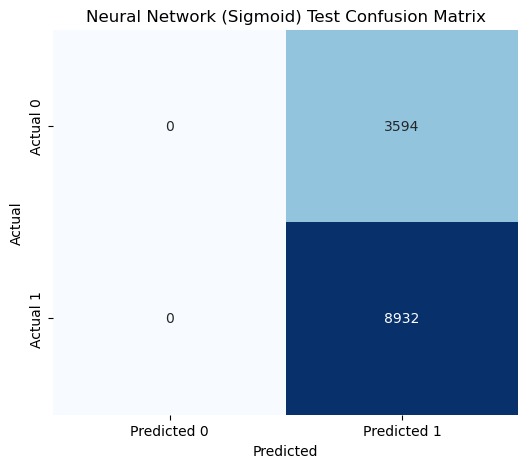

Training and evaluating XGBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


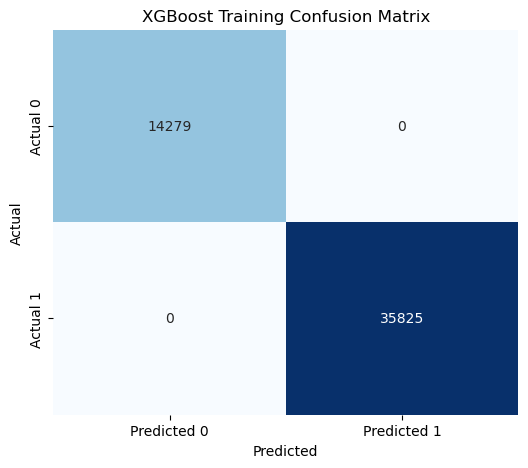

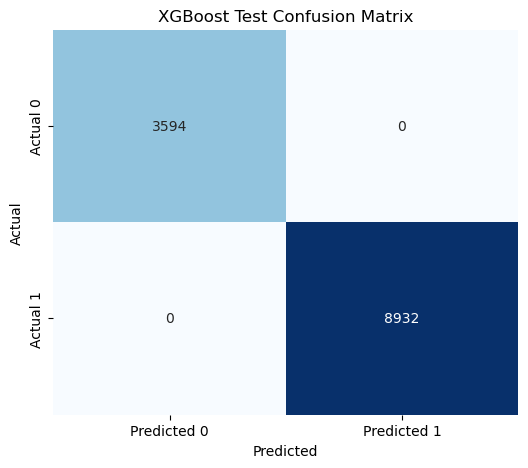

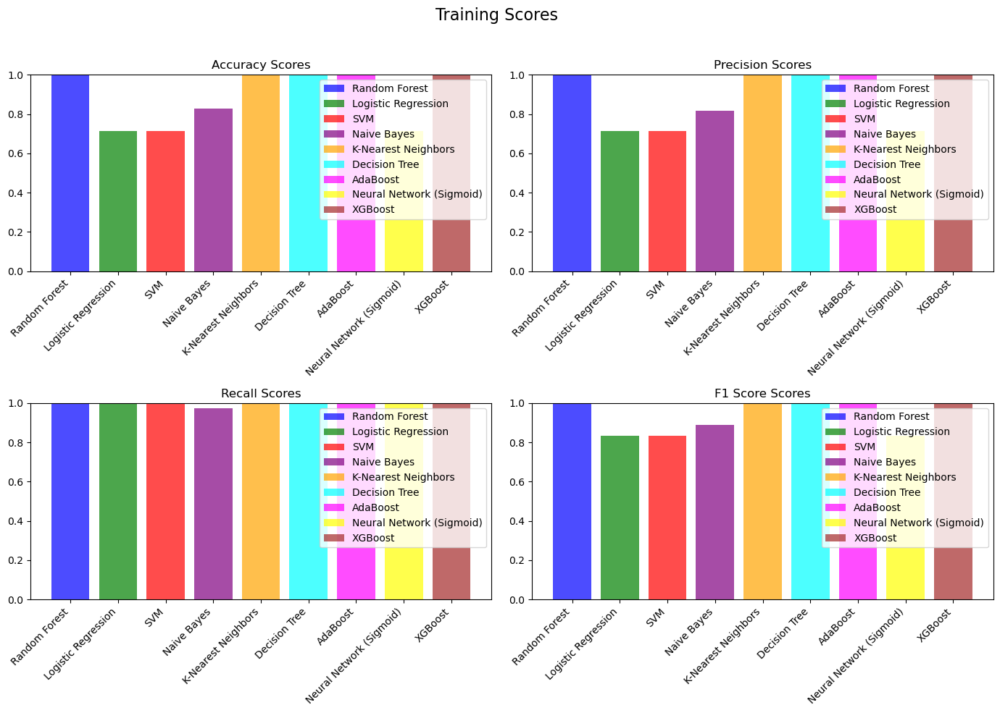

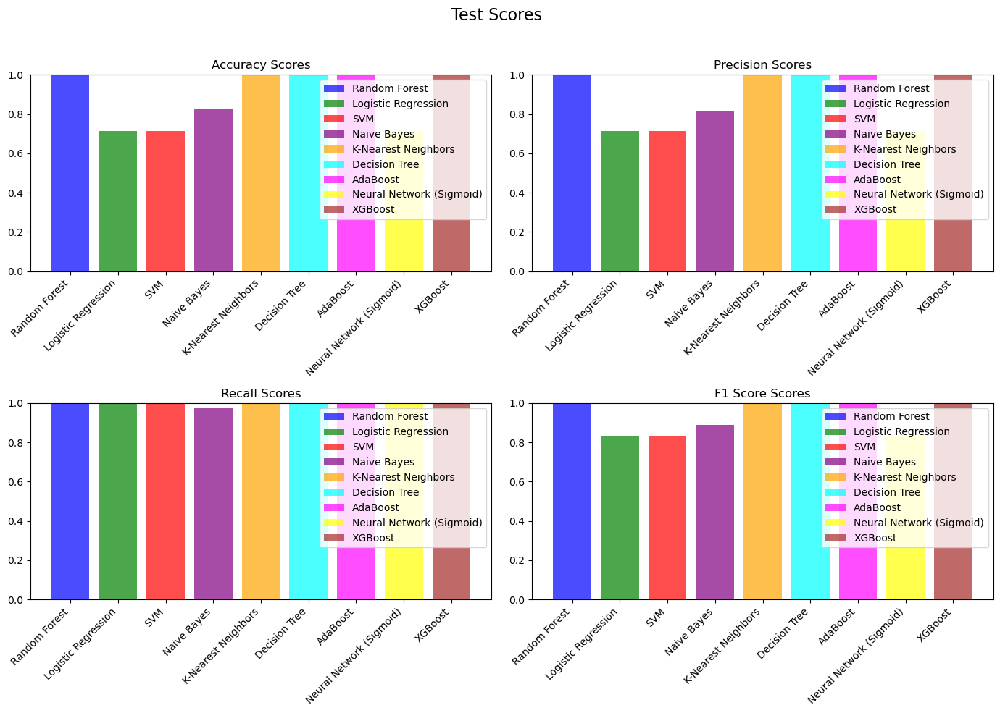

In [34]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train = X_train[final_selected_features_list]
X_test = X_test[final_selected_features_list]

logreg_classifier = LogisticRegression()
svm_classifier = SVC()
nb_classifier = GaussianNB()
knn_classifier = KNeighborsClassifier()
dt_classifier = DecisionTreeClassifier()
ada_classifier = AdaBoostClassifier()
sigmoid_nn_classifier = MLPClassifier(activation='logistic')
softmax_nn_classifier = MLPClassifier(activation='softmax')
xgb_classifier = xgb.XGBClassifier()
rf_classifier = RandomForestClassifier()
classifiers = {
    'Random Forest': rf_classifier,
    'Logistic Regression': logreg_classifier,
    'SVM': svm_classifier,
    'Naive Bayes': nb_classifier,
    'K-Nearest Neighbors': knn_classifier,
    'Decision Tree': dt_classifier,
    'AdaBoost': ada_classifier,
    'Neural Network (Sigmoid)': sigmoid_nn_classifier,
    'XGBoost': xgb_classifier
}

accuracy_scores_train = []
precision_scores_train = []
recall_scores_train = []
f1_scores_train = []

accuracy_scores_test = []
precision_scores_test = []
recall_scores_test = []
f1_scores_test = []

for name, classifier in classifiers.items():
    print(f"Training and evaluating {name}...")
    classifier.fit(X_train, y_train)

    y_train_pred = classifier.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    train_precision = precision_score(y_train, y_train_pred)
    train_recall = recall_score(y_train, y_train_pred)
    train_f1 = f1_score(y_train, y_train_pred)

    y_test_pred = classifier.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_precision = precision_score(y_test, y_test_pred)
    test_recall = recall_score(y_test, y_test_pred)
    test_f1 = f1_score(y_test, y_test_pred)

    conf_matrix_train = confusion_matrix(y_train, y_train_pred)
    conf_matrix_test = confusion_matrix(y_test, y_test_pred)
    
    accuracy_scores_train.append(train_accuracy)
    precision_scores_train.append(train_precision)
    recall_scores_train.append(train_recall)
    f1_scores_train.append(train_f1)

    accuracy_scores_test.append(test_accuracy)
    precision_scores_test.append(test_precision)
    recall_scores_test.append(test_recall)
    f1_scores_test.append(test_f1)
    
    print("\nTraining Scores:")
    print(f"Accuracy: {train_accuracy:.4f}")
    print(f"Precision: {train_precision:.4f}")
    print(f"Recall: {train_recall:.4f}")
    print(f"F1 Score: {train_f1:.4f}")

    print("\nTest Scores:")
    print(f"Accuracy: {test_accuracy:.4f}")
    print(f"Precision: {test_precision:.4f}")
    print(f"Recall: {test_recall:.4f}")
    print(f"F1 Score: {test_f1:.4f}")

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Training Confusion Matrix")
    plt.show()

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Test Confusion Matrix")
    plt.show()

score_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
colors = ['blue', 'green', 'red', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown']

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Training Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_train, precision_scores_train, recall_scores_train, f1_scores_train]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Test Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_test, precision_scores_test, recall_scores_test, f1_scores_test]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')  
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

plt.show()


When K = 2
['UTC', 'PressurehPa']
Training and evaluating Random Forest...

Training Scores:
Accuracy: 0.9998
Precision: 0.9998
Recall: 0.9999
F1 Score: 0.9998

Test Scores:
Accuracy: 0.9994
Precision: 0.9994
Recall: 0.9997
F1 Score: 0.9996


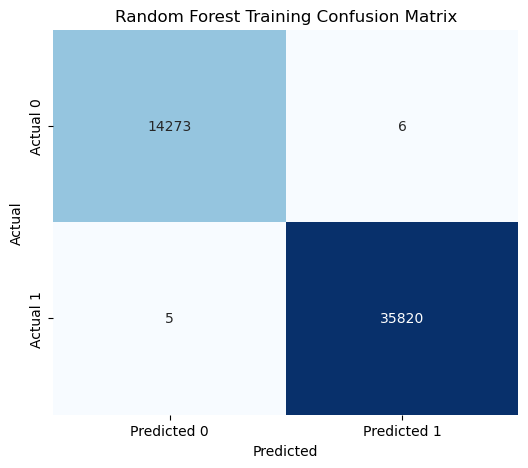

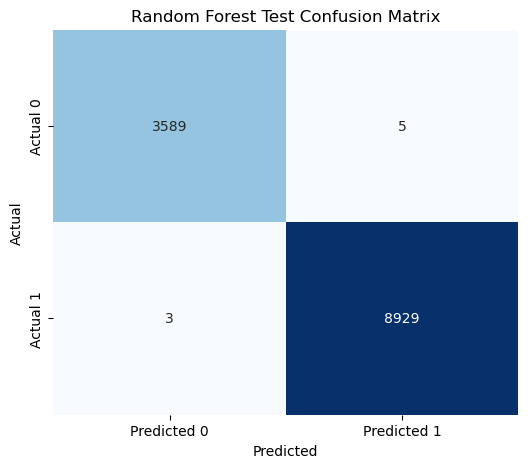

Training and evaluating Logistic Regression...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


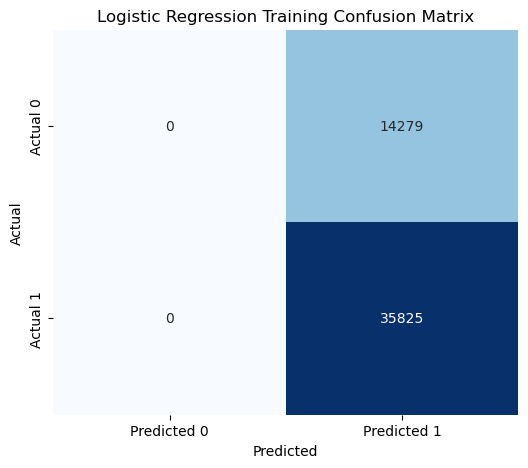

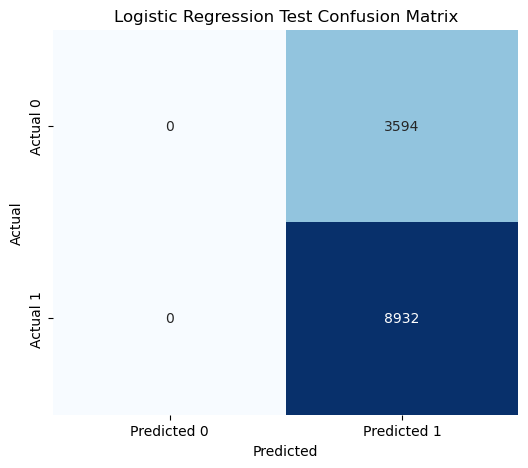

Training and evaluating SVM...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


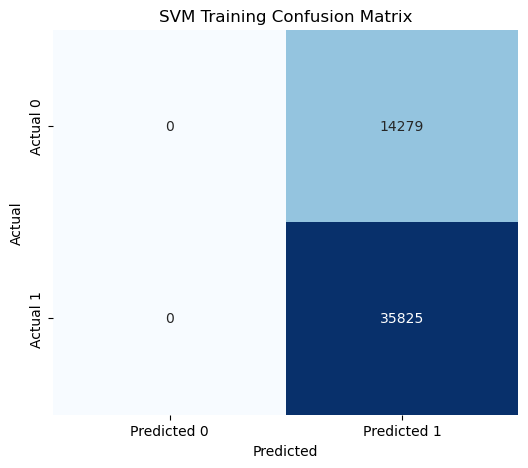

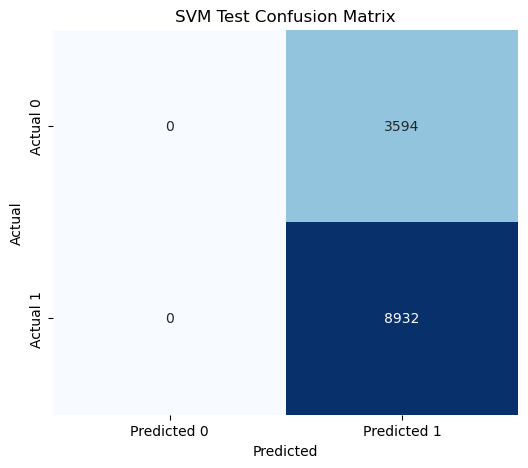

Training and evaluating Naive Bayes...

Training Scores:
Accuracy: 0.7890
Precision: 0.7829
Recall: 0.9754
F1 Score: 0.8686

Test Scores:
Accuracy: 0.7886
Precision: 0.7831
Recall: 0.9730
F1 Score: 0.8678


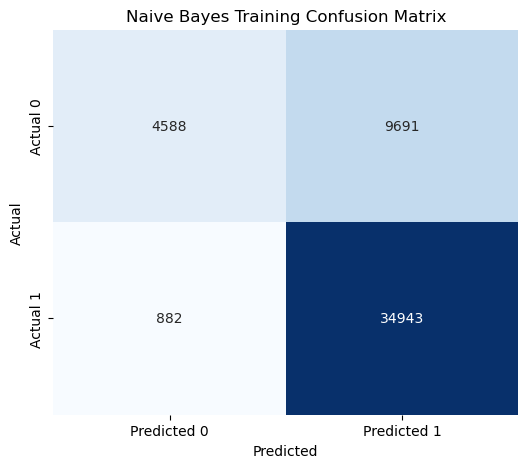

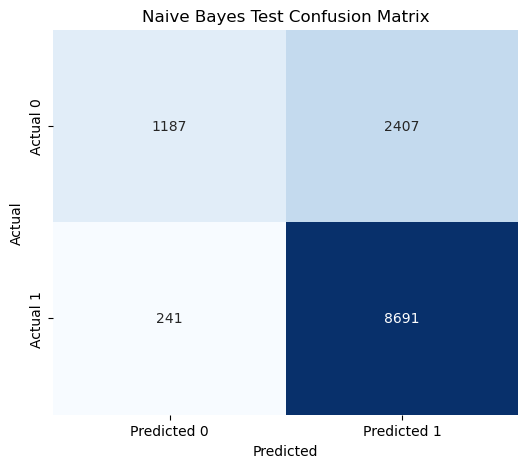

Training and evaluating K-Nearest Neighbors...

Training Scores:
Accuracy: 0.9999
Precision: 1.0000
Recall: 0.9999
F1 Score: 0.9999

Test Scores:
Accuracy: 0.9999
Precision: 1.0000
Recall: 0.9999
F1 Score: 0.9999


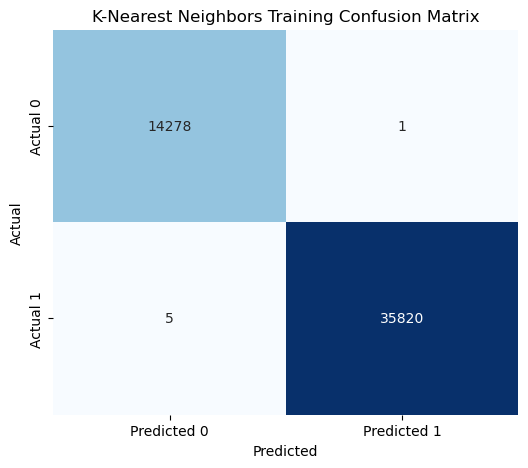

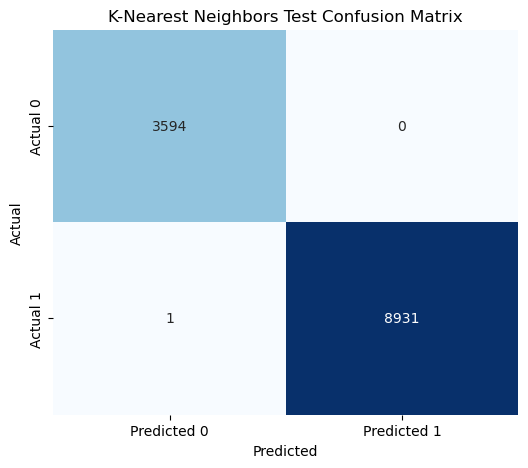

Training and evaluating Decision Tree...

Training Scores:
Accuracy: 0.9998
Precision: 1.0000
Recall: 0.9997
F1 Score: 0.9998

Test Scores:
Accuracy: 0.9994
Precision: 0.9997
Recall: 0.9996
F1 Score: 0.9996


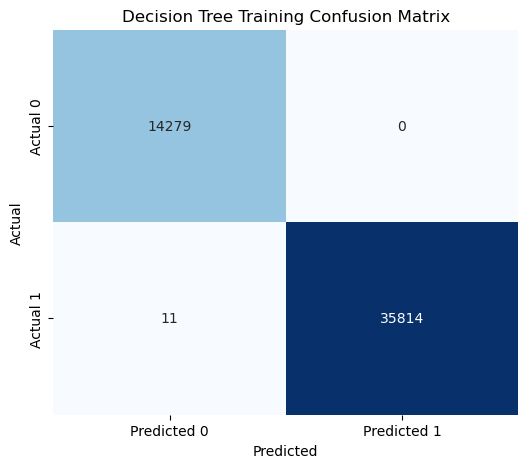

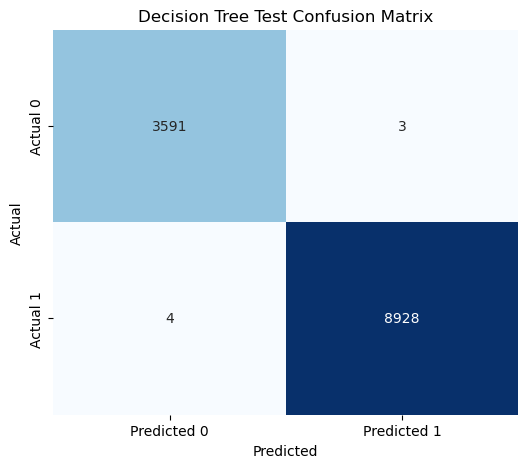

Training and evaluating AdaBoost...

Training Scores:
Accuracy: 0.9992
Precision: 0.9992
Recall: 0.9997
F1 Score: 0.9994

Test Scores:
Accuracy: 0.9993
Precision: 0.9992
Recall: 0.9998
F1 Score: 0.9995


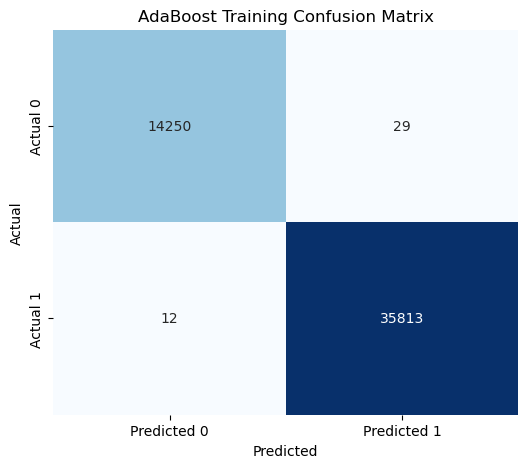

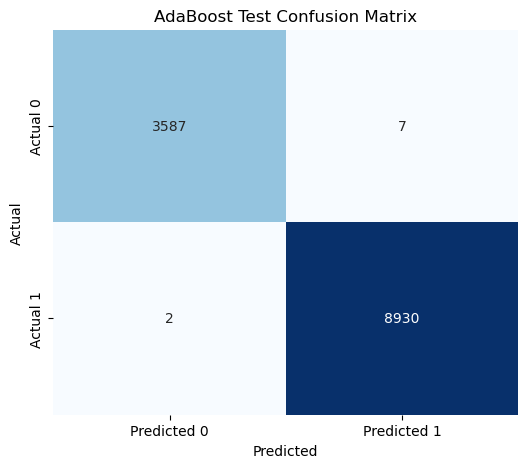

Training and evaluating Neural Network (Sigmoid)...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


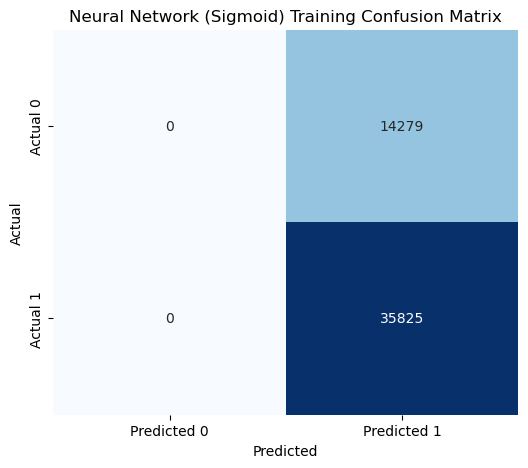

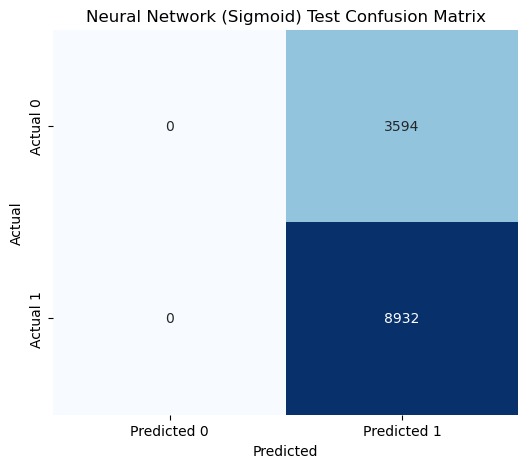

Training and evaluating XGBoost...

Training Scores:
Accuracy: 0.9997
Precision: 0.9998
Recall: 0.9998
F1 Score: 0.9998

Test Scores:
Accuracy: 0.9994
Precision: 0.9994
Recall: 0.9997
F1 Score: 0.9996


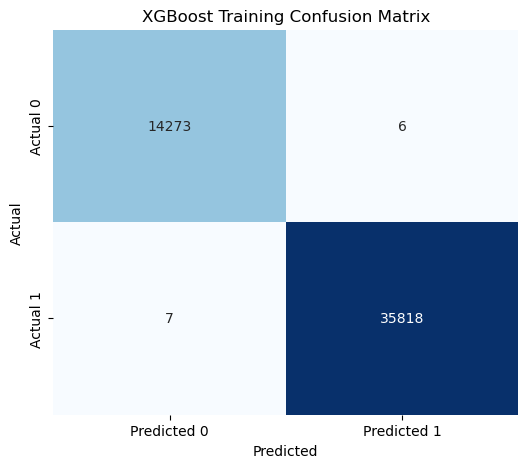

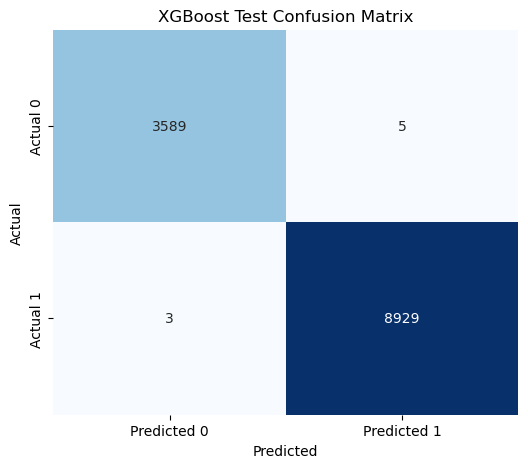

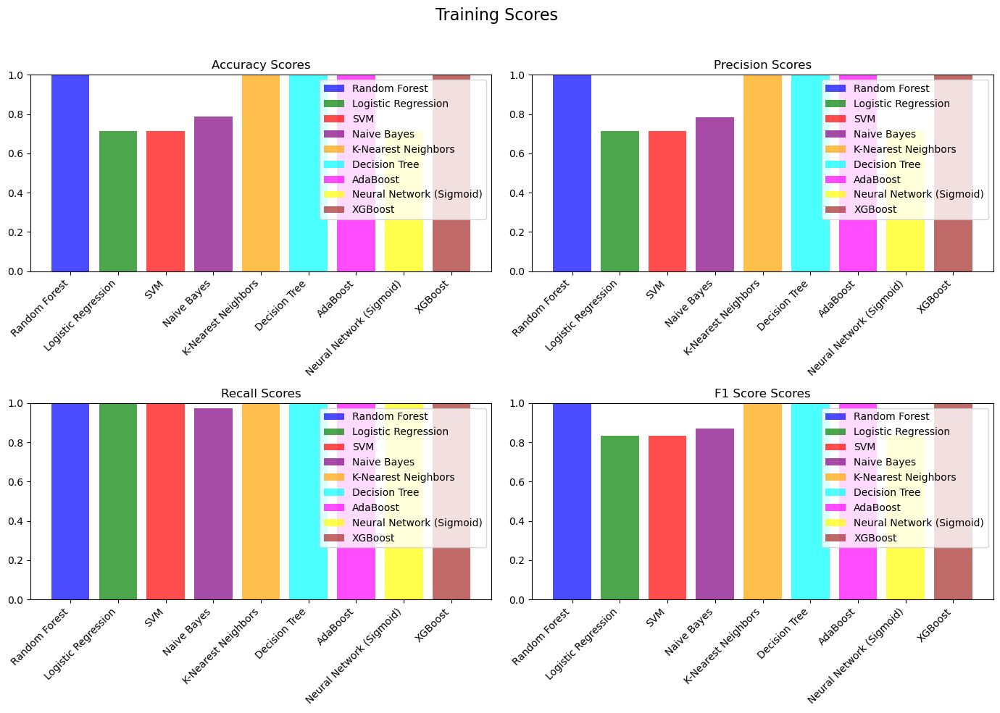

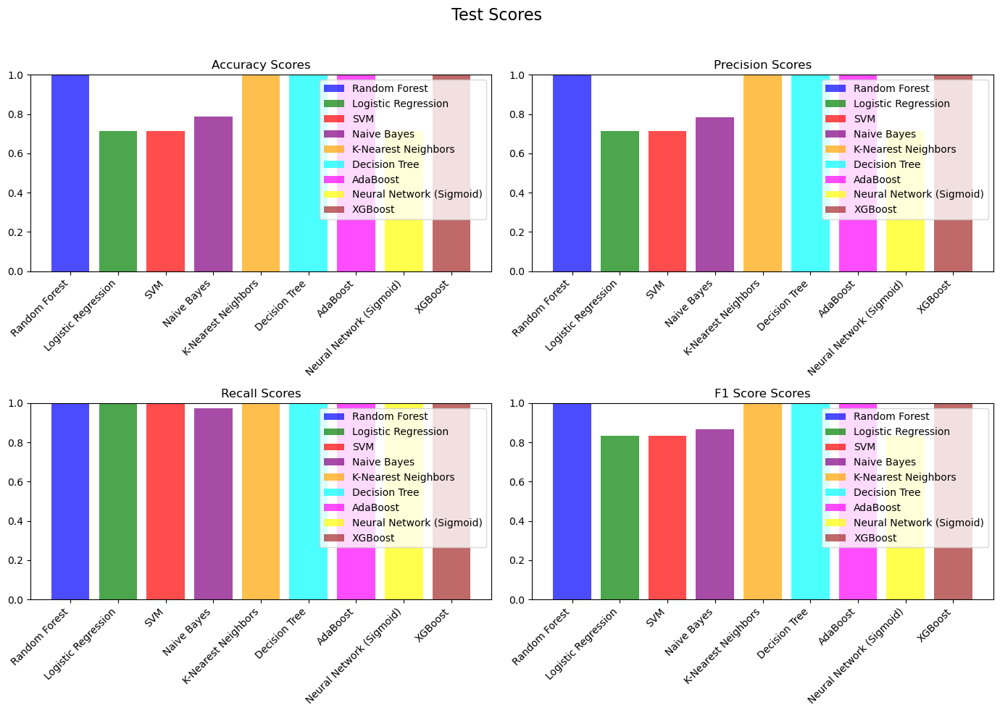

When K = 5
['UTC', 'TVOCppb', 'Raw Ethanol', 'PressurehPa', 'CNT']
Training and evaluating Random Forest...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


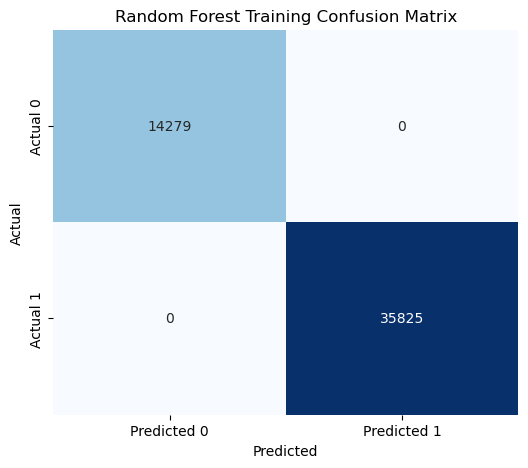

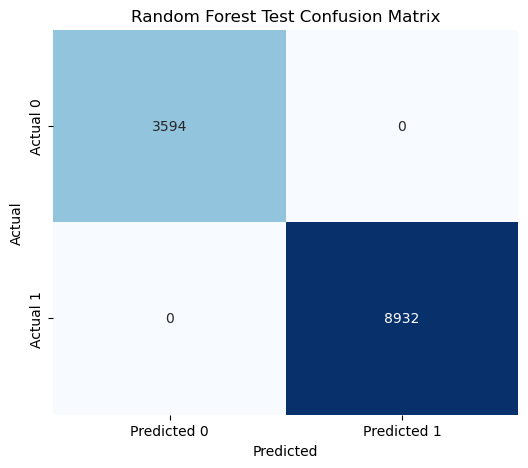

Training and evaluating Logistic Regression...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


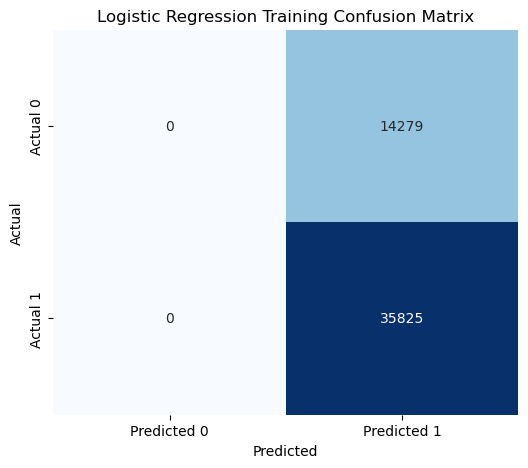

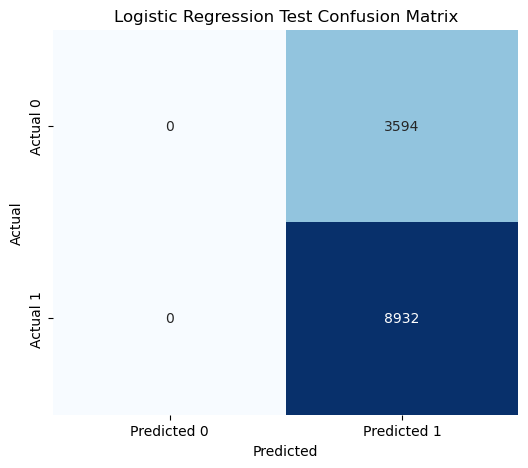

Training and evaluating SVM...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


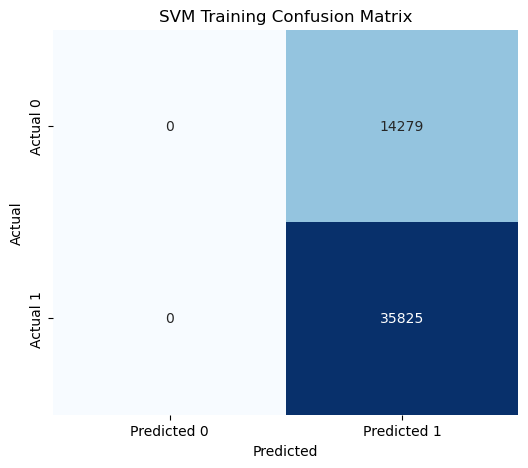

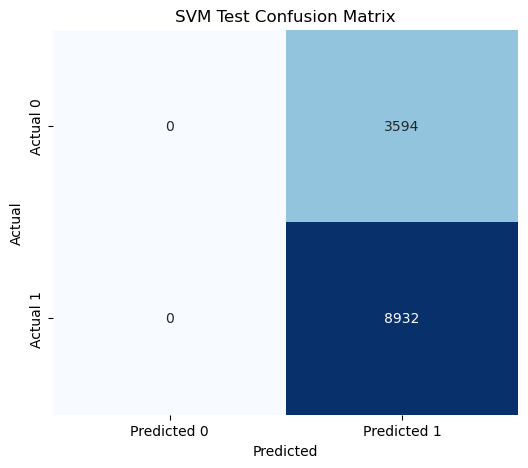

Training and evaluating Naive Bayes...

Training Scores:
Accuracy: 0.8740
Precision: 0.8657
Recall: 0.9750
F1 Score: 0.9171

Test Scores:
Accuracy: 0.8759
Precision: 0.8689
Recall: 0.9727
F1 Score: 0.9179


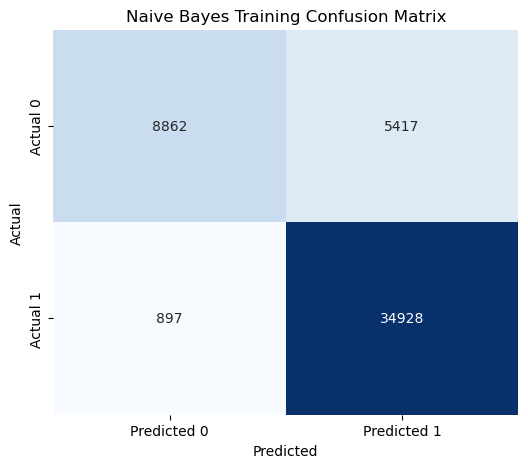

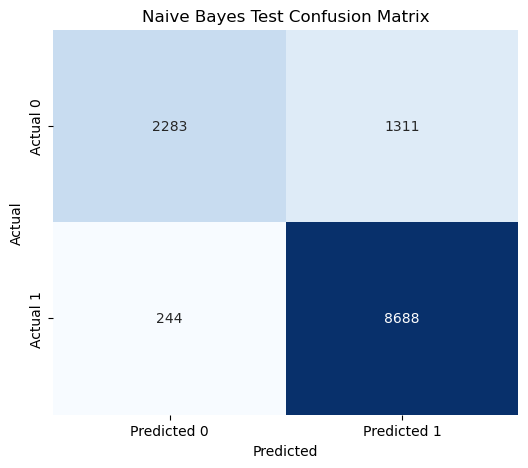

Training and evaluating K-Nearest Neighbors...

Training Scores:
Accuracy: 0.9998
Precision: 0.9998
Recall: 0.9999
F1 Score: 0.9999

Test Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 1.0000
F1 Score: 0.9999


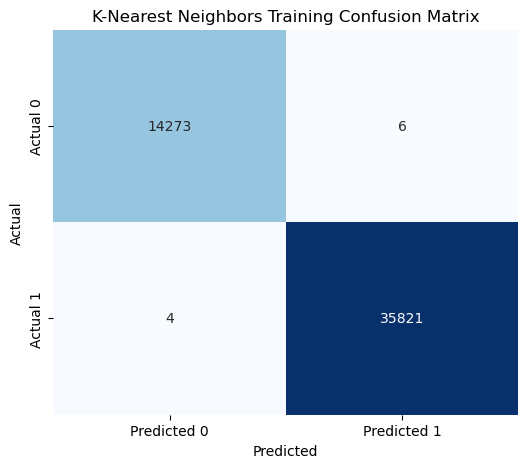

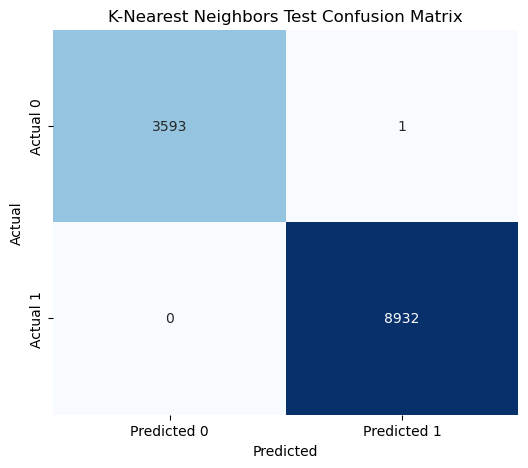

Training and evaluating Decision Tree...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


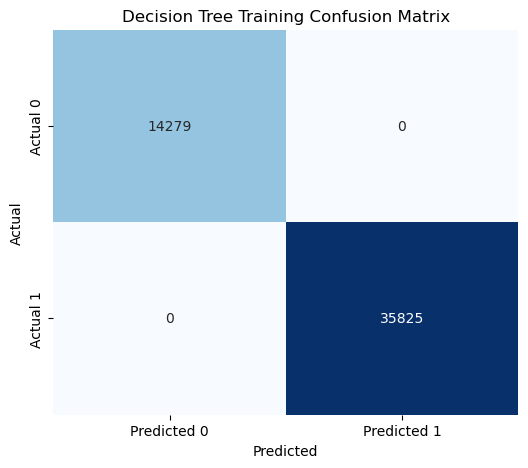

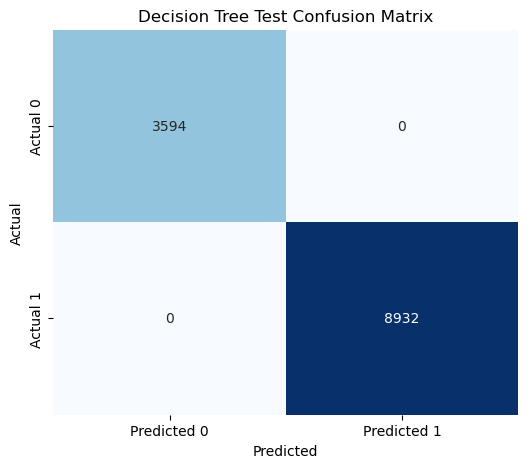

Training and evaluating AdaBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


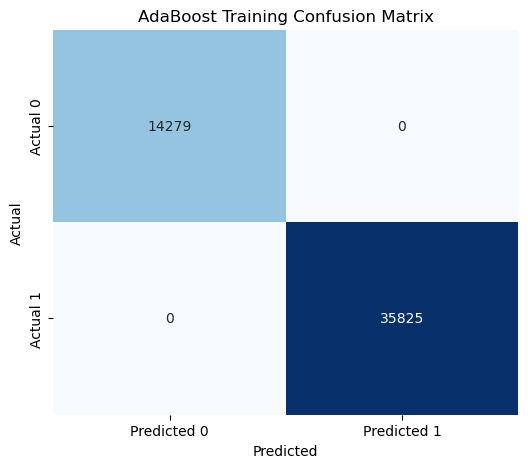

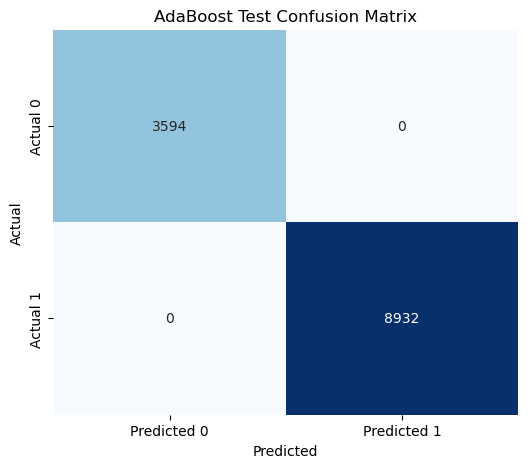

Training and evaluating Neural Network (Sigmoid)...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


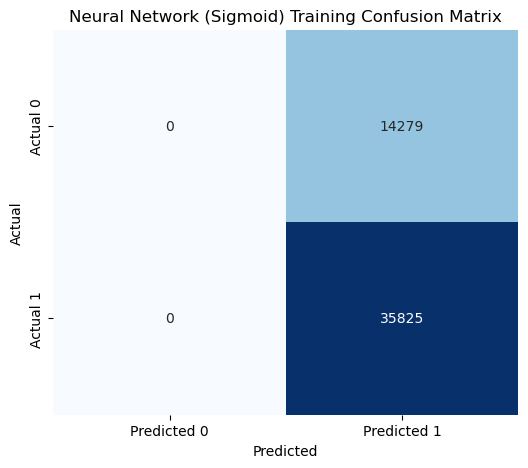

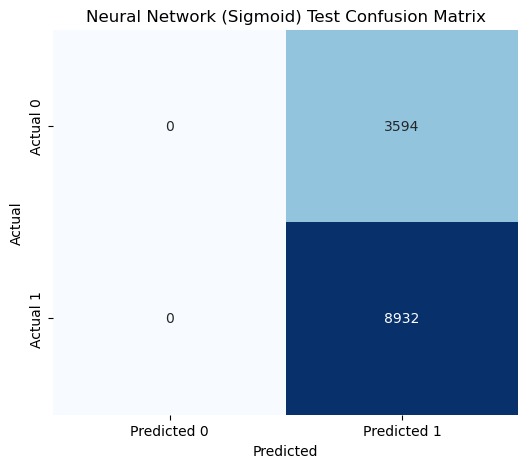

Training and evaluating XGBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


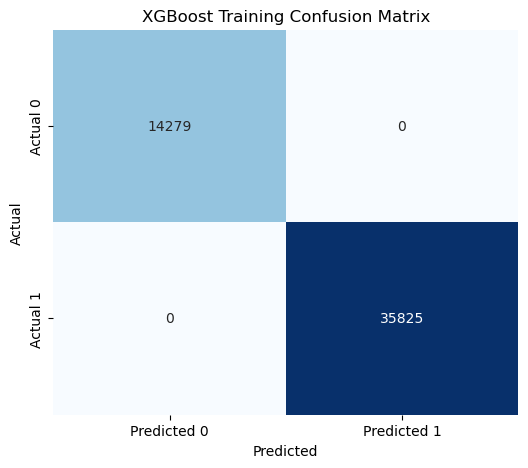

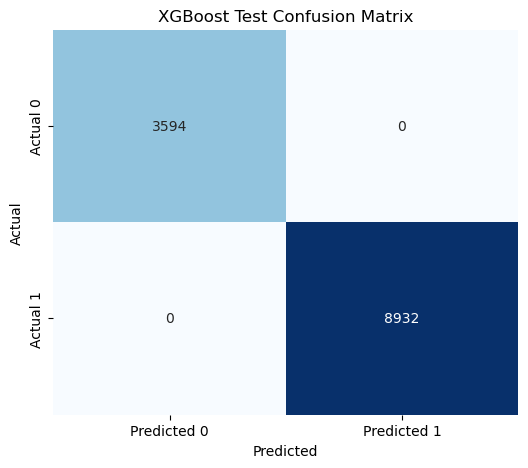

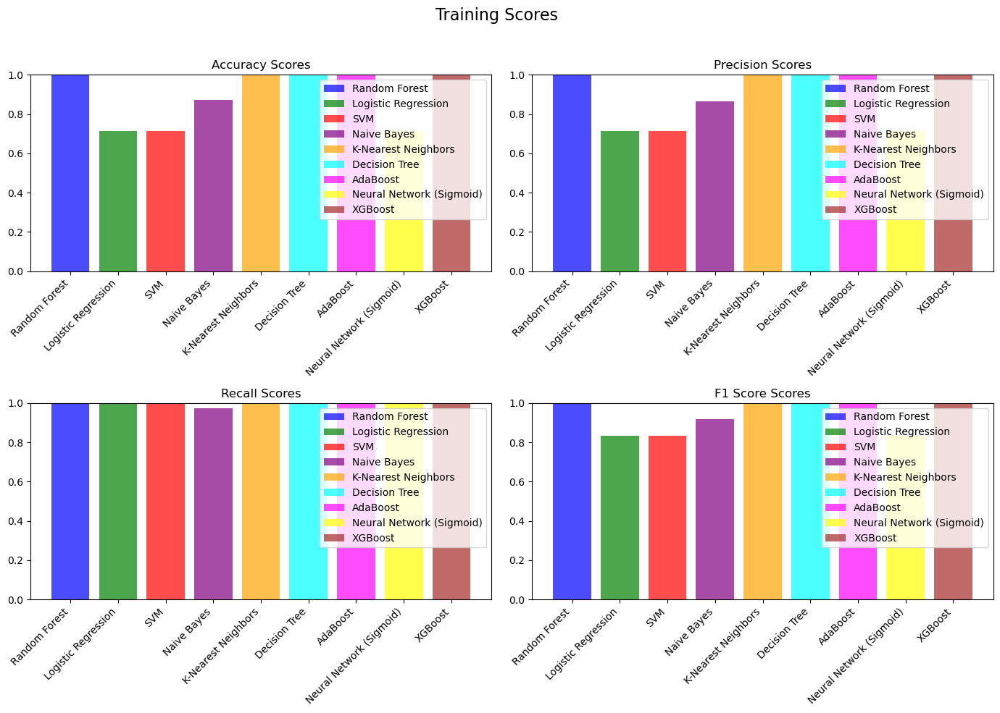

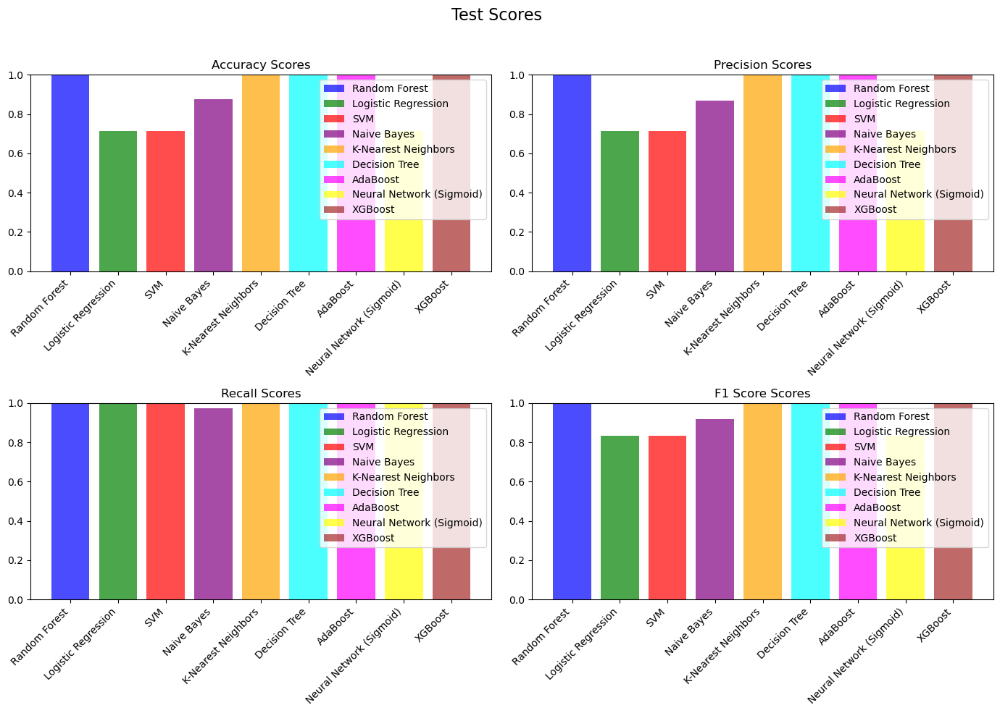

When K = 7
['UTC', 'Humidity', 'TVOCppb', 'Raw H2', 'Raw Ethanol', 'PressurehPa', 'CNT']
Training and evaluating Random Forest...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


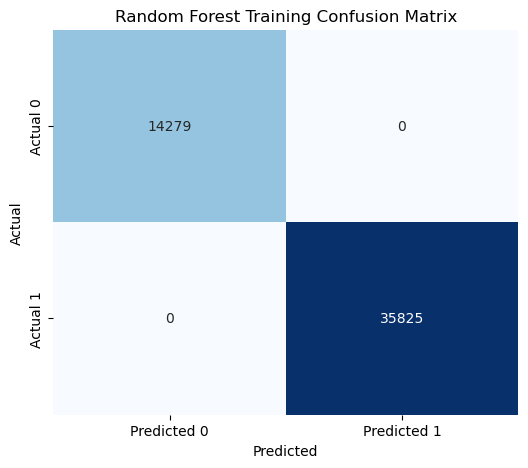

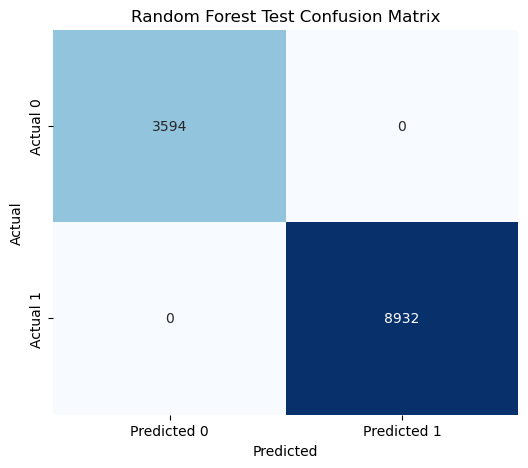

Training and evaluating Logistic Regression...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


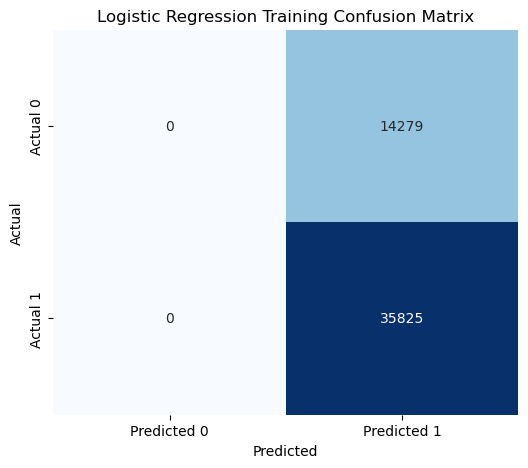

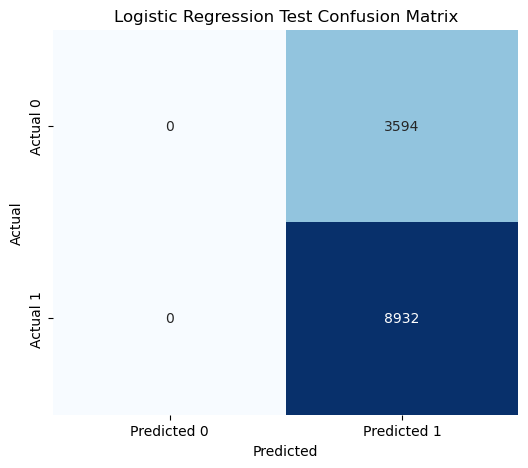

Training and evaluating SVM...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


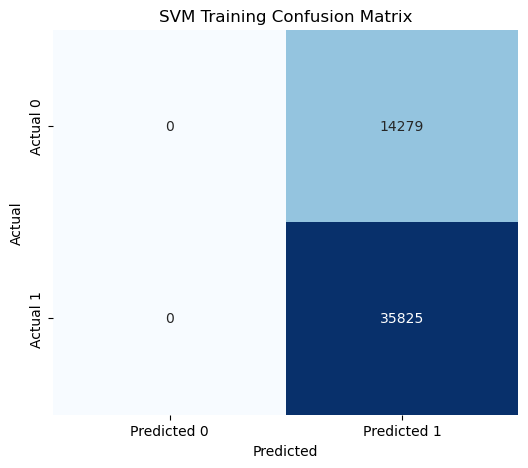

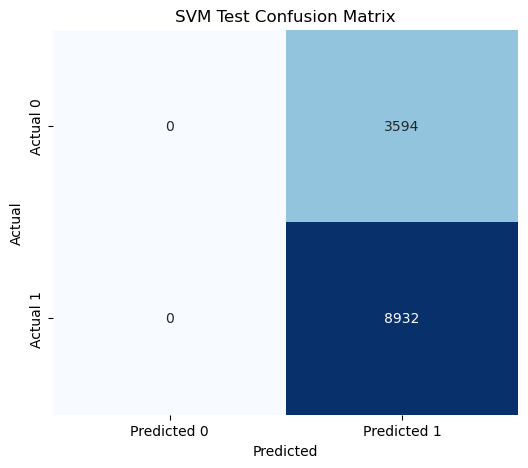

Training and evaluating Naive Bayes...

Training Scores:
Accuracy: 0.8791
Precision: 0.8719
Recall: 0.9741
F1 Score: 0.9202

Test Scores:
Accuracy: 0.8814
Precision: 0.8753
Recall: 0.9722
F1 Score: 0.9212


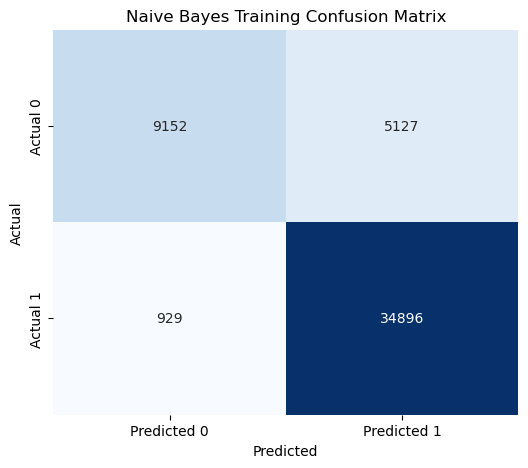

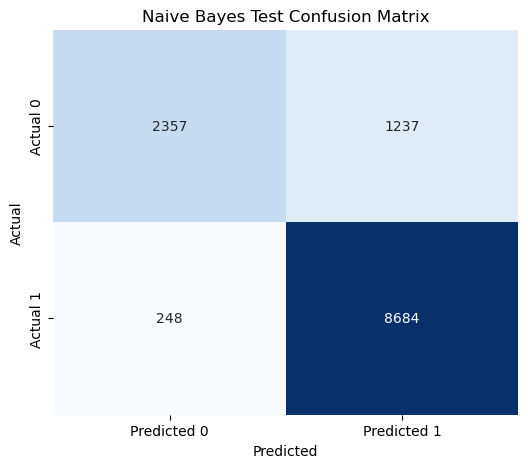

Training and evaluating K-Nearest Neighbors...

Training Scores:
Accuracy: 0.9997
Precision: 0.9997
Recall: 0.9999
F1 Score: 0.9998

Test Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 1.0000
F1 Score: 0.9999


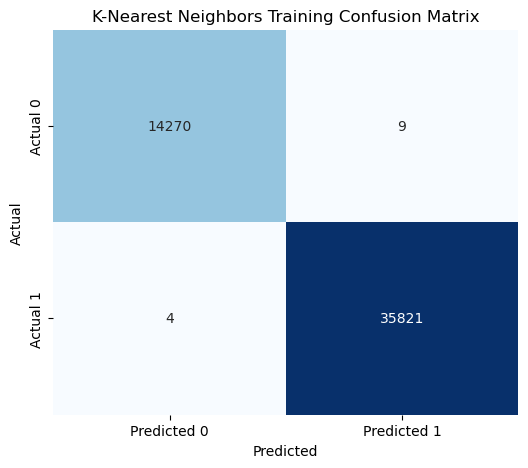

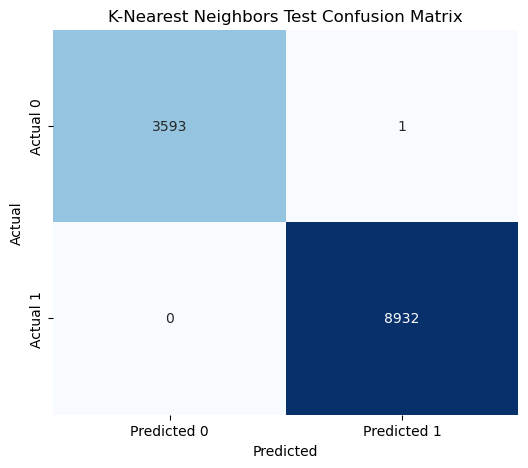

Training and evaluating Decision Tree...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


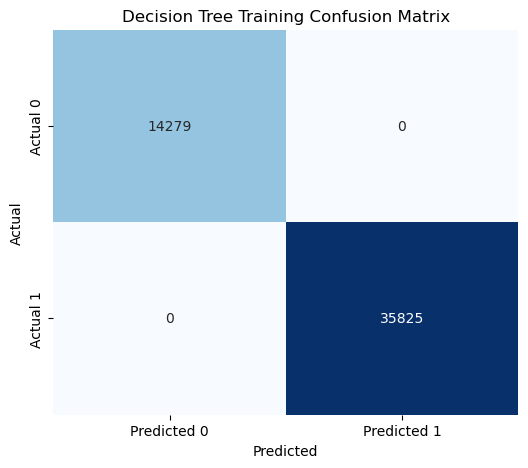

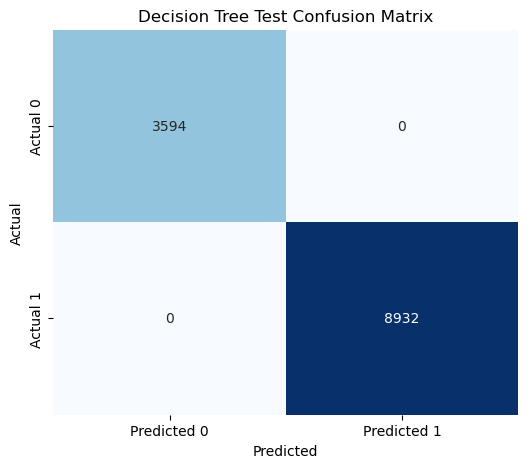

Training and evaluating AdaBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


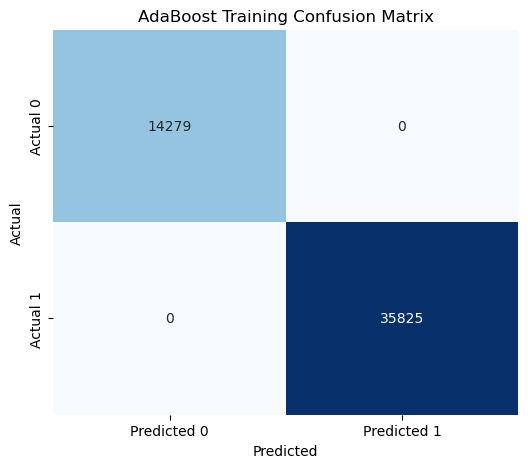

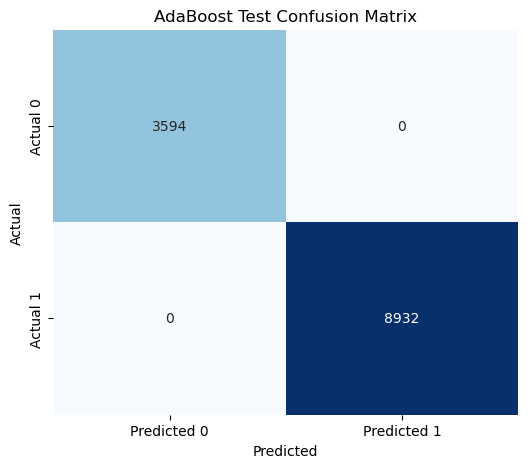

Training and evaluating Neural Network (Sigmoid)...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


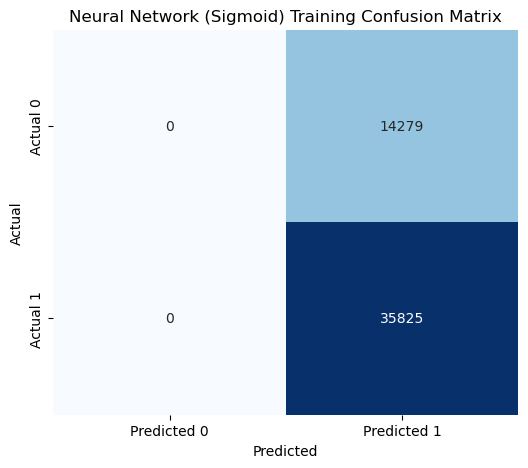

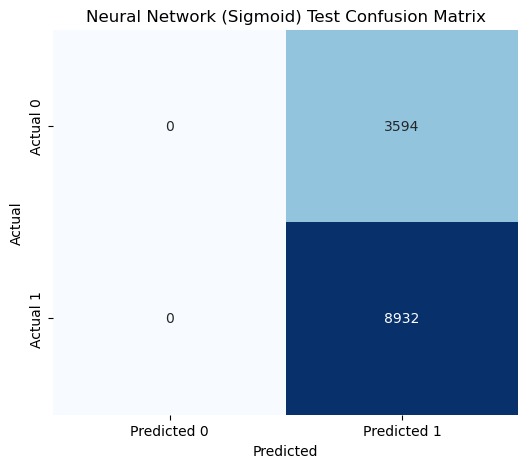

Training and evaluating XGBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


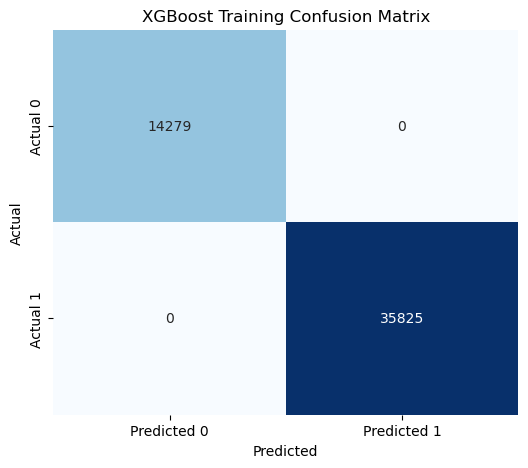

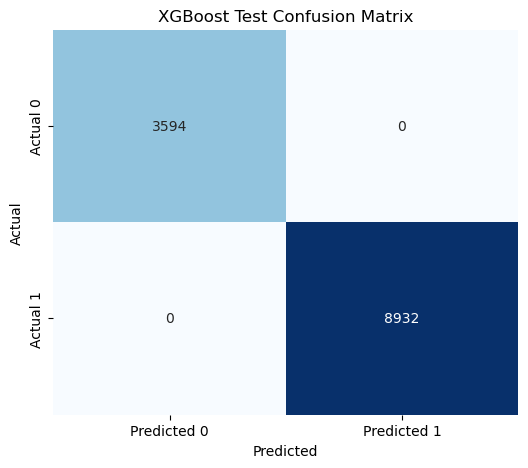

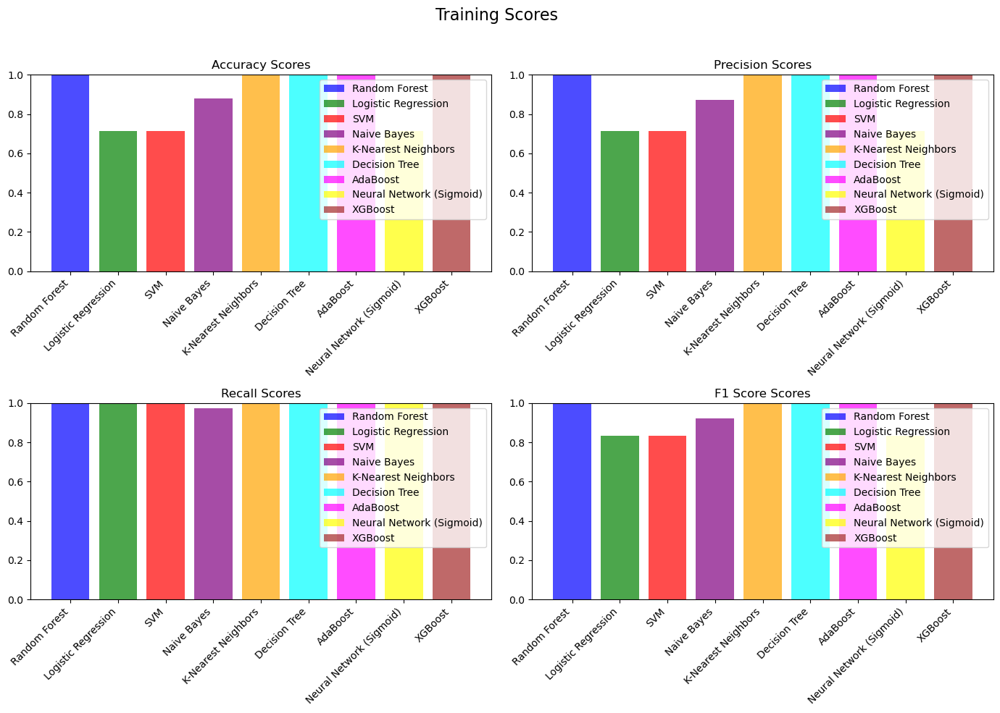

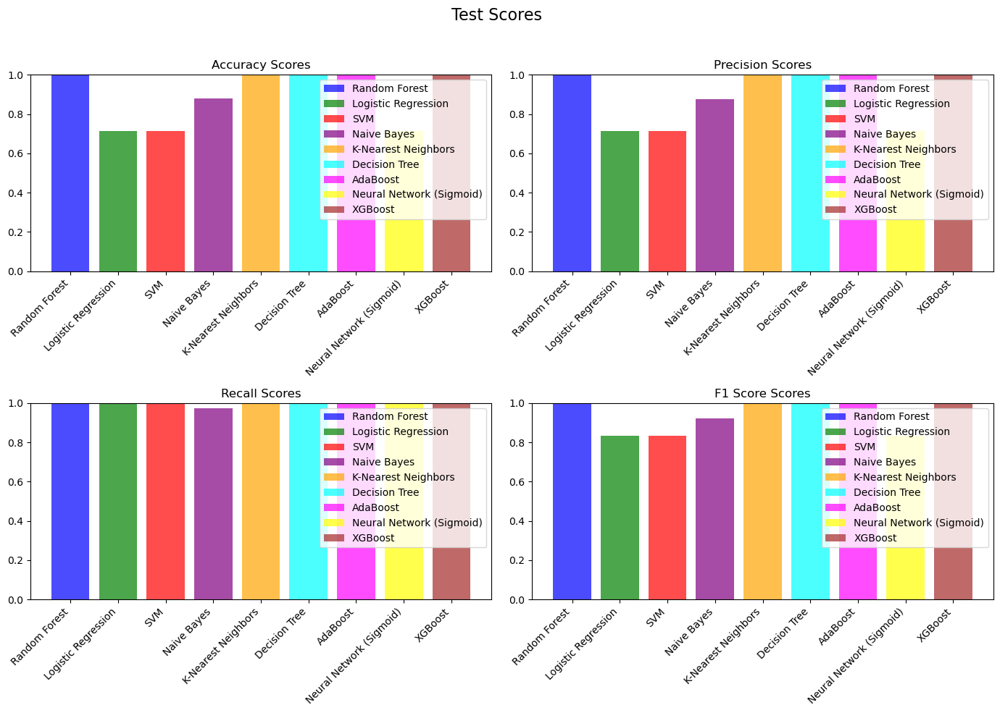

When K = 10
['UTC', 'TemperatureC', 'Humidity', 'TVOCppb', 'Raw H2', 'Raw Ethanol', 'PressurehPa', 'NC0.5', 'NC1.0', 'CNT']
Training and evaluating Random Forest...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


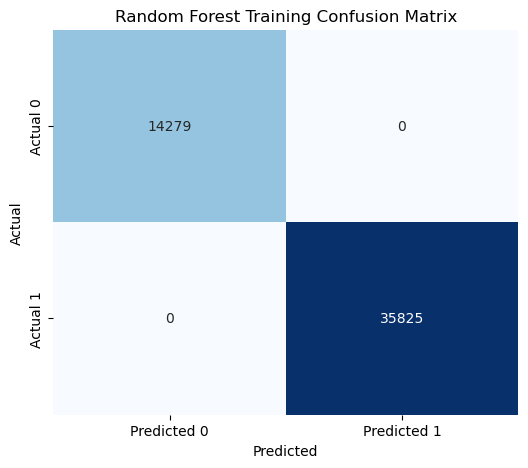

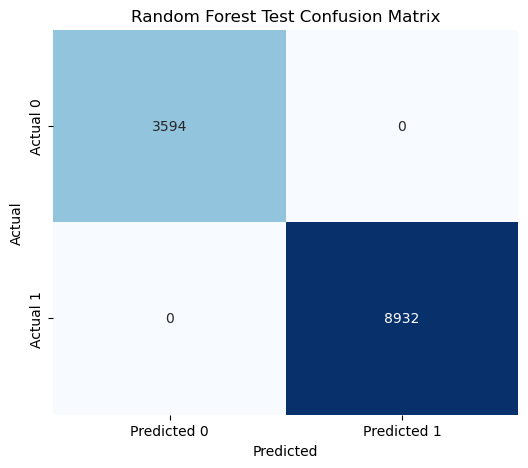

Training and evaluating Logistic Regression...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


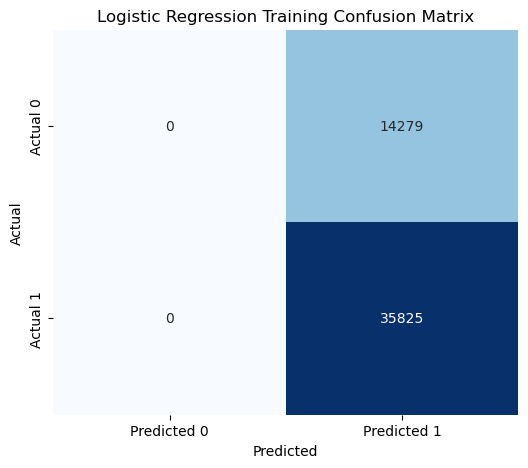

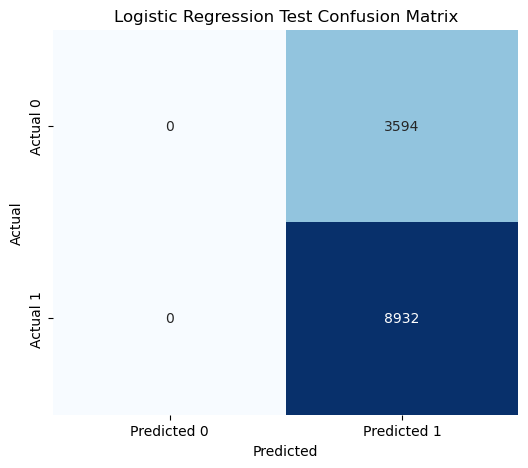

Training and evaluating SVM...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


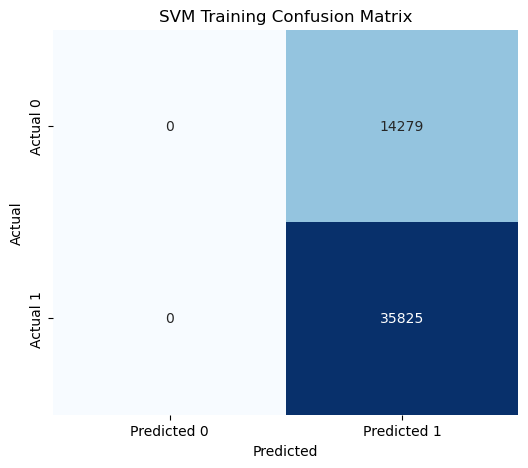

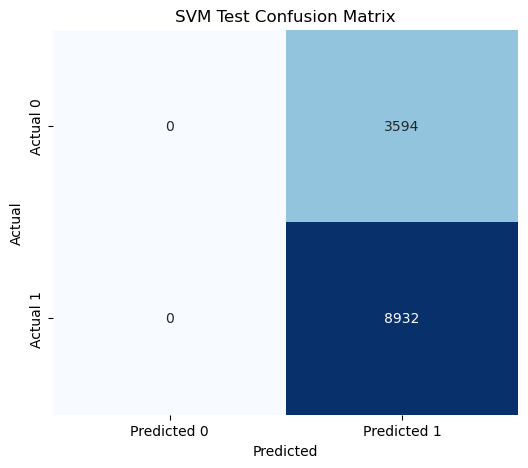

Training and evaluating Naive Bayes...

Training Scores:
Accuracy: 0.8691
Precision: 0.8605
Recall: 0.9750
F1 Score: 0.9142

Test Scores:
Accuracy: 0.8705
Precision: 0.8632
Recall: 0.9726
F1 Score: 0.9146


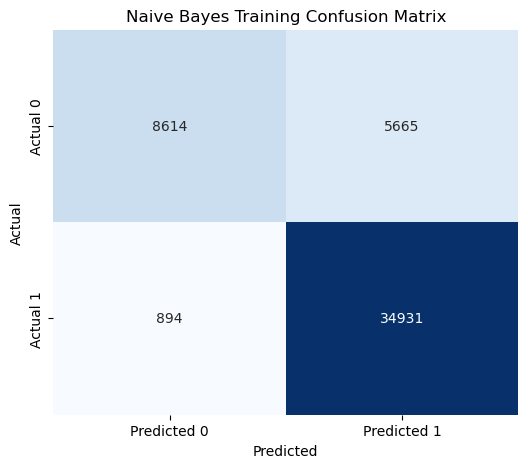

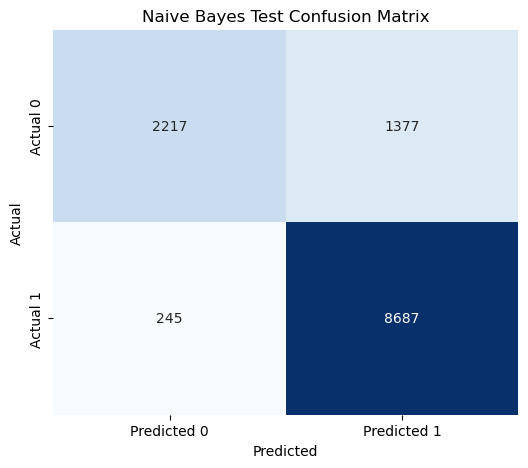

Training and evaluating K-Nearest Neighbors...

Training Scores:
Accuracy: 0.9998
Precision: 0.9999
Recall: 0.9999
F1 Score: 0.9999

Test Scores:
Accuracy: 0.9999
Precision: 1.0000
Recall: 0.9999
F1 Score: 0.9999


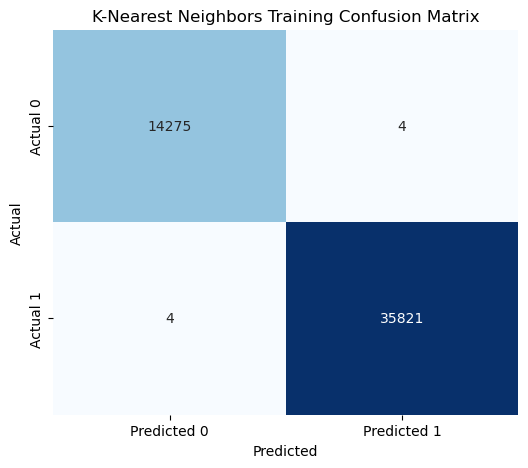

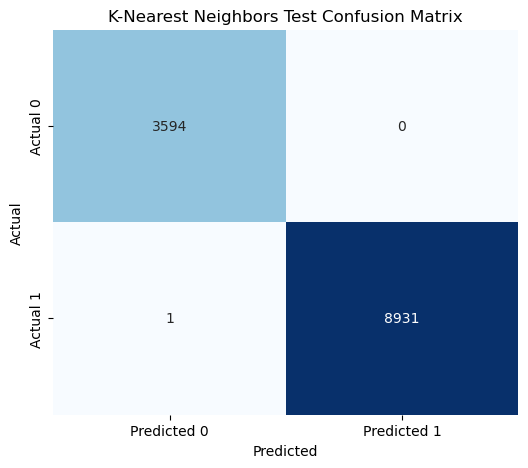

Training and evaluating Decision Tree...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


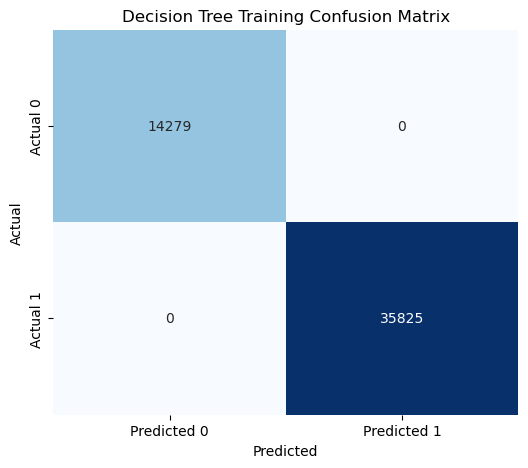

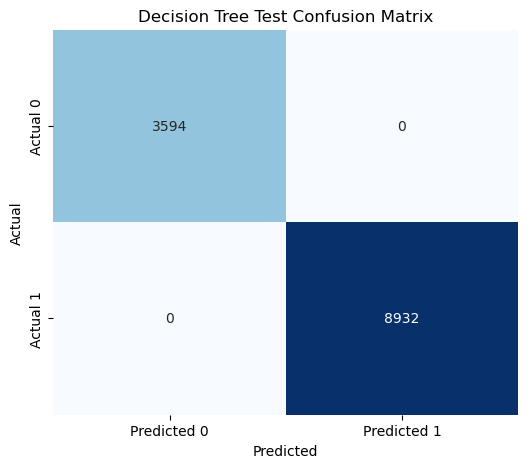

Training and evaluating AdaBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 1.0000
F1 Score: 0.9999


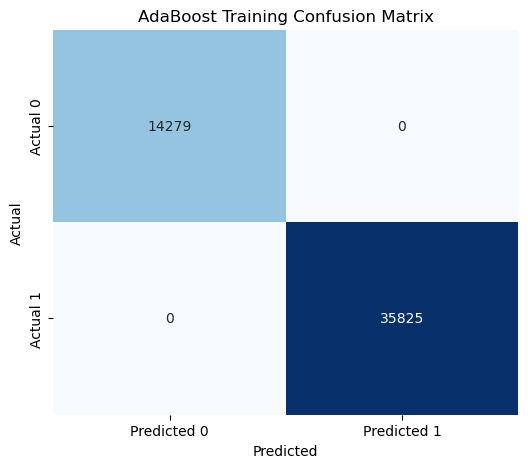

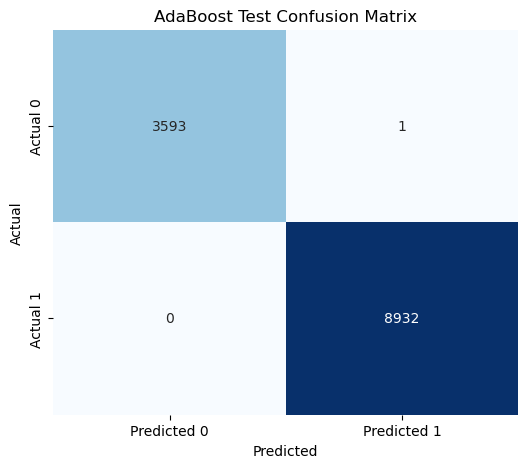

Training and evaluating Neural Network (Sigmoid)...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


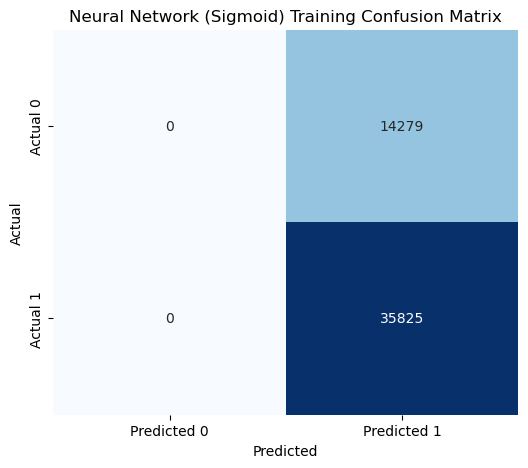

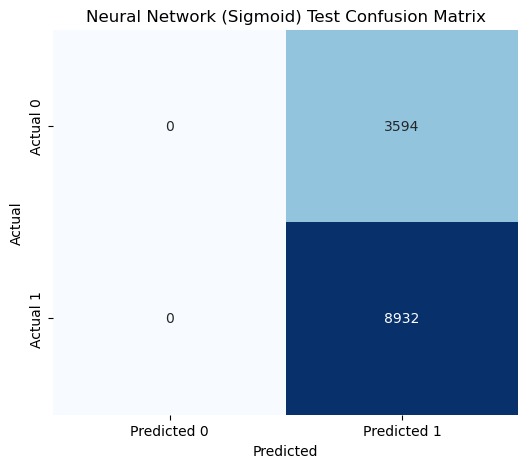

Training and evaluating XGBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


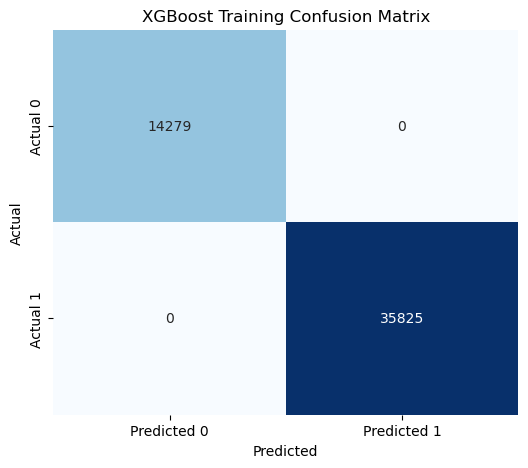

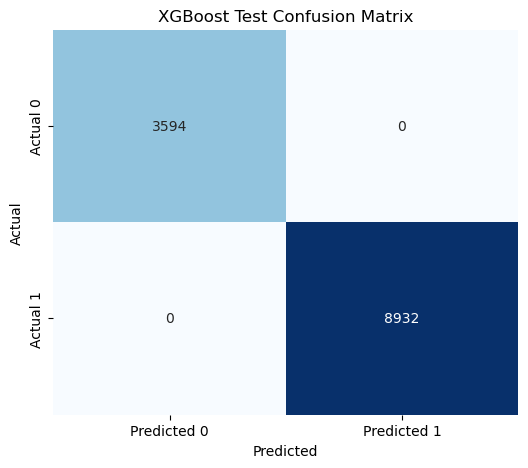

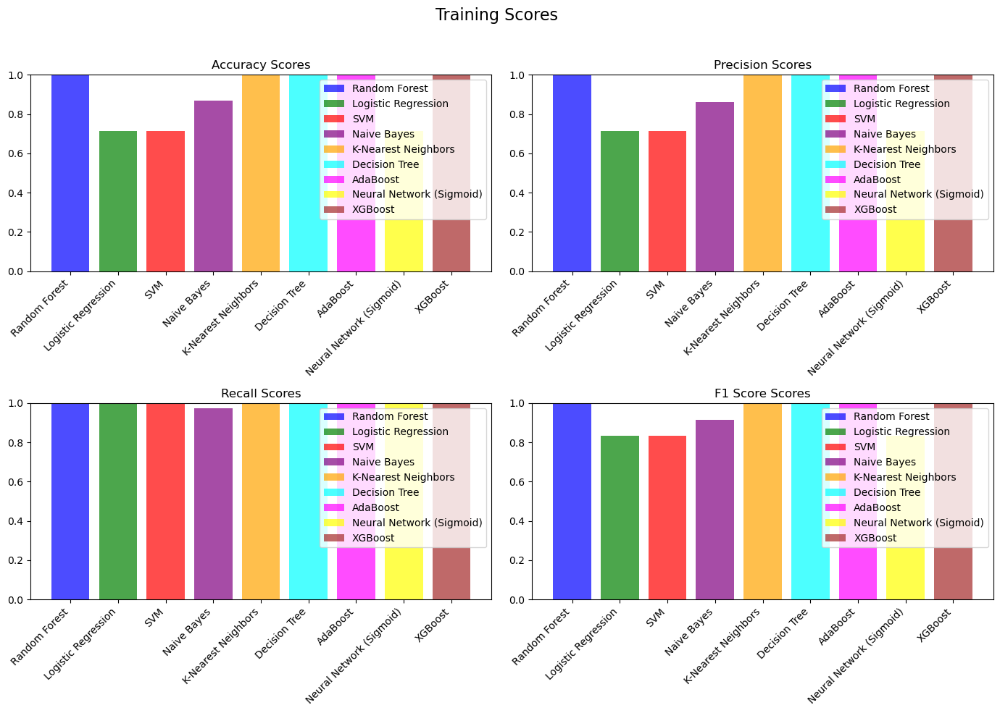

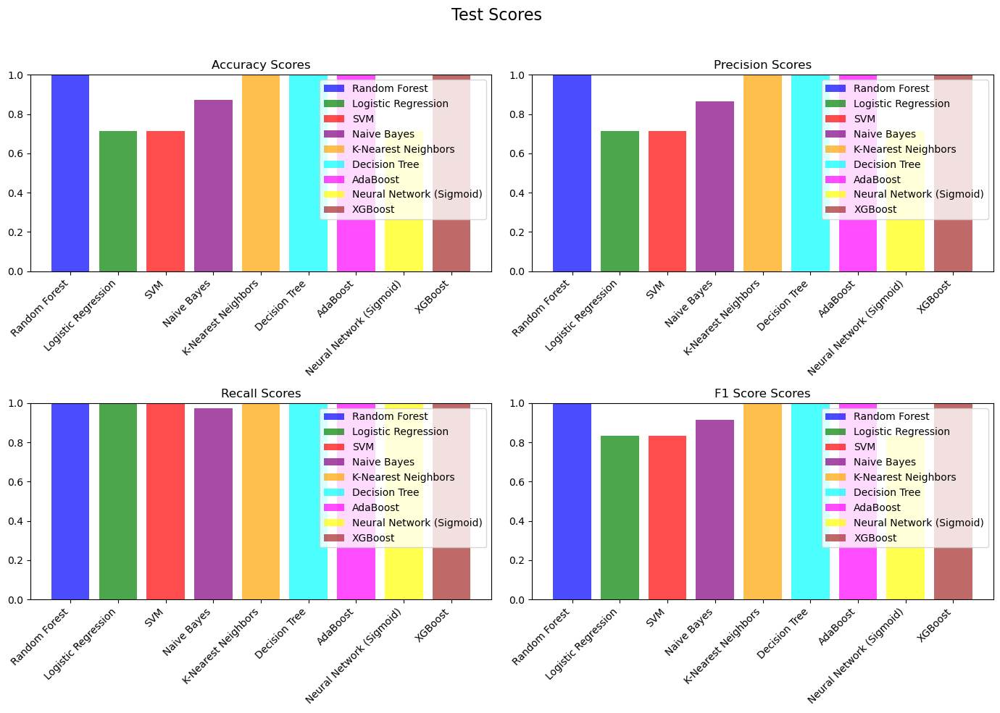

In [35]:
ll = [2, 5, 7, 10]
for iii in ll:
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    sel_five_cols = SelectKBest(mutual_info_classif, k=iii)
    sel_five_cols.fit(X_train, y_train)
    X_train.columns[sel_five_cols.get_support()]
    final_selected_features_list = list(X_train.columns[sel_five_cols.get_support()])
    print(f"When K = {iii}")
    print(final_selected_features_list)

#     X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    X_train = X_train[final_selected_features_list]
    X_test = X_test[final_selected_features_list]

    logreg_classifier = LogisticRegression()
    svm_classifier = SVC()
    nb_classifier = GaussianNB()
    knn_classifier = KNeighborsClassifier()
    dt_classifier = DecisionTreeClassifier()
    ada_classifier = AdaBoostClassifier()
    sigmoid_nn_classifier = MLPClassifier(activation='logistic')
    softmax_nn_classifier = MLPClassifier(activation='softmax')
    xgb_classifier = xgb.XGBClassifier()
    rf_classifier = RandomForestClassifier()
    classifiers = {
        'Random Forest': rf_classifier,
        'Logistic Regression': logreg_classifier,
        'SVM': svm_classifier,
        'Naive Bayes': nb_classifier,
        'K-Nearest Neighbors': knn_classifier,
        'Decision Tree': dt_classifier,
        'AdaBoost': ada_classifier,
        'Neural Network (Sigmoid)': sigmoid_nn_classifier,
        'XGBoost': xgb_classifier
    }

    accuracy_scores_train = []
    precision_scores_train = []
    recall_scores_train = []
    f1_scores_train = []

    accuracy_scores_test = []
    precision_scores_test = []
    recall_scores_test = []
    f1_scores_test = []

    for name, classifier in classifiers.items():
        print(f"Training and evaluating {name}...")
        classifier.fit(X_train, y_train)

        y_train_pred = classifier.predict(X_train)
        train_accuracy = accuracy_score(y_train, y_train_pred)
        train_precision = precision_score(y_train, y_train_pred)
        train_recall = recall_score(y_train, y_train_pred)
        train_f1 = f1_score(y_train, y_train_pred)

        y_test_pred = classifier.predict(X_test)
        test_accuracy = accuracy_score(y_test, y_test_pred)
        test_precision = precision_score(y_test, y_test_pred)
        test_recall = recall_score(y_test, y_test_pred)
        test_f1 = f1_score(y_test, y_test_pred)

        conf_matrix_train = confusion_matrix(y_train, y_train_pred)
        conf_matrix_test = confusion_matrix(y_test, y_test_pred)

        accuracy_scores_train.append(train_accuracy)
        precision_scores_train.append(train_precision)
        recall_scores_train.append(train_recall)
        f1_scores_train.append(train_f1)

        accuracy_scores_test.append(test_accuracy)
        precision_scores_test.append(test_precision)
        recall_scores_test.append(test_recall)
        f1_scores_test.append(test_f1)

        print("\nTraining Scores:")
        print(f"Accuracy: {train_accuracy:.4f}")
        print(f"Precision: {train_precision:.4f}")
        print(f"Recall: {train_recall:.4f}")
        print(f"F1 Score: {train_f1:.4f}")

        print("\nTest Scores:")
        print(f"Accuracy: {test_accuracy:.4f}")
        print(f"Precision: {test_precision:.4f}")
        print(f"Recall: {test_recall:.4f}")
        print(f"F1 Score: {test_f1:.4f}")

        plt.figure(figsize=(6, 5))
        sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", cbar=False,
                    xticklabels=['Predicted 0', 'Predicted 1'],
                    yticklabels=['Actual 0', 'Actual 1'])
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title(f"{name} Training Confusion Matrix")
        plt.show()

        plt.figure(figsize=(6, 5))
        sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", cbar=False,
                    xticklabels=['Predicted 0', 'Predicted 1'],
                    yticklabels=['Actual 0', 'Actual 1'])
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title(f"{name} Test Confusion Matrix")
        plt.show()

    score_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
    colors = ['blue', 'green', 'red', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown']

    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
    fig.suptitle('Training Scores', fontsize=16)

    for i, score_list in enumerate([accuracy_scores_train, precision_scores_train, recall_scores_train, f1_scores_train]):
        ax = axes[i // 2, i % 2]
        for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
            ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

        ax.set_title(f'{score_names[i]} Scores')
        ax.set_ylim([0, 1])
        ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')
        ax.legend()

    plt.tight_layout(rect=[0, 0, 1, 0.96]) 

    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
    fig.suptitle('Test Scores', fontsize=16)

    for i, score_list in enumerate([accuracy_scores_test, precision_scores_test, recall_scores_test, f1_scores_test]):
        ax = axes[i // 2, i % 2]
        for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
            ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

        ax.set_title(f'{score_names[i]} Scores')
        ax.set_ylim([0, 1])
        ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')  
        ax.legend()

    plt.tight_layout(rect=[0, 0, 1, 0.96]) 

    plt.show()


Feature: UTC Score: 0.597289198768386
Feature: PressurehPa Score: 0.4857995065767069
Feature: CNT Score: 0.4054881192745283
Feature: Raw Ethanol Score: 0.3695953143856672
Feature: TVOCppb Score: 0.3518525183946952
Feature: Humidity Score: 0.22823402842469354
Feature: Raw H2 Score: 0.1991840795186819
Feature: NC1.0 Score: 0.14042302467689938
Feature: TemperatureC Score: 0.1369913867050334
Feature: NC0.5 Score: 0.13638239216503267
Feature: PM1.0 Score: 0.11940972363772295
Feature: PM2.5 Score: 0.11739019142219265
Feature: NC2.5 Score: 0.10613393954830697
Feature: eCO2ppm Score: 0.066749936047936


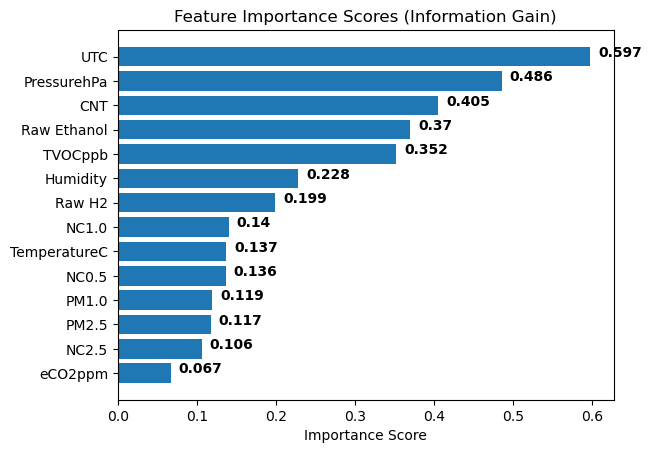

In [36]:
ig = mutual_info_classif(X, y)

feature_scores = {}
for i in range(len(X.columns)):
    feature_scores[X.columns[i]] = ig[i]

sorted_features = sorted(feature_scores.items(), key=lambda x: x[1], reverse=True)

for feature, score in sorted_features:
    print("Feature:", feature, "Score:", score)

fig, ax = plt.subplots()
y_pos = np.arange(len(sorted_features))
ax.barh(y_pos, [score for feature, score in sorted_features], align="center")
ax.set_yticks(y_pos)
ax.set_yticklabels([feature for feature, score in sorted_features])
ax.invert_yaxis() 
ax.set_xlabel("Importance Score")
ax.set_title("Feature Importance Scores (Information Gain)")

for i, v in enumerate([score for feature, score in sorted_features]):
    ax.text(v + 0.01, i, str(round(v, 3)), color="black", fontweight="bold")

plt.show()


Training and evaluating Random Forest...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


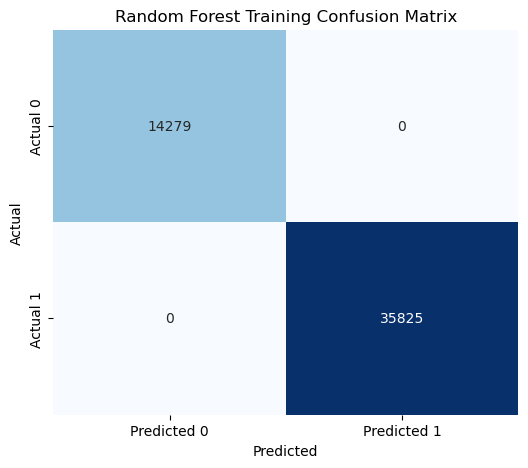

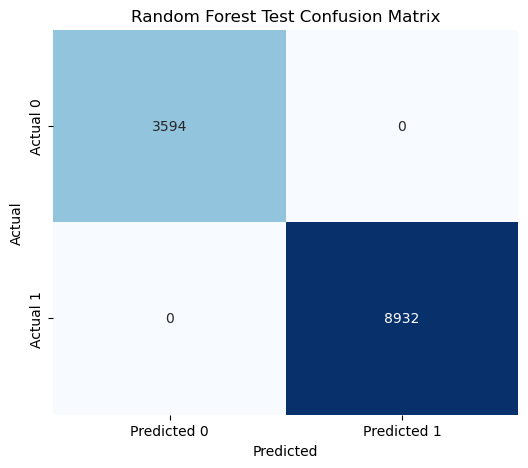

Training and evaluating Logistic Regression...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


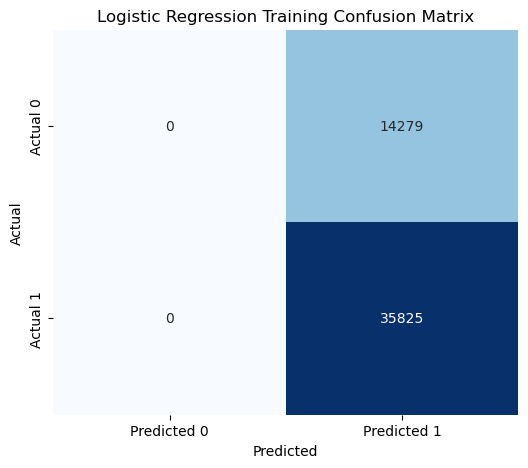

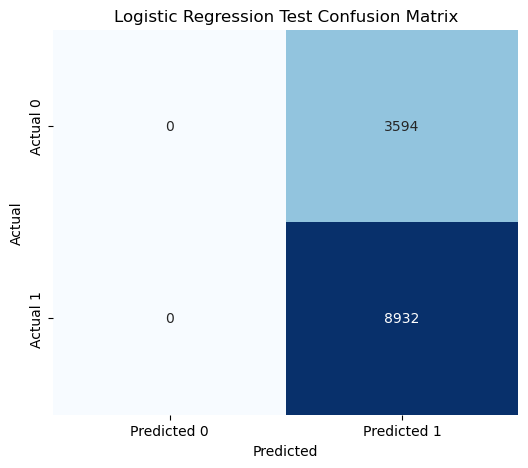

Training and evaluating SVM...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


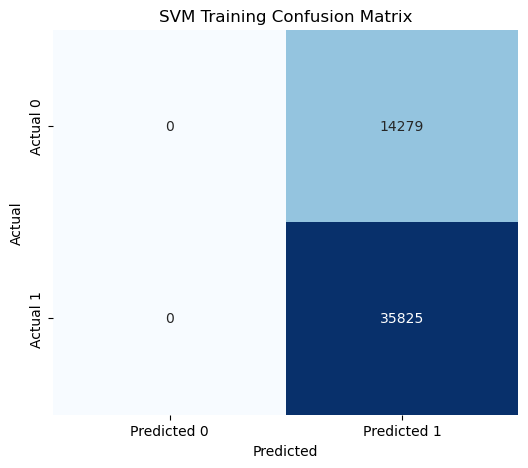

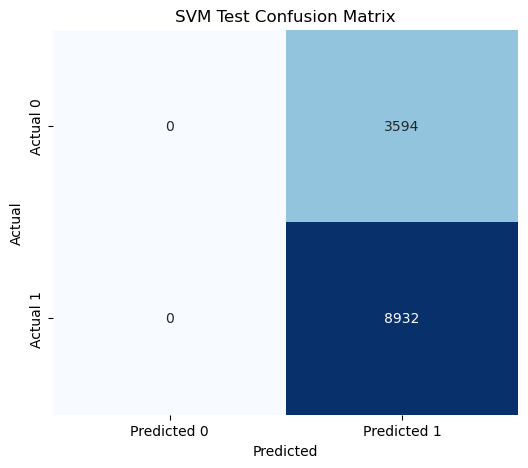

Training and evaluating Naive Bayes...

Training Scores:
Accuracy: 0.8791
Precision: 0.8719
Recall: 0.9741
F1 Score: 0.9202

Test Scores:
Accuracy: 0.8814
Precision: 0.8753
Recall: 0.9722
F1 Score: 0.9212


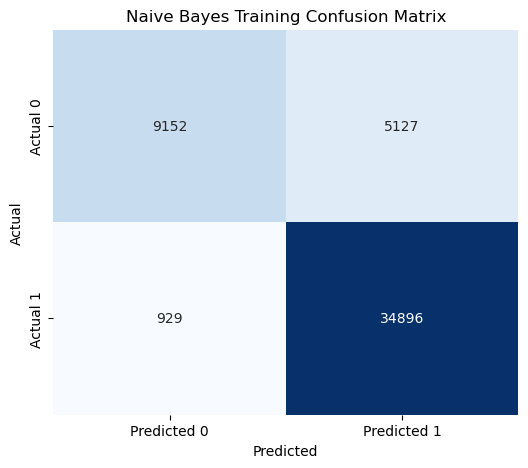

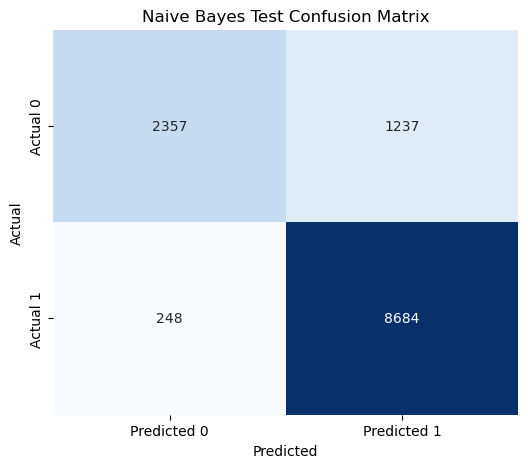

Training and evaluating K-Nearest Neighbors...

Training Scores:
Accuracy: 0.9997
Precision: 0.9997
Recall: 0.9999
F1 Score: 0.9998

Test Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 1.0000
F1 Score: 0.9999


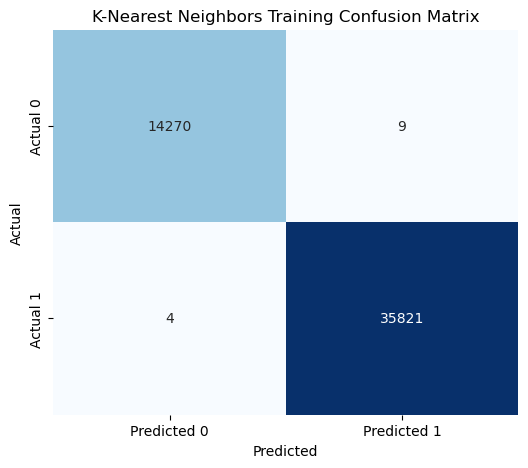

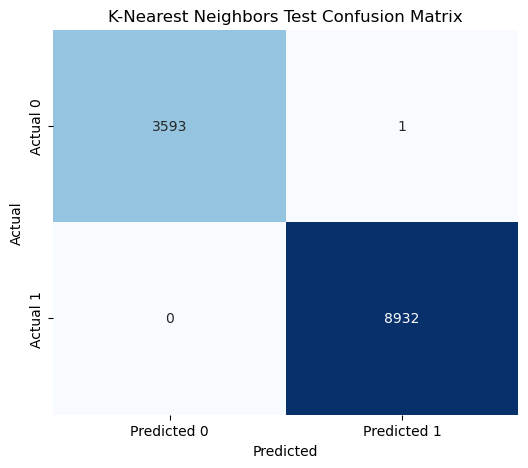

Training and evaluating Decision Tree...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


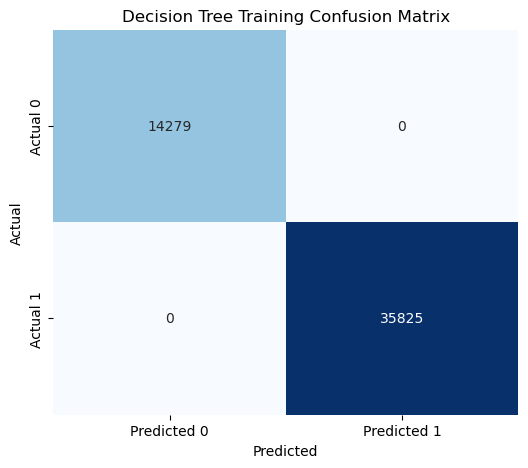

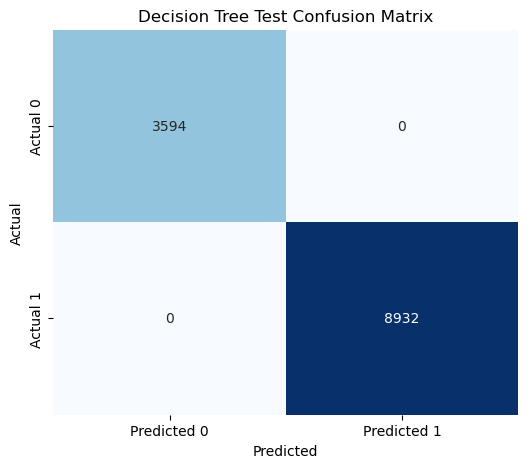

Training and evaluating AdaBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


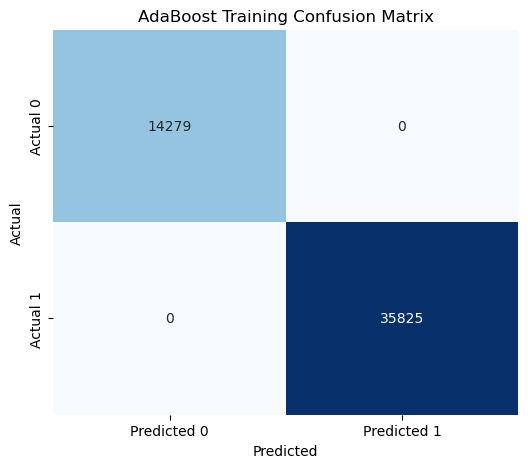

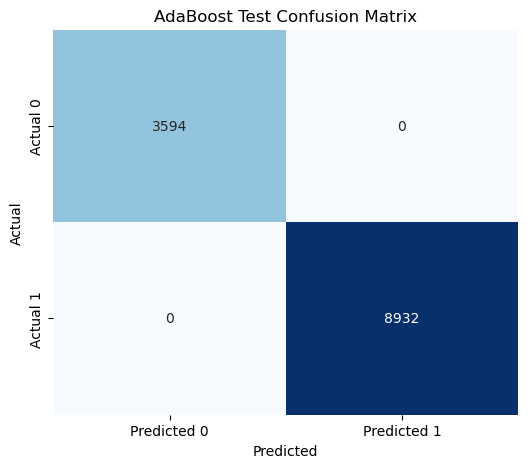

Training and evaluating Neural Network (Sigmoid)...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


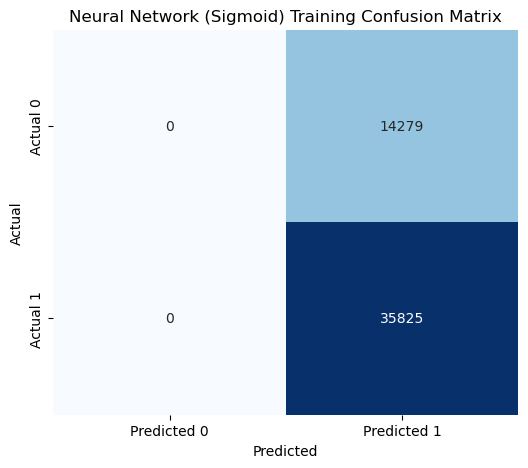

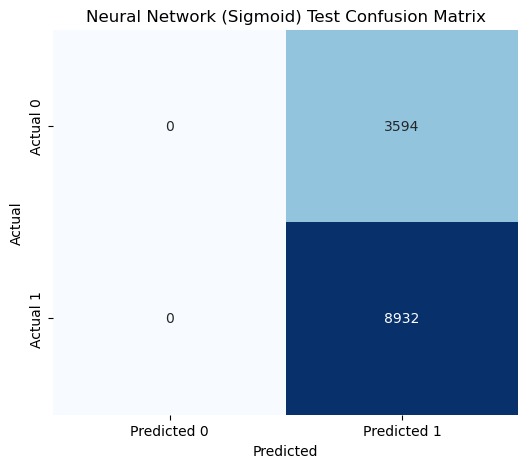

Training and evaluating XGBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


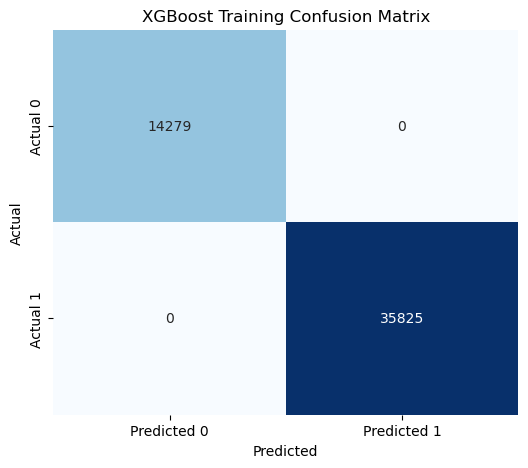

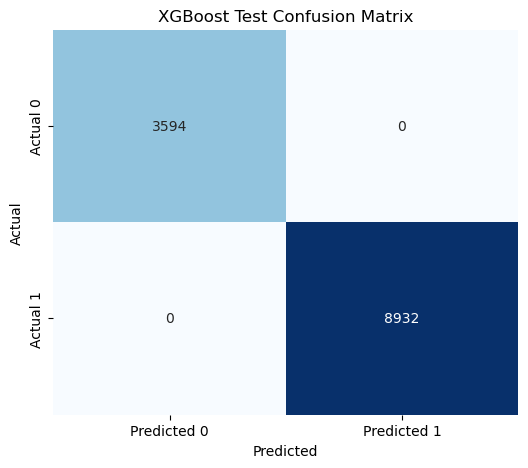

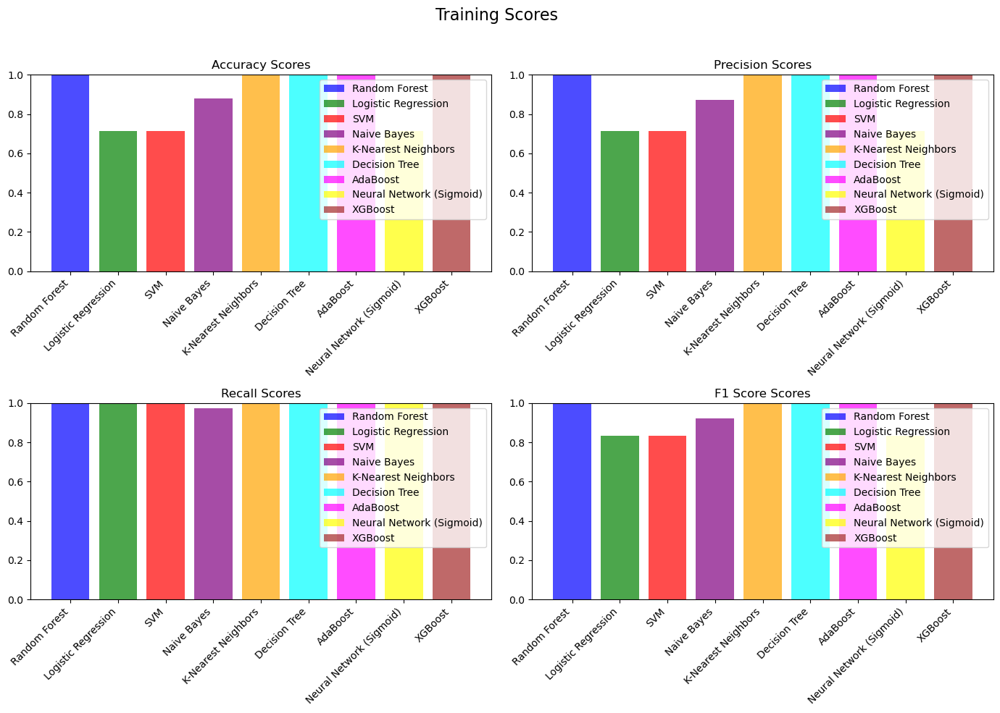

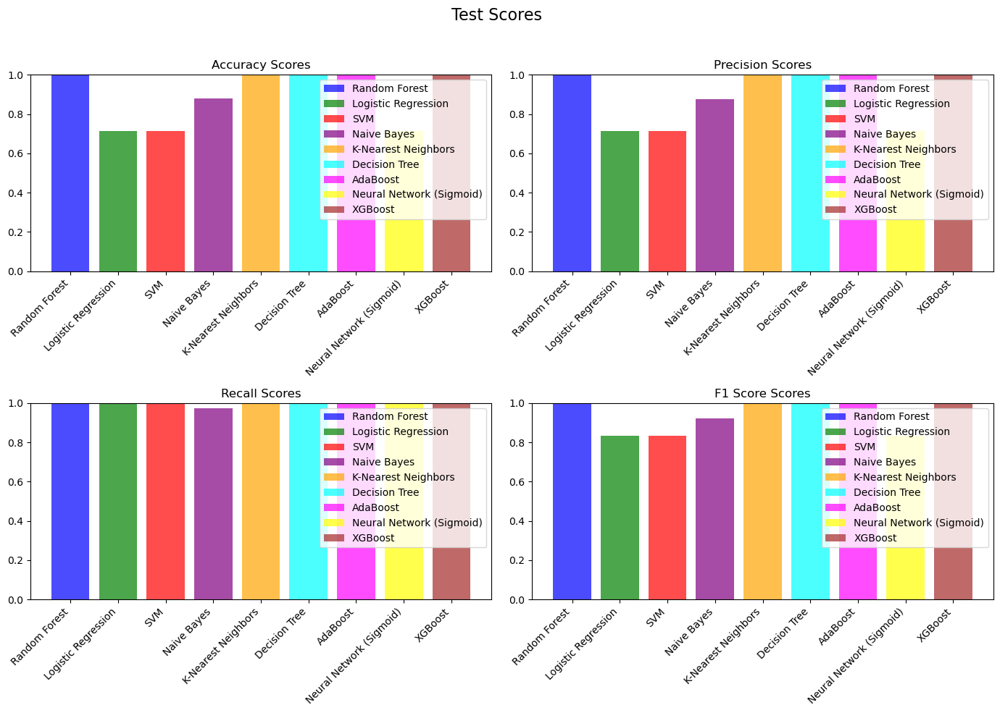

In [37]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train = X_train[['UTC', 'PressurehPa', 'CNT', 'Raw Ethanol', 'TVOCppb', 'Humidity', 'Raw H2']]
X_test = X_test[['UTC', 'PressurehPa', 'CNT', 'Raw Ethanol', 'TVOCppb', 'Humidity', 'Raw H2']]

logreg_classifier = LogisticRegression()
svm_classifier = SVC()
nb_classifier = GaussianNB()
knn_classifier = KNeighborsClassifier()
dt_classifier = DecisionTreeClassifier()
ada_classifier = AdaBoostClassifier()
sigmoid_nn_classifier = MLPClassifier(activation='logistic')
softmax_nn_classifier = MLPClassifier(activation='softmax')
xgb_classifier = xgb.XGBClassifier()
rf_classifier = RandomForestClassifier()
classifiers = {
    'Random Forest': rf_classifier,
    'Logistic Regression': logreg_classifier,
    'SVM': svm_classifier,
    'Naive Bayes': nb_classifier,
    'K-Nearest Neighbors': knn_classifier,
    'Decision Tree': dt_classifier,
    'AdaBoost': ada_classifier,
    'Neural Network (Sigmoid)': sigmoid_nn_classifier,
    'XGBoost': xgb_classifier
}

accuracy_scores_train = []
precision_scores_train = []
recall_scores_train = []
f1_scores_train = []

accuracy_scores_test = []
precision_scores_test = []
recall_scores_test = []
f1_scores_test = []

for name, classifier in classifiers.items():
    print(f"Training and evaluating {name}...")
    classifier.fit(X_train, y_train)

    y_train_pred = classifier.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    train_precision = precision_score(y_train, y_train_pred)
    train_recall = recall_score(y_train, y_train_pred)
    train_f1 = f1_score(y_train, y_train_pred)

    y_test_pred = classifier.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_precision = precision_score(y_test, y_test_pred)
    test_recall = recall_score(y_test, y_test_pred)
    test_f1 = f1_score(y_test, y_test_pred)

    conf_matrix_train = confusion_matrix(y_train, y_train_pred)
    conf_matrix_test = confusion_matrix(y_test, y_test_pred)
    
    accuracy_scores_train.append(train_accuracy)
    precision_scores_train.append(train_precision)
    recall_scores_train.append(train_recall)
    f1_scores_train.append(train_f1)

    accuracy_scores_test.append(test_accuracy)
    precision_scores_test.append(test_precision)
    recall_scores_test.append(test_recall)
    f1_scores_test.append(test_f1)
    
    print("\nTraining Scores:")
    print(f"Accuracy: {train_accuracy:.4f}")
    print(f"Precision: {train_precision:.4f}")
    print(f"Recall: {train_recall:.4f}")
    print(f"F1 Score: {train_f1:.4f}")

    print("\nTest Scores:")
    print(f"Accuracy: {test_accuracy:.4f}")
    print(f"Precision: {test_precision:.4f}")
    print(f"Recall: {test_recall:.4f}")
    print(f"F1 Score: {test_f1:.4f}")

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Training Confusion Matrix")
    plt.show()

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Test Confusion Matrix")
    plt.show()

score_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
colors = ['blue', 'green', 'red', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown']

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Training Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_train, precision_scores_train, recall_scores_train, f1_scores_train]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Test Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_test, precision_scores_test, recall_scores_test, f1_scores_test]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')  
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

plt.show()


# Best

Selected Features: ('Humidity', 'TVOCppb', 'eCO2ppm', 'Raw Ethanol', 'CNT')
Accuracy: 0.9818178113387036


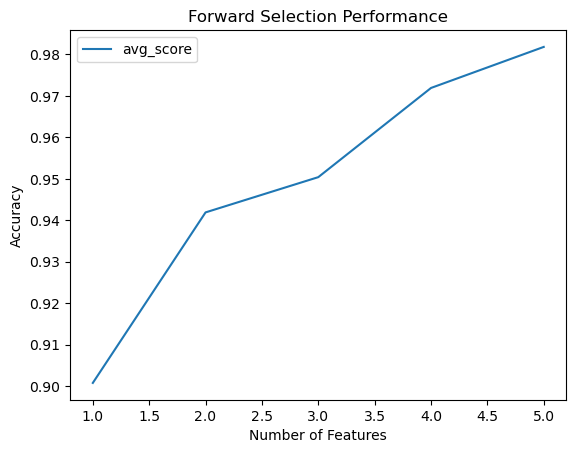

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = LogisticRegression()

sfs = SFS(model,
          k_features=5,
          forward=True,
          floating=False,
          scoring='accuracy',
          cv=5)

sfs.fit(X_train, y_train)
print('Selected Features:', sfs.k_feature_names_)

accuracy = sfs.k_score_
print('Accuracy:', accuracy)

sfs_df = pd.DataFrame.from_dict(sfs.get_metric_dict()).T
sfs_df['avg_score'] = sfs_df['avg_score'].astype(float)
fig, ax = plt.subplots()
sfs_df.plot(kind='line', y='avg_score', ax=ax)
ax.set_xlabel('Number of Features')
ax.set_ylabel('Accuracy')
ax.set_title('Forward Selection Performance')
plt.show()


Training and evaluating Random Forest...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 0.9999
Precision: 1.0000
Recall: 0.9999
F1 Score: 0.9999


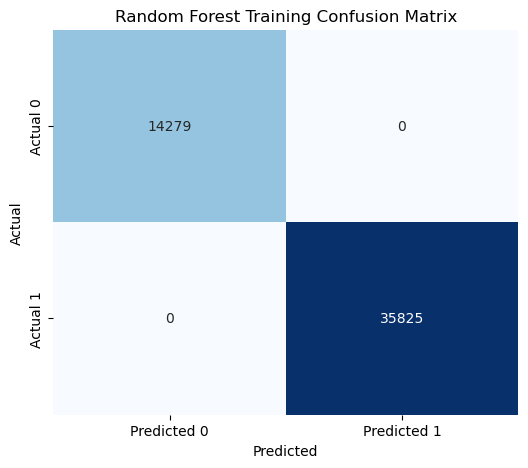

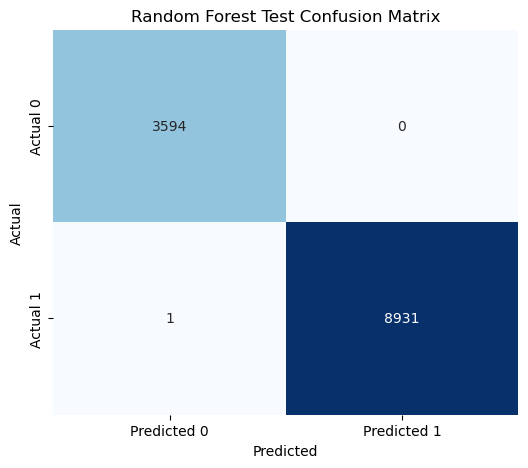

Training and evaluating Logistic Regression...

Training Scores:
Accuracy: 0.9817
Precision: 0.9972
Recall: 0.9771
F1 Score: 0.9871

Test Scores:
Accuracy: 0.9810
Precision: 0.9973
Recall: 0.9760
F1 Score: 0.9865


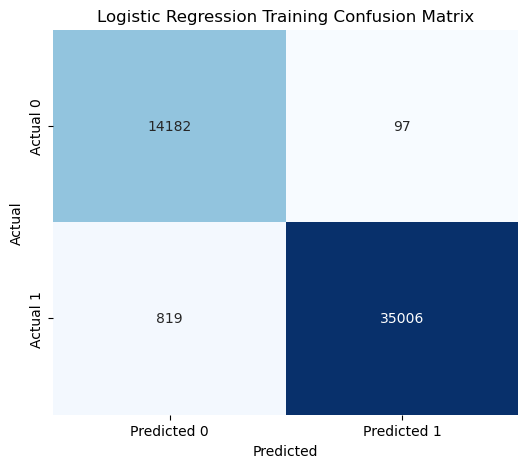

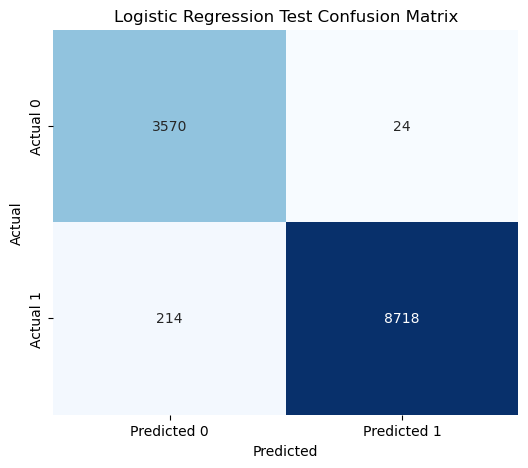

Training and evaluating SVM...

Training Scores:
Accuracy: 0.9813
Precision: 0.9946
Recall: 0.9791
F1 Score: 0.9868

Test Scores:
Accuracy: 0.9796
Precision: 0.9948
Recall: 0.9765
F1 Score: 0.9855


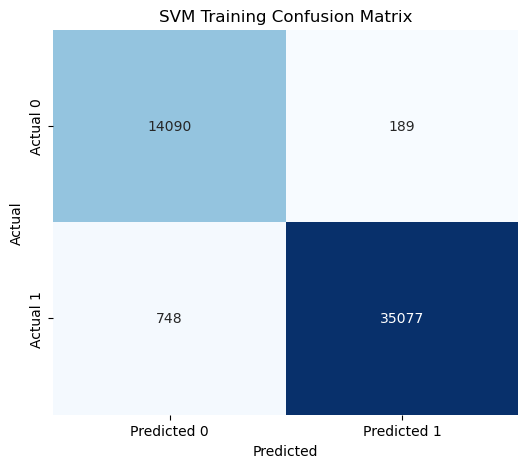

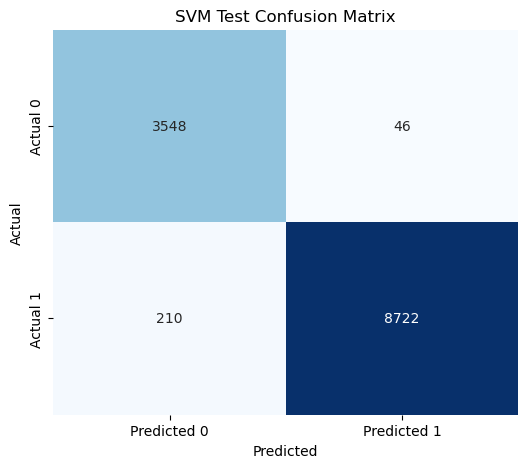

Training and evaluating Naive Bayes...

Training Scores:
Accuracy: 0.8799
Precision: 0.8708
Recall: 0.9770
F1 Score: 0.9208

Test Scores:
Accuracy: 0.8814
Precision: 0.8731
Recall: 0.9755
F1 Score: 0.9215


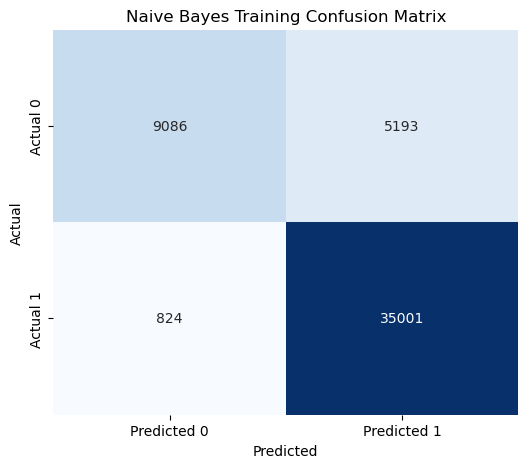

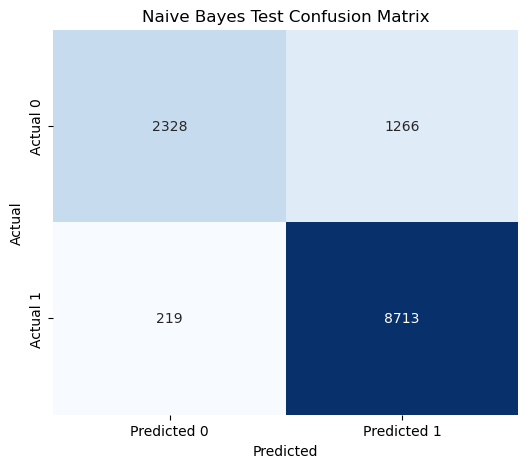

Training and evaluating K-Nearest Neighbors...

Training Scores:
Accuracy: 0.9997
Precision: 0.9996
Recall: 1.0000
F1 Score: 0.9998

Test Scores:
Accuracy: 0.9996
Precision: 0.9994
Recall: 1.0000
F1 Score: 0.9997


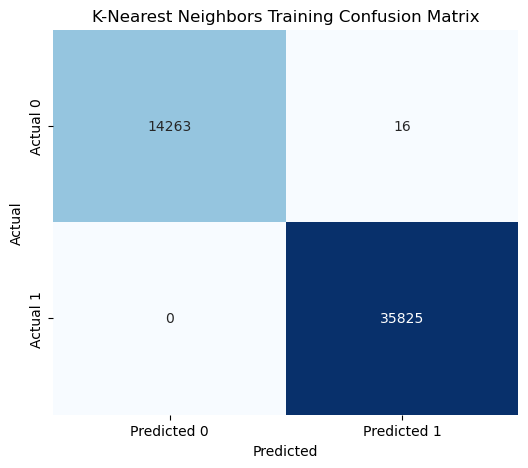

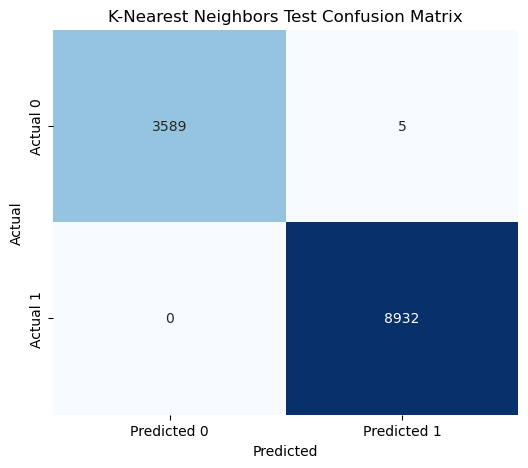

Training and evaluating Decision Tree...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 1.0000
F1 Score: 0.9999


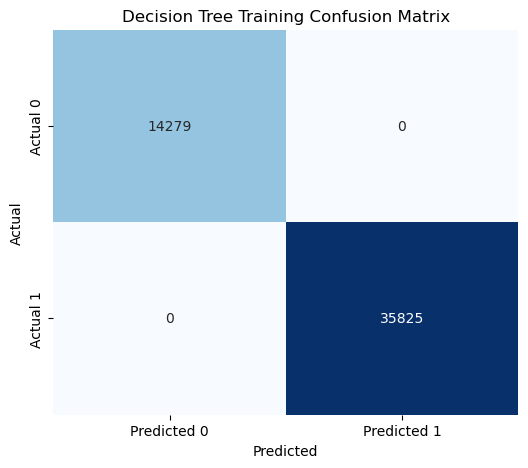

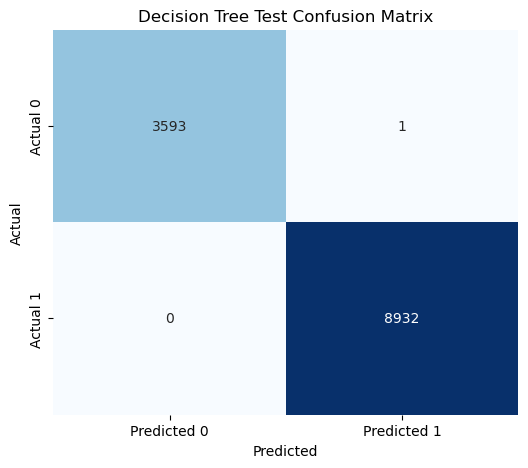

Training and evaluating AdaBoost...

Training Scores:
Accuracy: 0.9956
Precision: 0.9967
Recall: 0.9972
F1 Score: 0.9969

Test Scores:
Accuracy: 0.9954
Precision: 0.9962
Recall: 0.9973
F1 Score: 0.9968


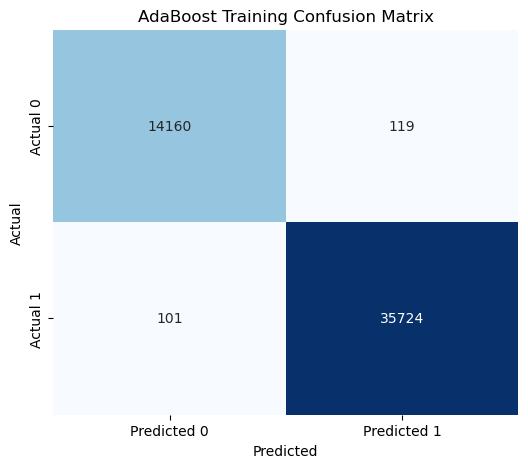

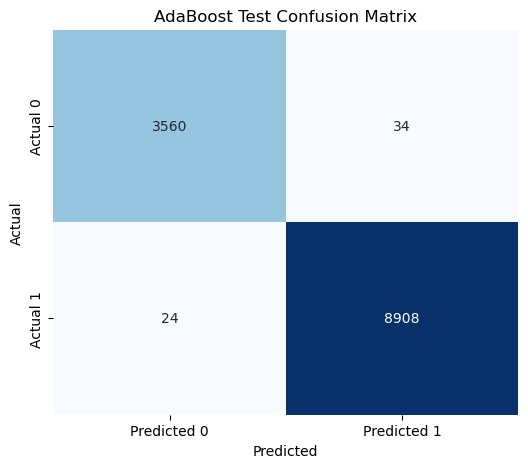

Training and evaluating Neural Network (Sigmoid)...

Training Scores:
Accuracy: 0.9865
Precision: 0.9925
Recall: 0.9886
F1 Score: 0.9906

Test Scores:
Accuracy: 0.9870
Precision: 0.9929
Recall: 0.9888
F1 Score: 0.9909


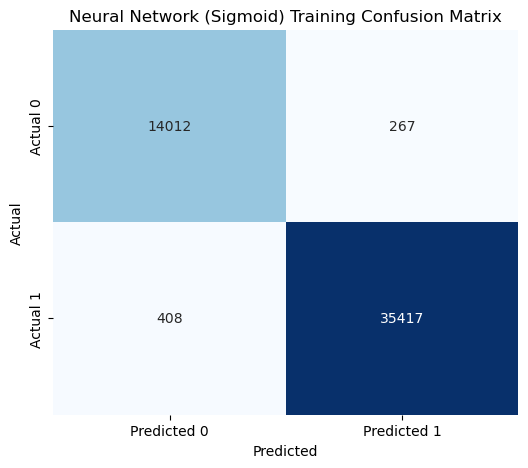

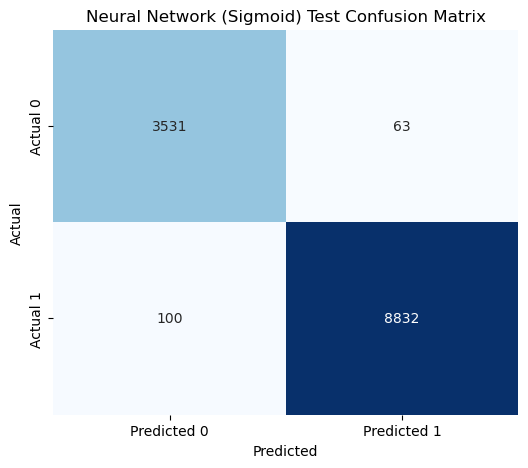

Training and evaluating XGBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


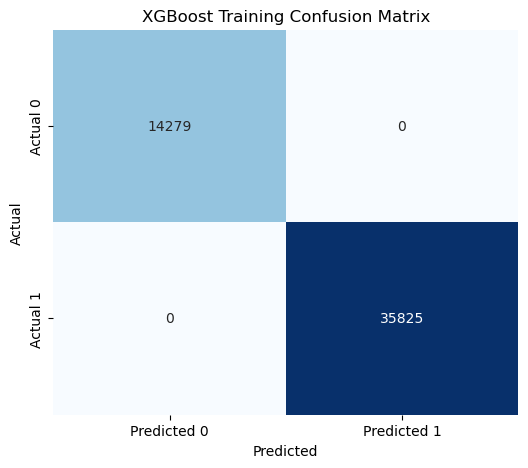

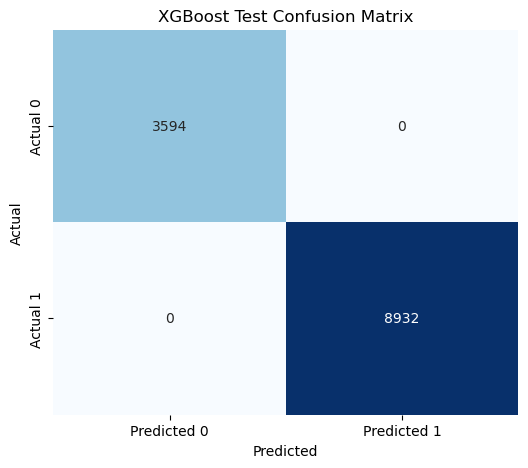

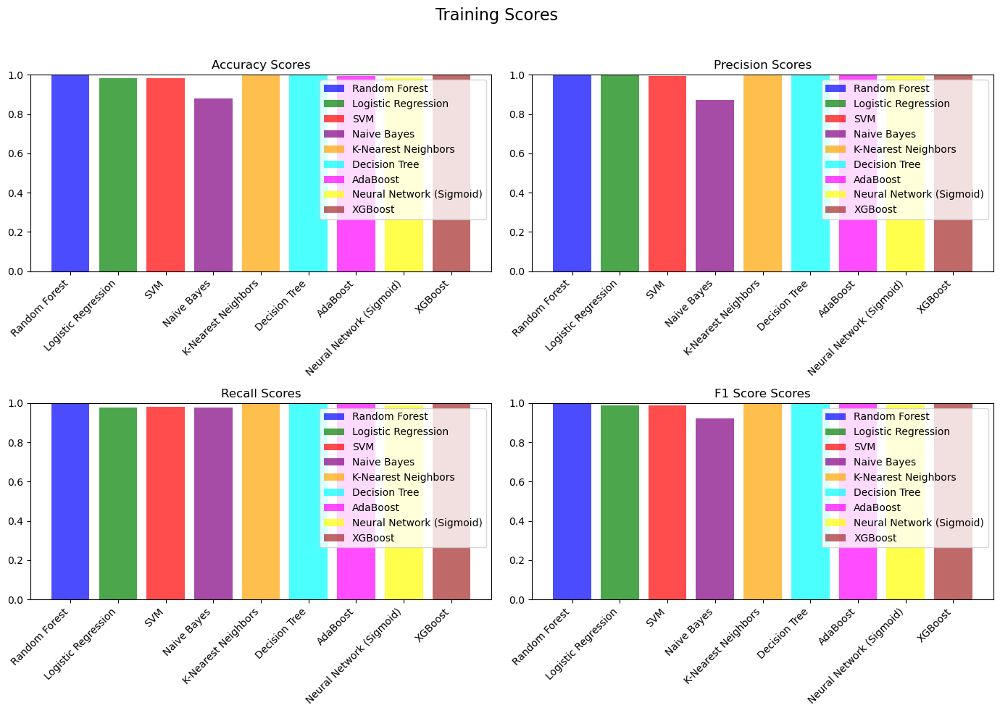

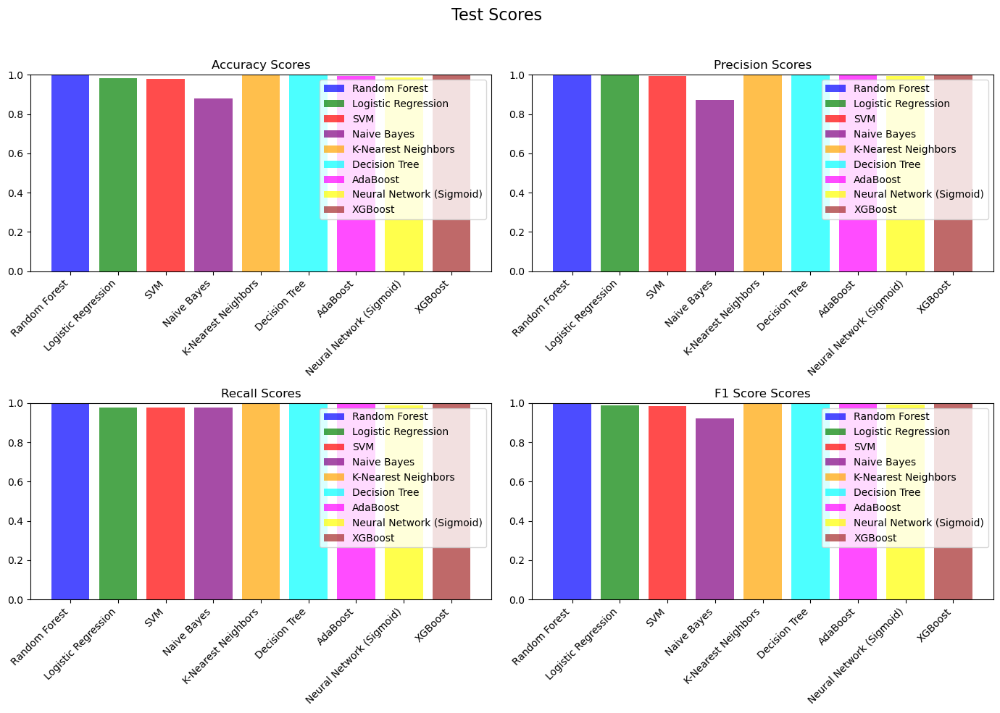

In [39]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train = X_train[['Humidity', 'TVOCppb', 'eCO2ppm', 'Raw Ethanol', 'CNT']]
X_test = X_test[['Humidity', 'TVOCppb', 'eCO2ppm', 'Raw Ethanol', 'CNT']]

logreg_classifier = LogisticRegression()
svm_classifier = SVC()
nb_classifier = GaussianNB()
knn_classifier = KNeighborsClassifier()
dt_classifier = DecisionTreeClassifier()
ada_classifier = AdaBoostClassifier()
sigmoid_nn_classifier = MLPClassifier(activation='logistic')
softmax_nn_classifier = MLPClassifier(activation='softmax')
xgb_classifier = xgb.XGBClassifier()
rf_classifier = RandomForestClassifier()
classifiers = {
    'Random Forest': rf_classifier,
    'Logistic Regression': logreg_classifier,
    'SVM': svm_classifier,
    'Naive Bayes': nb_classifier,
    'K-Nearest Neighbors': knn_classifier,
    'Decision Tree': dt_classifier,
    'AdaBoost': ada_classifier,
    'Neural Network (Sigmoid)': sigmoid_nn_classifier,
    'XGBoost': xgb_classifier
}

accuracy_scores_train = []
precision_scores_train = []
recall_scores_train = []
f1_scores_train = []

accuracy_scores_test = []
precision_scores_test = []
recall_scores_test = []
f1_scores_test = []

for name, classifier in classifiers.items():
    print(f"Training and evaluating {name}...")
    classifier.fit(X_train, y_train)

    y_train_pred = classifier.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    train_precision = precision_score(y_train, y_train_pred)
    train_recall = recall_score(y_train, y_train_pred)
    train_f1 = f1_score(y_train, y_train_pred)

    y_test_pred = classifier.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_precision = precision_score(y_test, y_test_pred)
    test_recall = recall_score(y_test, y_test_pred)
    test_f1 = f1_score(y_test, y_test_pred)

    conf_matrix_train = confusion_matrix(y_train, y_train_pred)
    conf_matrix_test = confusion_matrix(y_test, y_test_pred)
    
    accuracy_scores_train.append(train_accuracy)
    precision_scores_train.append(train_precision)
    recall_scores_train.append(train_recall)
    f1_scores_train.append(train_f1)

    accuracy_scores_test.append(test_accuracy)
    precision_scores_test.append(test_precision)
    recall_scores_test.append(test_recall)
    f1_scores_test.append(test_f1)
    
    print("\nTraining Scores:")
    print(f"Accuracy: {train_accuracy:.4f}")
    print(f"Precision: {train_precision:.4f}")
    print(f"Recall: {train_recall:.4f}")
    print(f"F1 Score: {train_f1:.4f}")

    print("\nTest Scores:")
    print(f"Accuracy: {test_accuracy:.4f}")
    print(f"Precision: {test_precision:.4f}")
    print(f"Recall: {test_recall:.4f}")
    print(f"F1 Score: {test_f1:.4f}")

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Training Confusion Matrix")
    plt.show()

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Test Confusion Matrix")
    plt.show()

score_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
colors = ['blue', 'green', 'red', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown']

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Training Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_train, precision_scores_train, recall_scores_train, f1_scores_train]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Test Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_test, precision_scores_test, recall_scores_test, f1_scores_test]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')  
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

plt.show()


Selected Features: ('UTC', 'Humidity', 'PM1.0', 'CNT')
Accuracy: 0.9998802454964336


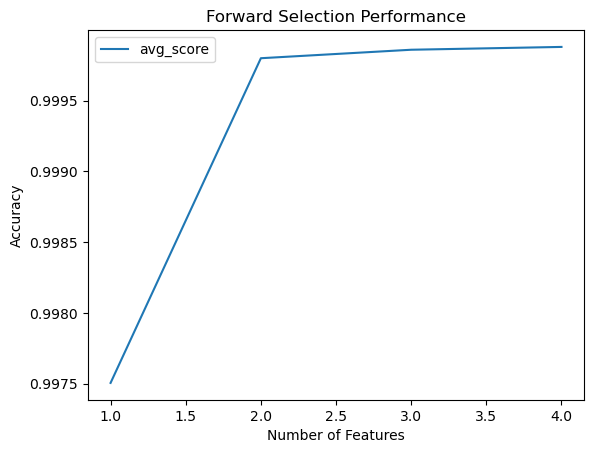

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = xgb.XGBClassifier()

sfs = SFS(model,
          k_features=4,
          forward=True,
          floating=False,
          scoring='accuracy',
          cv=5)

sfs.fit(X_train, y_train)
print('Selected Features:', sfs.k_feature_names_)

accuracy = sfs.k_score_
print('Accuracy:', accuracy)

sfs_df = pd.DataFrame.from_dict(sfs.get_metric_dict()).T
sfs_df['avg_score'] = sfs_df['avg_score'].astype(float)
fig, ax = plt.subplots()
sfs_df.plot(kind='line', y='avg_score', ax=ax)
ax.set_xlabel('Number of Features')
ax.set_ylabel('Accuracy')
ax.set_title('Forward Selection Performance')
plt.show()


Training and evaluating Random Forest...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


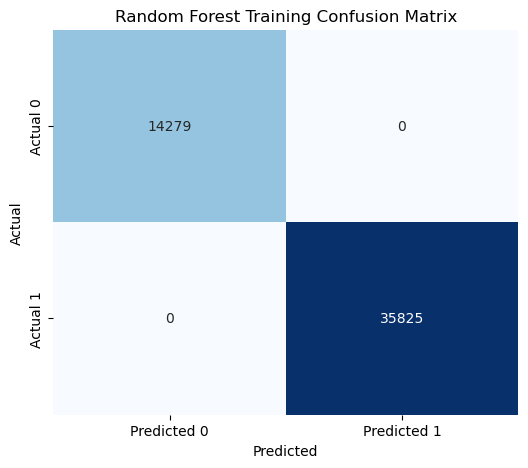

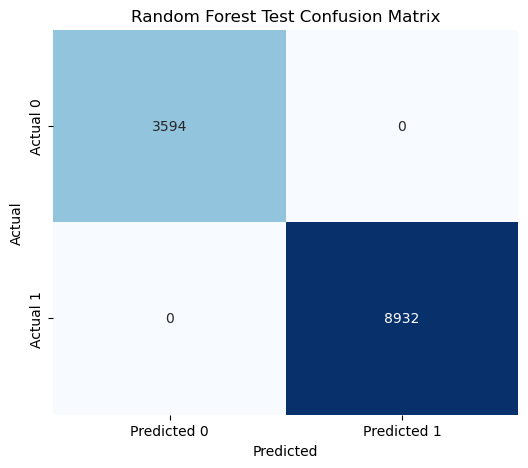

Training and evaluating Logistic Regression...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


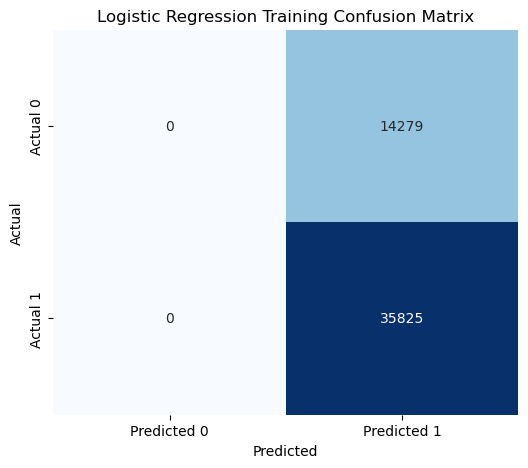

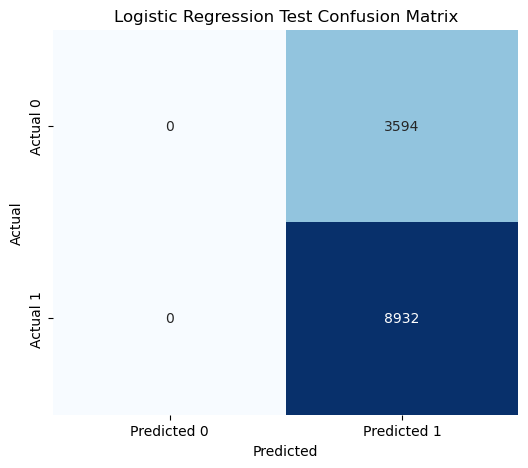

Training and evaluating SVM...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


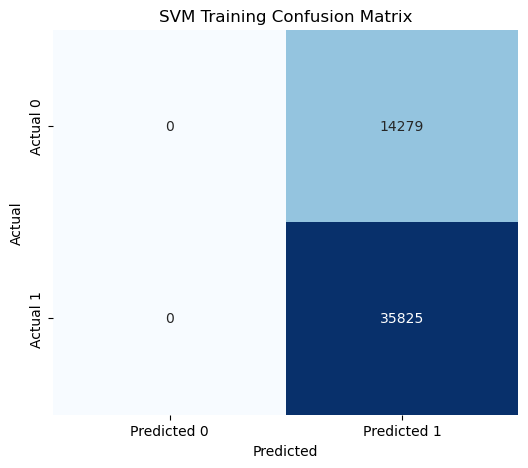

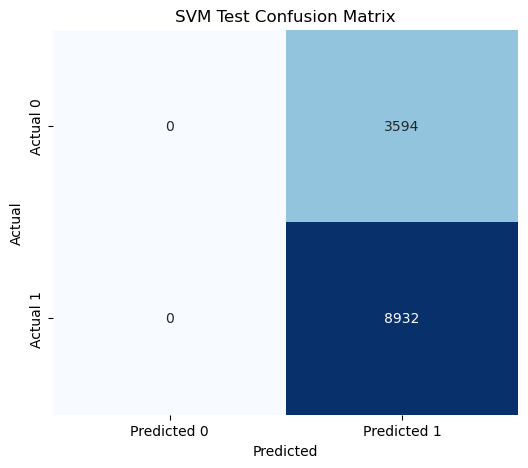

Training and evaluating Naive Bayes...

Training Scores:
Accuracy: 0.8790
Precision: 0.8729
Recall: 0.9725
F1 Score: 0.9200

Test Scores:
Accuracy: 0.8793
Precision: 0.8746
Recall: 0.9698
F1 Score: 0.9197


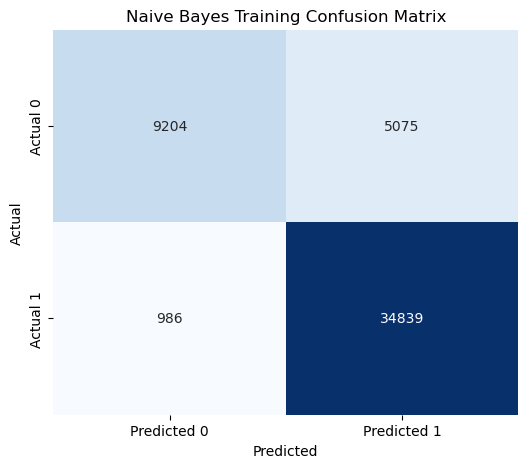

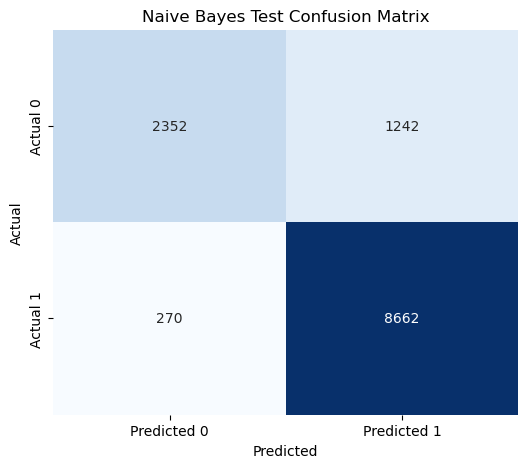

Training and evaluating K-Nearest Neighbors...

Training Scores:
Accuracy: 0.9998
Precision: 0.9998
Recall: 0.9999
F1 Score: 0.9999

Test Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 1.0000
F1 Score: 0.9999


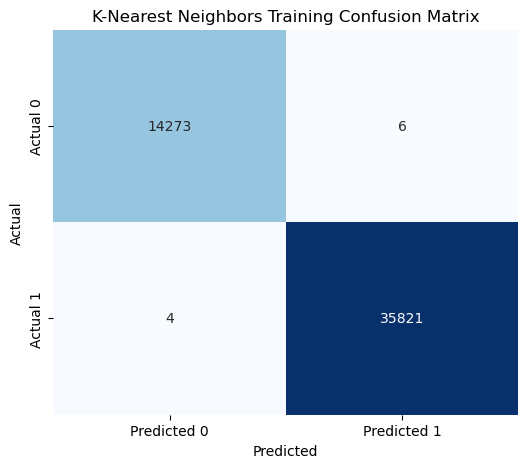

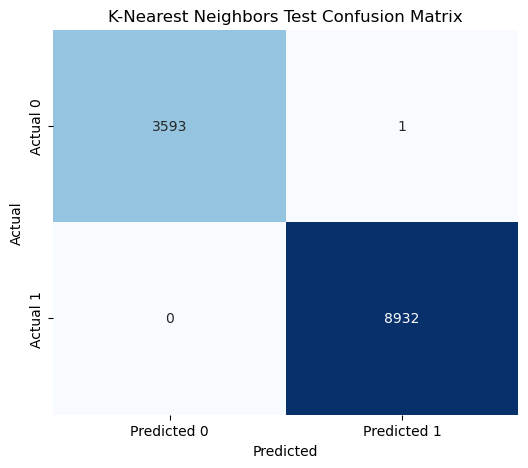

Training and evaluating Decision Tree...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 1.0000
F1 Score: 0.9999


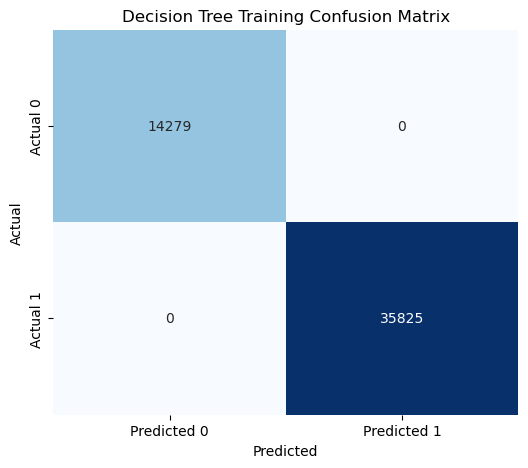

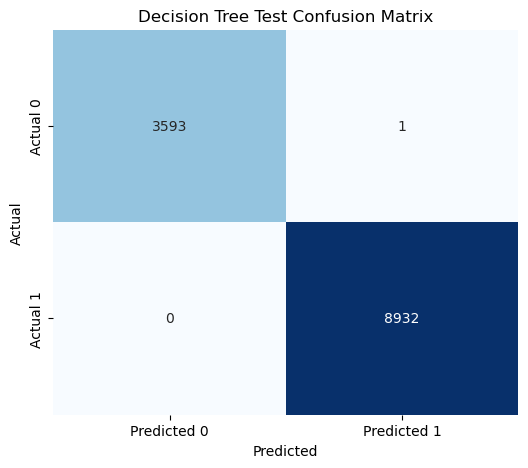

Training and evaluating AdaBoost...

Training Scores:
Accuracy: 0.9998
Precision: 0.9999
Recall: 0.9999
F1 Score: 0.9999

Test Scores:
Accuracy: 0.9998
Precision: 0.9997
Recall: 1.0000
F1 Score: 0.9998


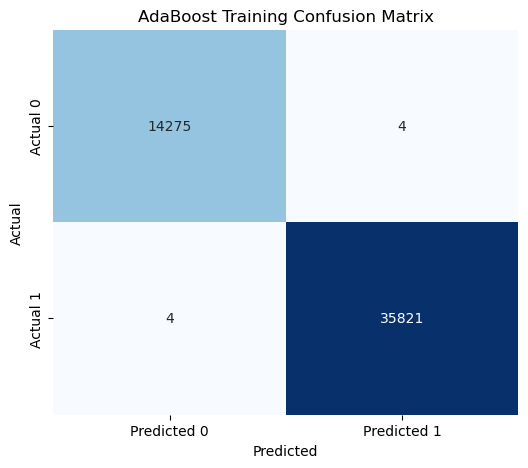

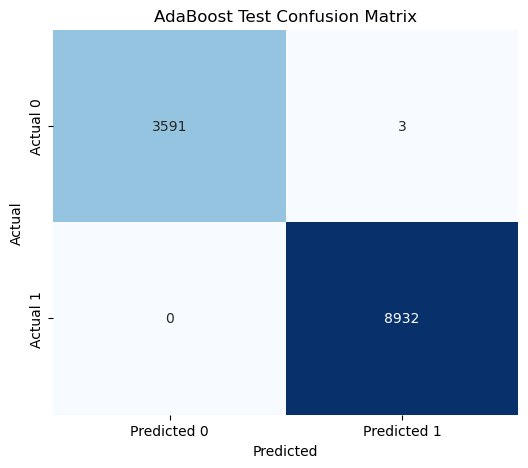

Training and evaluating Neural Network (Sigmoid)...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


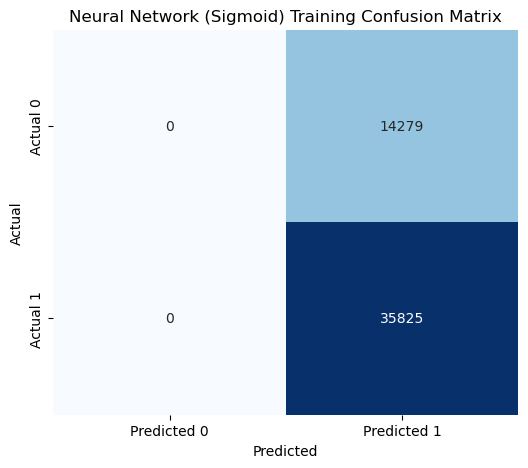

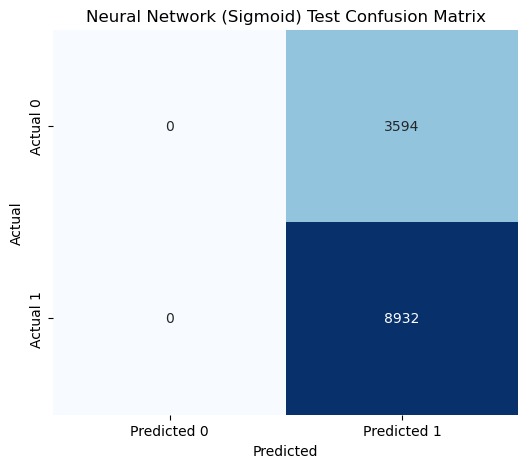

Training and evaluating XGBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


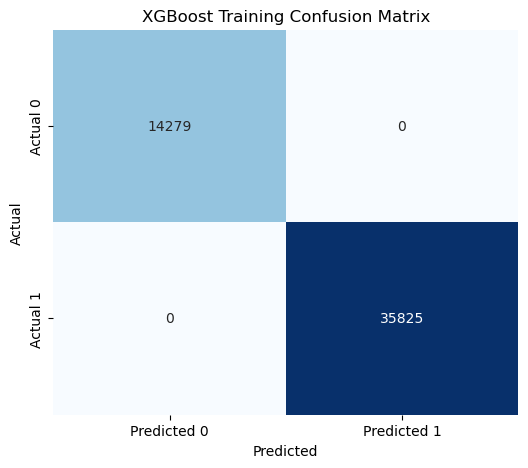

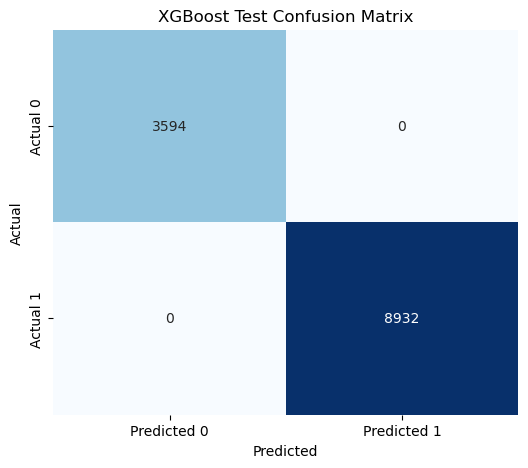

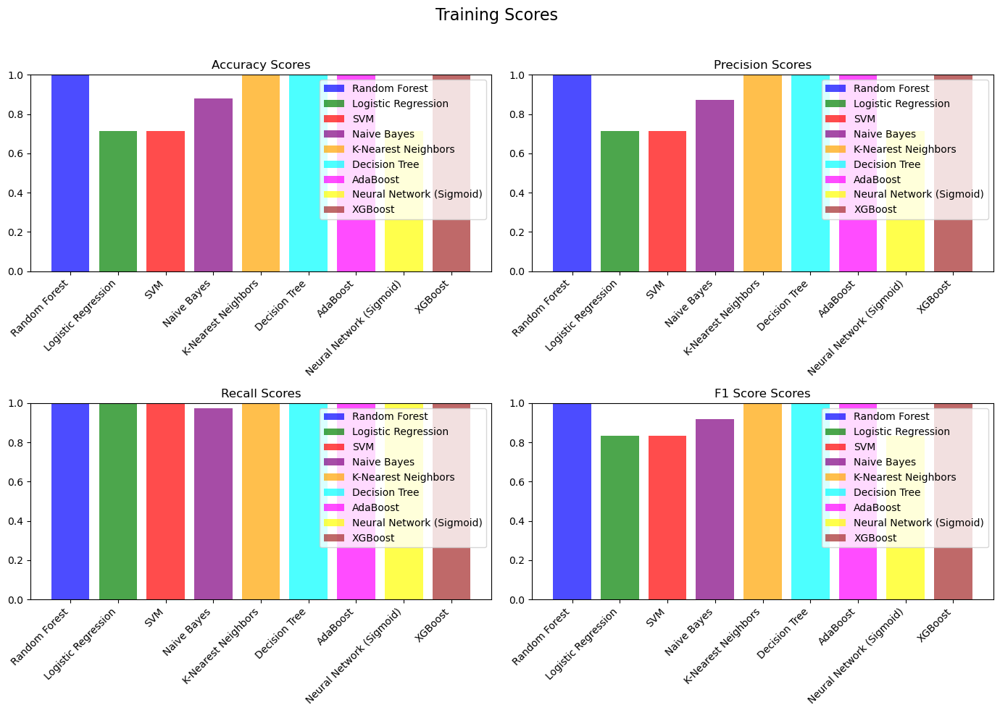

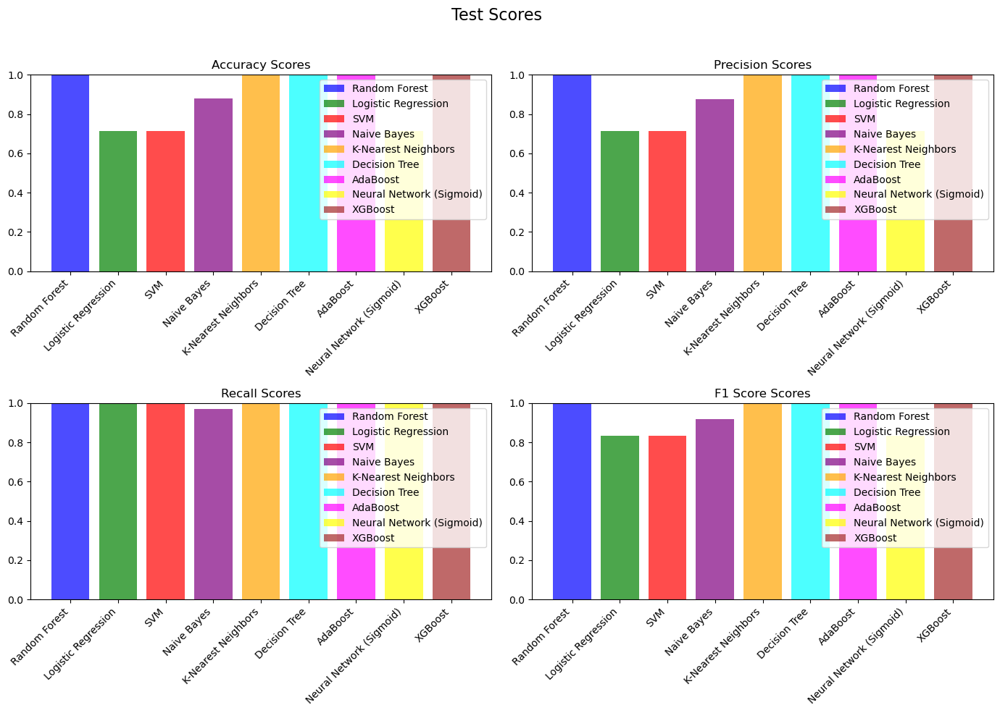

In [41]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train = X_train[['UTC', 'CNT', 'Raw Ethanol', 'Humidity']]
X_test = X_test[['UTC', 'CNT', 'Raw Ethanol', 'Humidity']]

logreg_classifier = LogisticRegression()
svm_classifier = SVC()
nb_classifier = GaussianNB()
knn_classifier = KNeighborsClassifier()
dt_classifier = DecisionTreeClassifier()
ada_classifier = AdaBoostClassifier()
sigmoid_nn_classifier = MLPClassifier(activation='logistic')
softmax_nn_classifier = MLPClassifier(activation='softmax')
xgb_classifier = xgb.XGBClassifier()
rf_classifier = RandomForestClassifier()
classifiers = {
    'Random Forest': rf_classifier,
    'Logistic Regression': logreg_classifier,
    'SVM': svm_classifier,
    'Naive Bayes': nb_classifier,
    'K-Nearest Neighbors': knn_classifier,
    'Decision Tree': dt_classifier,
    'AdaBoost': ada_classifier,
    'Neural Network (Sigmoid)': sigmoid_nn_classifier,
    'XGBoost': xgb_classifier
}

accuracy_scores_train = []
precision_scores_train = []
recall_scores_train = []
f1_scores_train = []

accuracy_scores_test = []
precision_scores_test = []
recall_scores_test = []
f1_scores_test = []

for name, classifier in classifiers.items():
    print(f"Training and evaluating {name}...")
    classifier.fit(X_train, y_train)

    y_train_pred = classifier.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    train_precision = precision_score(y_train, y_train_pred)
    train_recall = recall_score(y_train, y_train_pred)
    train_f1 = f1_score(y_train, y_train_pred)

    y_test_pred = classifier.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_precision = precision_score(y_test, y_test_pred)
    test_recall = recall_score(y_test, y_test_pred)
    test_f1 = f1_score(y_test, y_test_pred)

    conf_matrix_train = confusion_matrix(y_train, y_train_pred)
    conf_matrix_test = confusion_matrix(y_test, y_test_pred)
    
    accuracy_scores_train.append(train_accuracy)
    precision_scores_train.append(train_precision)
    recall_scores_train.append(train_recall)
    f1_scores_train.append(train_f1)

    accuracy_scores_test.append(test_accuracy)
    precision_scores_test.append(test_precision)
    recall_scores_test.append(test_recall)
    f1_scores_test.append(test_f1)
    
    print("\nTraining Scores:")
    print(f"Accuracy: {train_accuracy:.4f}")
    print(f"Precision: {train_precision:.4f}")
    print(f"Recall: {train_recall:.4f}")
    print(f"F1 Score: {train_f1:.4f}")

    print("\nTest Scores:")
    print(f"Accuracy: {test_accuracy:.4f}")
    print(f"Precision: {test_precision:.4f}")
    print(f"Recall: {test_recall:.4f}")
    print(f"F1 Score: {test_f1:.4f}")

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Training Confusion Matrix")
    plt.show()

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Test Confusion Matrix")
    plt.show()

score_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
colors = ['blue', 'green', 'red', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown']

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Training Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_train, precision_scores_train, recall_scores_train, f1_scores_train]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Test Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_test, precision_scores_test, recall_scores_test, f1_scores_test]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')  
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

plt.show()


1
Selected Features: ('CNT',)
Accuracy: 0.9007663507432794


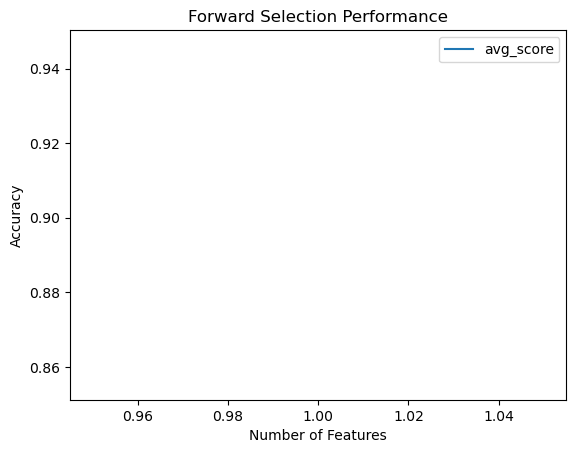

2
Selected Features: ('TVOCppb', 'CNT')
Accuracy: 0.9419008525210829


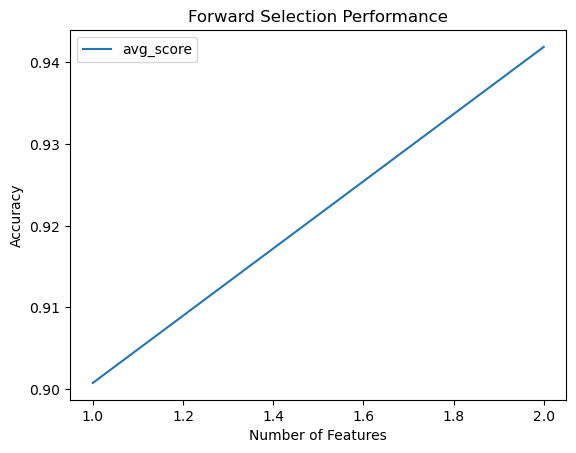

3
Selected Features: ('Humidity', 'TVOCppb', 'CNT')
Accuracy: 0.9504031653288573


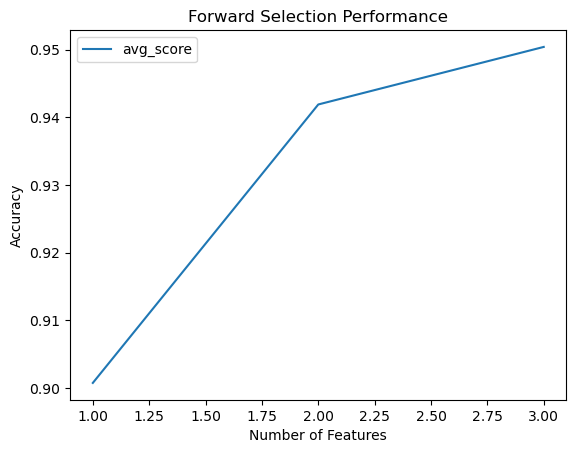

4
Selected Features: ('Humidity', 'TVOCppb', 'eCO2ppm', 'CNT')
Accuracy: 0.9719183785905885


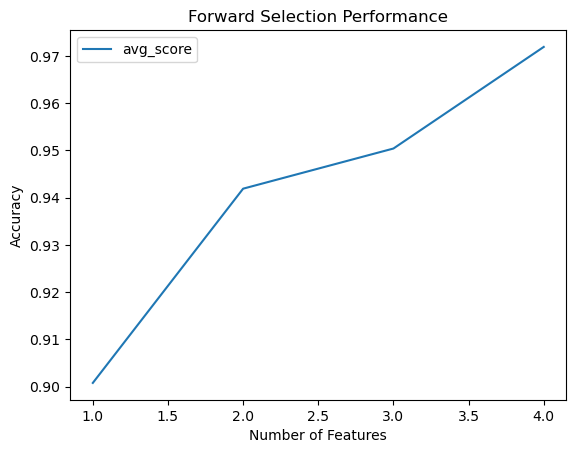

5
Selected Features: ('Humidity', 'TVOCppb', 'eCO2ppm', 'Raw Ethanol', 'CNT')
Accuracy: 0.9818178113387036


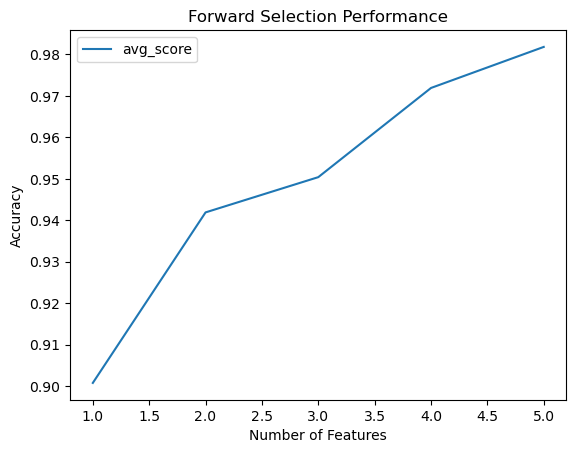

6
Selected Features: ('Humidity', 'TVOCppb', 'eCO2ppm', 'Raw Ethanol', 'PressurehPa', 'CNT')
Accuracy: 0.9906993337942417


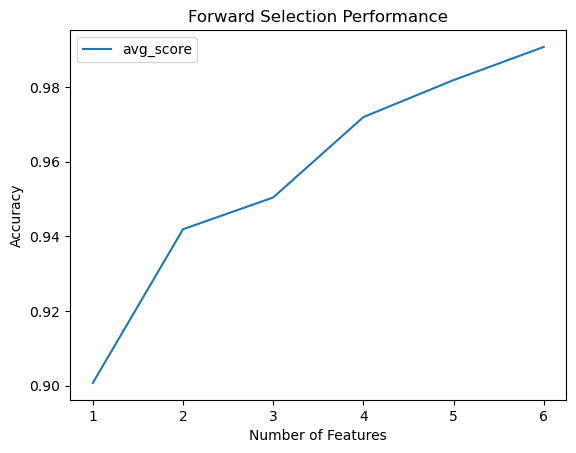

7
Selected Features: ('Humidity', 'TVOCppb', 'eCO2ppm', 'Raw Ethanol', 'PressurehPa', 'NC0.5', 'CNT')
Accuracy: 0.9913180385063622


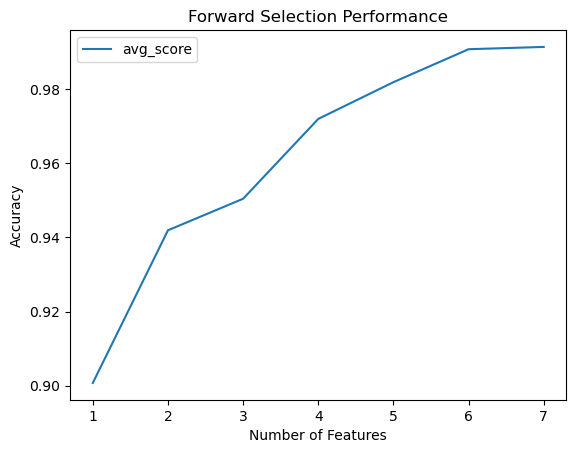

8
Selected Features: ('Humidity', 'TVOCppb', 'eCO2ppm', 'Raw Ethanol', 'PressurehPa', 'PM1.0', 'NC0.5', 'CNT')
Accuracy: 0.9921762661683916


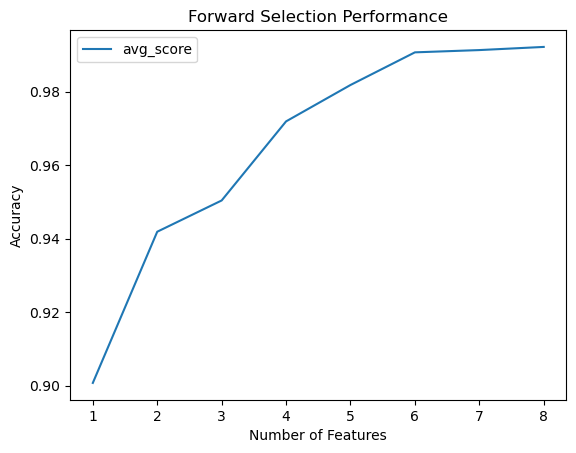

9
Selected Features: ('Humidity', 'TVOCppb', 'eCO2ppm', 'Raw Ethanol', 'PressurehPa', 'PM1.0', 'NC0.5', 'NC2.5', 'CNT')
Accuracy: 0.9921962242564069


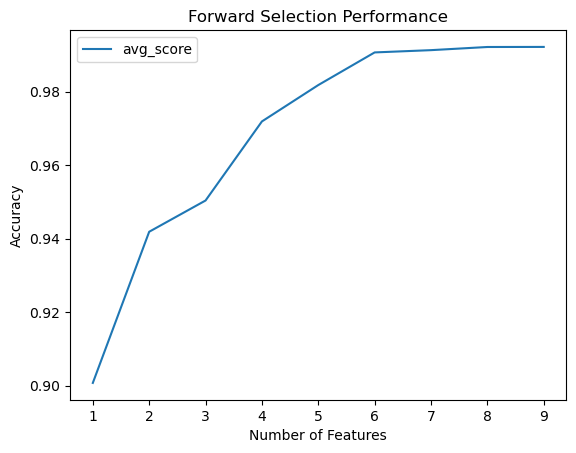

10
Selected Features: ('Humidity', 'TVOCppb', 'eCO2ppm', 'Raw Ethanol', 'PressurehPa', 'PM1.0', 'NC0.5', 'NC1.0', 'NC2.5', 'CNT')
Accuracy: 0.99197668528824


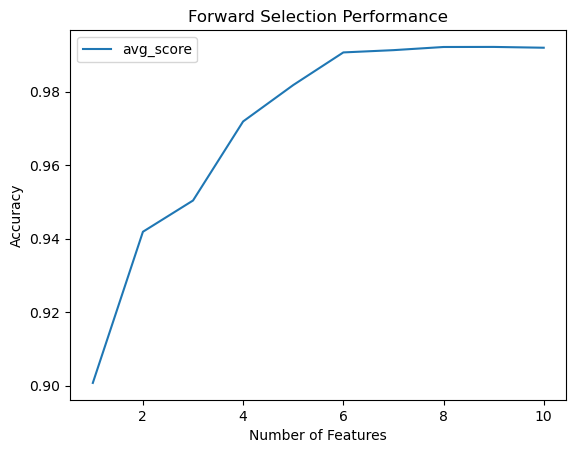

11
Selected Features: ('Humidity', 'TVOCppb', 'eCO2ppm', 'Raw Ethanol', 'PressurehPa', 'PM1.0', 'PM2.5', 'NC0.5', 'NC1.0', 'NC2.5', 'CNT')
Accuracy: 0.9918170146086431


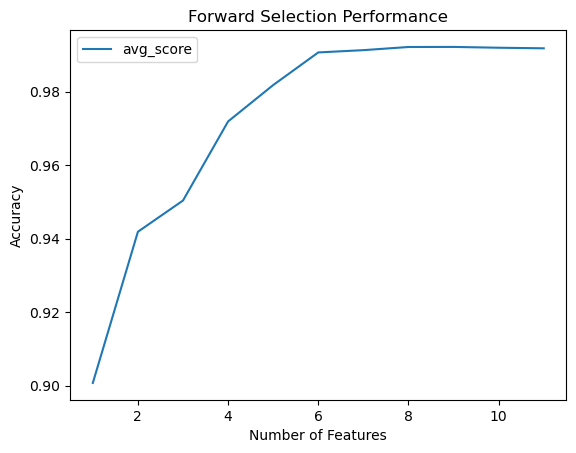

12
Selected Features: ('TemperatureC', 'Humidity', 'TVOCppb', 'eCO2ppm', 'Raw Ethanol', 'PressurehPa', 'PM1.0', 'PM2.5', 'NC0.5', 'NC1.0', 'NC2.5', 'CNT')
Accuracy: 0.9903401240628213


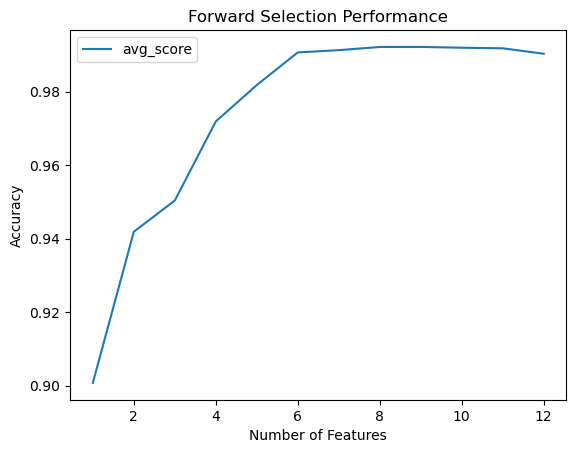

13
Selected Features: ('TemperatureC', 'Humidity', 'TVOCppb', 'eCO2ppm', 'Raw H2', 'Raw Ethanol', 'PressurehPa', 'PM1.0', 'PM2.5', 'NC0.5', 'NC1.0', 'NC2.5', 'CNT')
Accuracy: 0.985250568616285


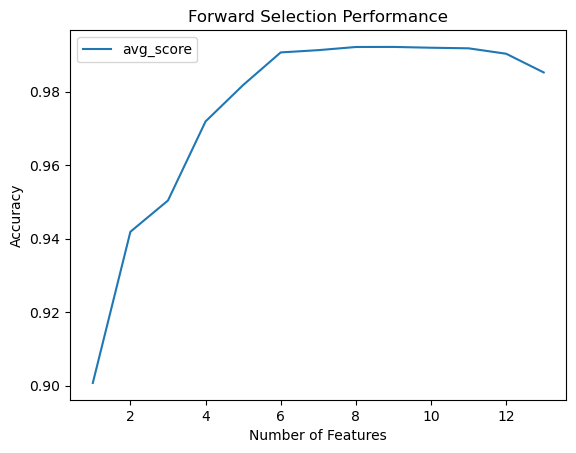

14
Selected Features: ('UTC', 'TemperatureC', 'Humidity', 'TVOCppb', 'eCO2ppm', 'Raw H2', 'Raw Ethanol', 'PressurehPa', 'PM1.0', 'PM2.5', 'NC0.5', 'NC1.0', 'NC2.5', 'CNT')
Accuracy: 0.7150127745706073


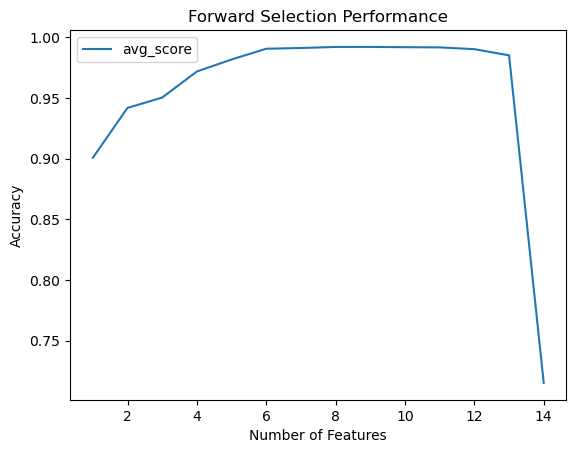

In [50]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
for ii in range(1, X.shape[1]+1):
    model = LogisticRegression()

    sfs = SFS(model,
              k_features=ii,
              forward=True,
              floating=False,
              scoring='accuracy',
              cv=5)
    print(ii)
    sfs.fit(X_train, y_train)
    print('Selected Features:', sfs.k_feature_names_)

    accuracy = sfs.k_score_
    print('Accuracy:', accuracy)

    sfs_df = pd.DataFrame.from_dict(sfs.get_metric_dict()).T
    sfs_df['avg_score'] = sfs_df['avg_score'].astype(float)
    fig, ax = plt.subplots()
    sfs_df.plot(kind='line', y='avg_score', ax=ax)
    ax.set_xlabel('Number of Features')
    ax.set_ylabel('Accuracy')
    ax.set_title('Forward Selection Performance')
    plt.show()


1
Selected Features: ('UTC',)
Accuracy: 0.9975051832269998


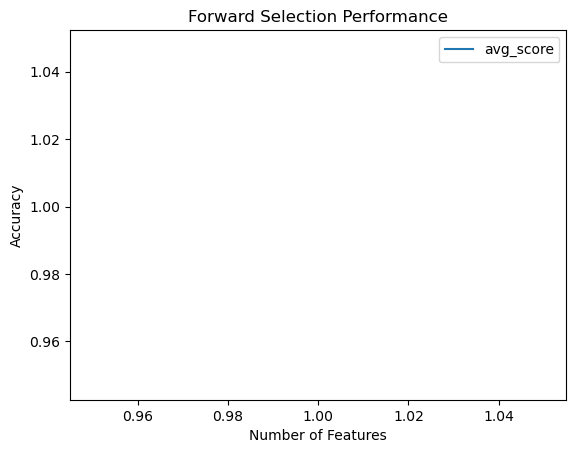

2
Selected Features: ('UTC', 'CNT')
Accuracy: 0.9998004111525477


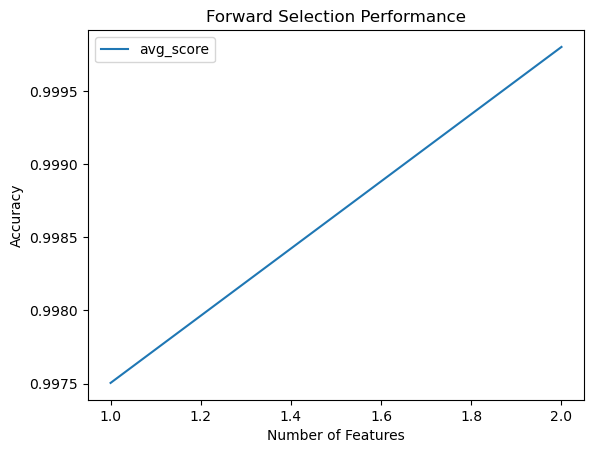

3
Selected Features: ('UTC', 'Humidity', 'CNT')
Accuracy: 0.9998602894002435


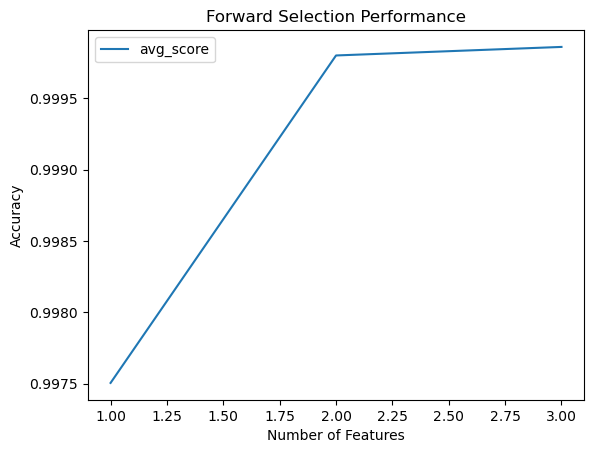

4
Selected Features: ('UTC', 'Humidity', 'PM1.0', 'CNT')
Accuracy: 0.9998802454964336


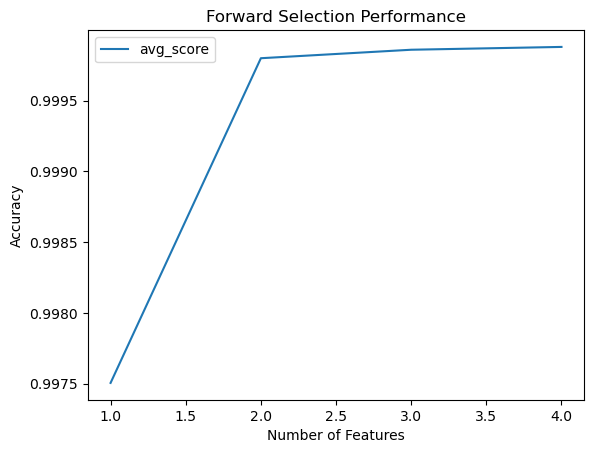

5
Selected Features: ('UTC', 'TemperatureC', 'Humidity', 'PM1.0', 'CNT')
Accuracy: 0.9998802454964336


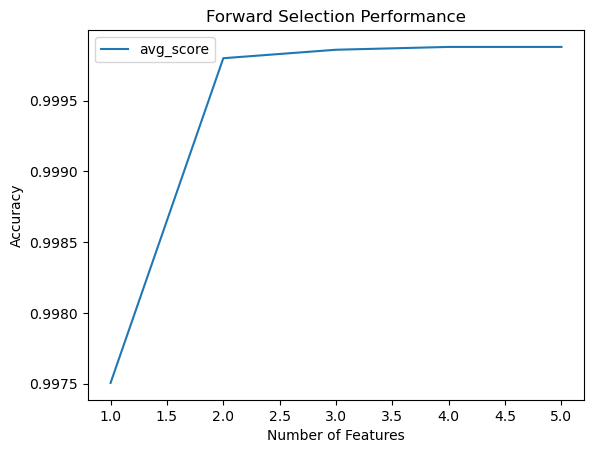

6
Selected Features: ('UTC', 'TemperatureC', 'Humidity', 'Raw H2', 'PM1.0', 'CNT')
Accuracy: 0.9998802474882588


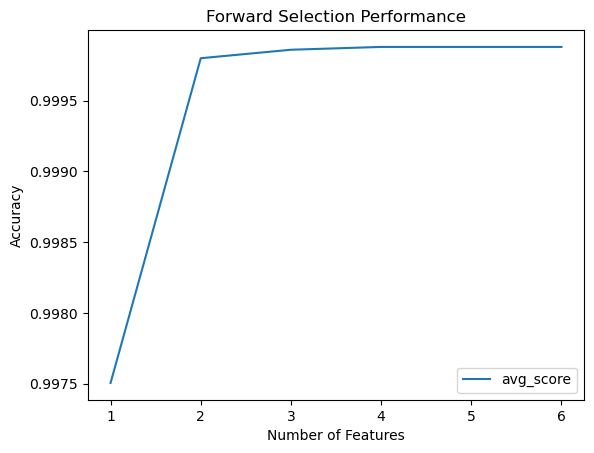

7
Selected Features: ('UTC', 'TemperatureC', 'Humidity', 'Raw H2', 'PM1.0', 'PM2.5', 'CNT')
Accuracy: 0.9998802474882588


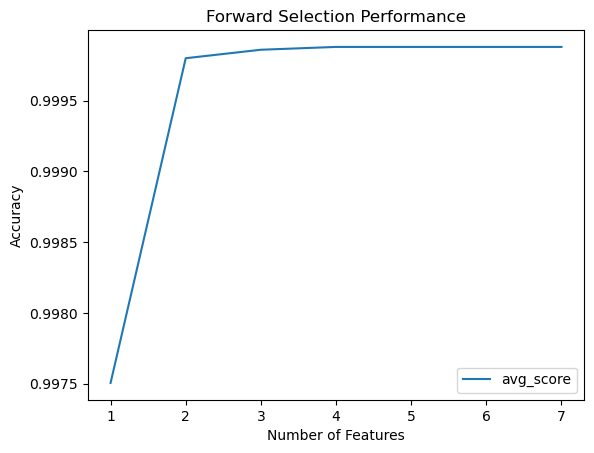

8
Selected Features: ('UTC', 'TemperatureC', 'Humidity', 'Raw H2', 'PM1.0', 'PM2.5', 'NC0.5', 'CNT')
Accuracy: 0.9998802474882588


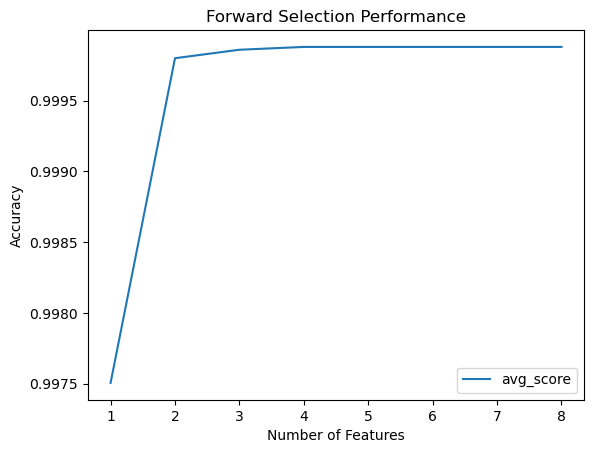

9
Selected Features: ('UTC', 'TemperatureC', 'Humidity', 'Raw H2', 'PM1.0', 'PM2.5', 'NC0.5', 'NC1.0', 'CNT')
Accuracy: 0.9998802474882588


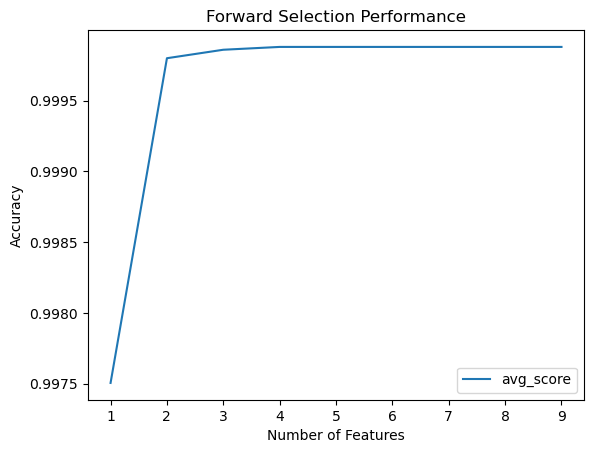

10
Selected Features: ('UTC', 'TemperatureC', 'Humidity', 'Raw H2', 'PM1.0', 'PM2.5', 'NC0.5', 'NC1.0', 'NC2.5', 'CNT')
Accuracy: 0.9998802474882588


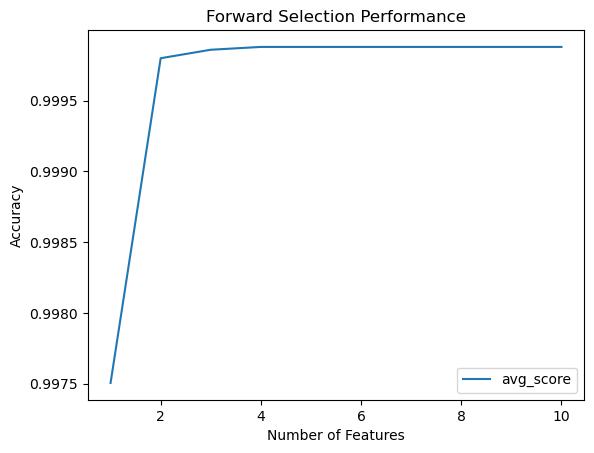

11
Selected Features: ('UTC', 'TemperatureC', 'Humidity', 'TVOCppb', 'Raw H2', 'PM1.0', 'PM2.5', 'NC0.5', 'NC1.0', 'NC2.5', 'CNT')
Accuracy: 0.9998602894002435


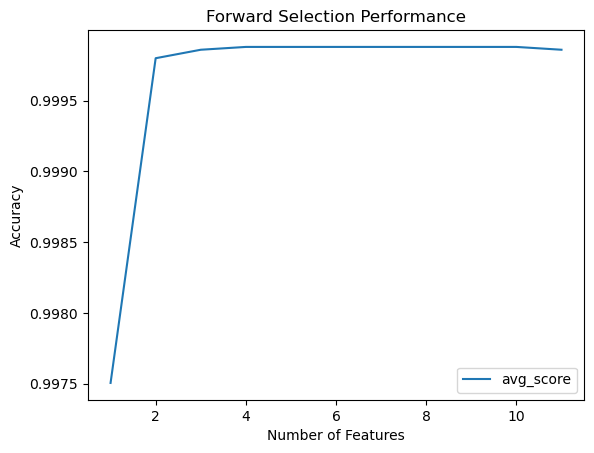

12
Selected Features: ('UTC', 'TemperatureC', 'Humidity', 'TVOCppb', 'Raw H2', 'PressurehPa', 'PM1.0', 'PM2.5', 'NC0.5', 'NC1.0', 'NC2.5', 'CNT')
Accuracy: 0.9998602894002435


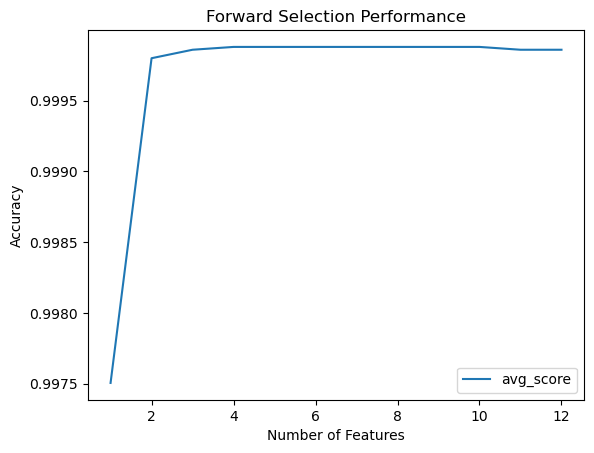

13
Selected Features: ('UTC', 'TemperatureC', 'Humidity', 'TVOCppb', 'eCO2ppm', 'Raw H2', 'PressurehPa', 'PM1.0', 'PM2.5', 'NC0.5', 'NC1.0', 'NC2.5', 'CNT')
Accuracy: 0.9998602894002435


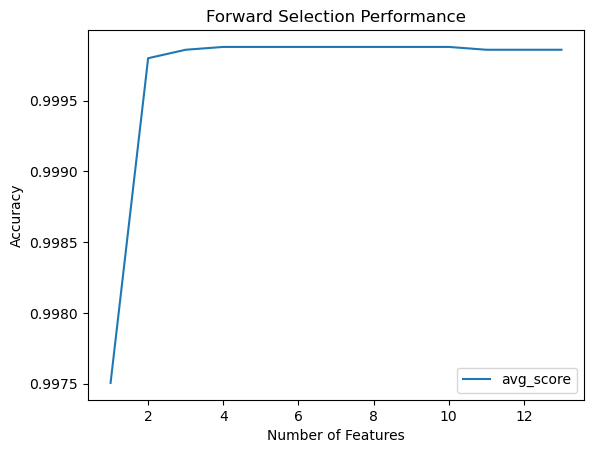

14
Selected Features: ('UTC', 'TemperatureC', 'Humidity', 'TVOCppb', 'eCO2ppm', 'Raw H2', 'Raw Ethanol', 'PressurehPa', 'PM1.0', 'PM2.5', 'NC0.5', 'NC1.0', 'NC2.5', 'CNT')
Accuracy: 0.9998602894002435


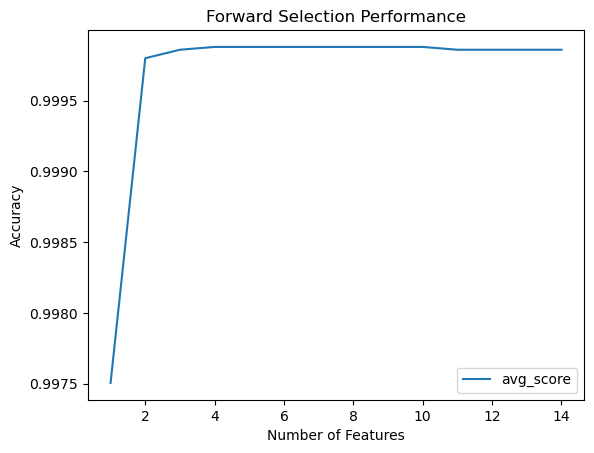

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
for ii in range(1, X.shape[1]+1):
    model = xgb.XGBClassifier()

    sfs = SFS(model,
              k_features=ii,
              forward=True,
              floating=False,
              scoring='accuracy',
              cv=5)
    print(ii)
    sfs.fit(X_train, y_train)
    print('Selected Features:', sfs.k_feature_names_)

    accuracy = sfs.k_score_
    print('Accuracy:', accuracy)

    sfs_df = pd.DataFrame.from_dict(sfs.get_metric_dict()).T
    sfs_df['avg_score'] = sfs_df['avg_score'].astype(float)
    fig, ax = plt.subplots()
    sfs_df.plot(kind='line', y='avg_score', ax=ax)
    ax.set_xlabel('Number of Features')
    ax.set_ylabel('Accuracy')
    ax.set_title('Forward Selection Performance')
    plt.show()


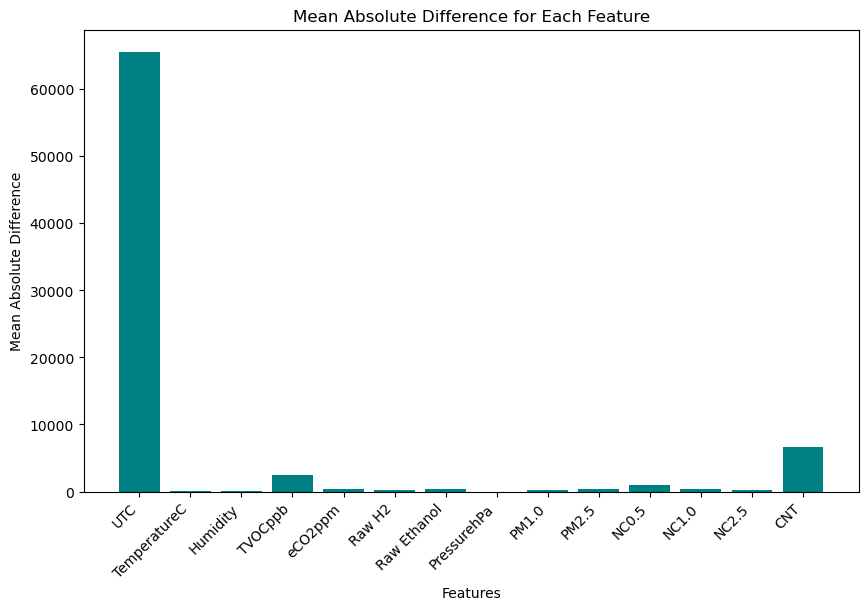

In [53]:
mean_abs_diff = np.sum(np.abs(X - np.mean(X, axis=0)), axis=0) / X.shape[0]
plt.figure(figsize=(10, 6)) 
plt.bar(np.arange(X.shape[1]), mean_abs_diff, color='teal')
plt.xticks(np.arange(X.shape[1]), list(X.columns), rotation=45, ha='right')
plt.xlabel('Features')
plt.ylabel('Mean Absolute Difference')
plt.title('Mean Absolute Difference for Each Feature')
plt.show()


Training and evaluating Random Forest...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


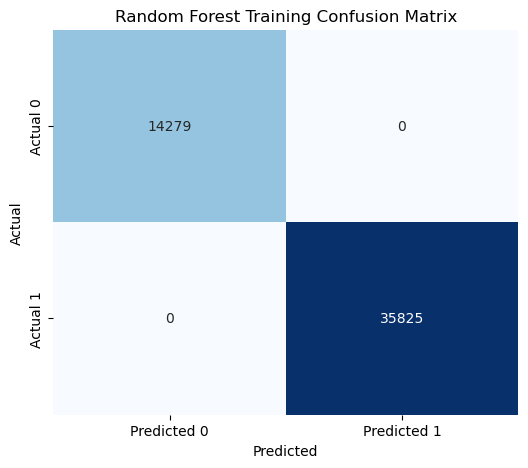

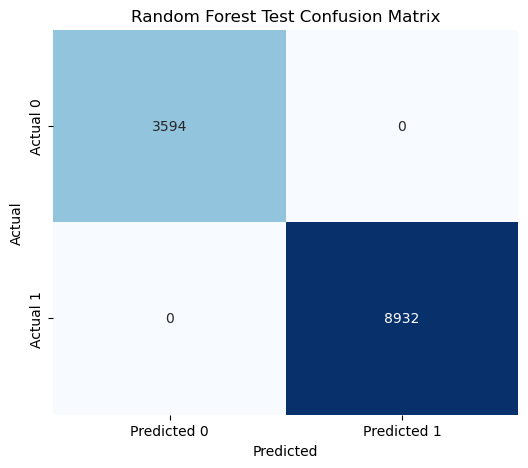

Training and evaluating Logistic Regression...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


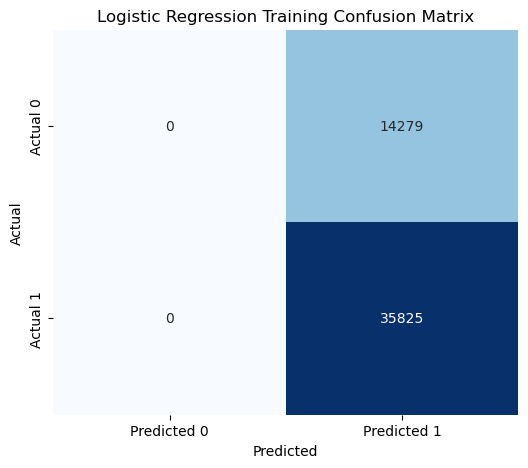

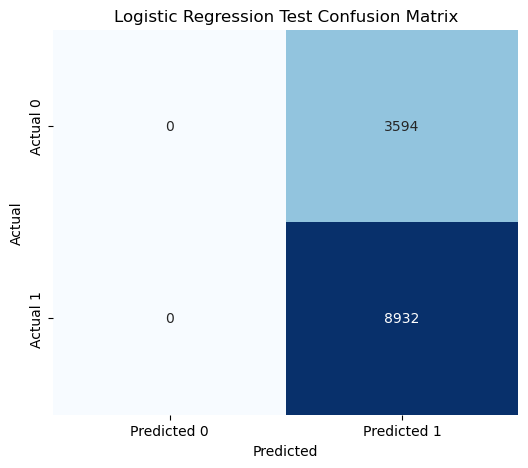

Training and evaluating SVM...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


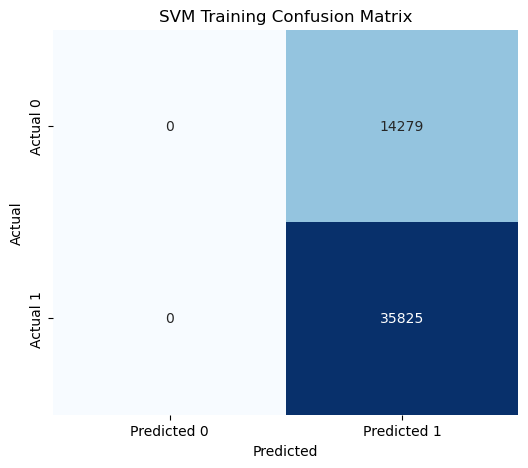

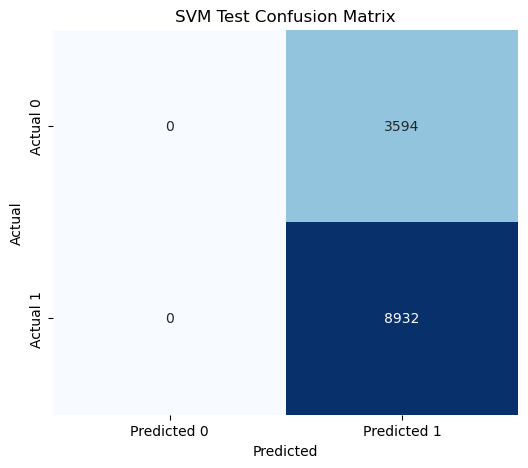

Training and evaluating Naive Bayes...

Training Scores:
Accuracy: 0.8093
Precision: 0.8012
Recall: 0.9754
F1 Score: 0.8797

Test Scores:
Accuracy: 0.8099
Precision: 0.8024
Recall: 0.9730
F1 Score: 0.8795


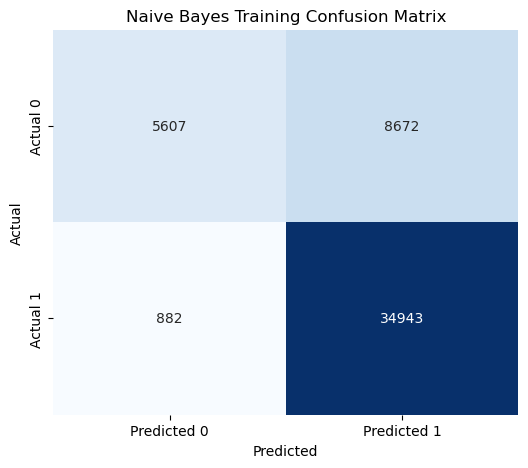

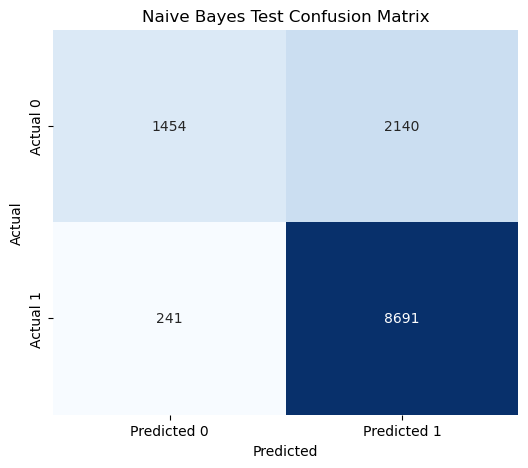

Training and evaluating K-Nearest Neighbors...

Training Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 0.9999
F1 Score: 0.9999

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


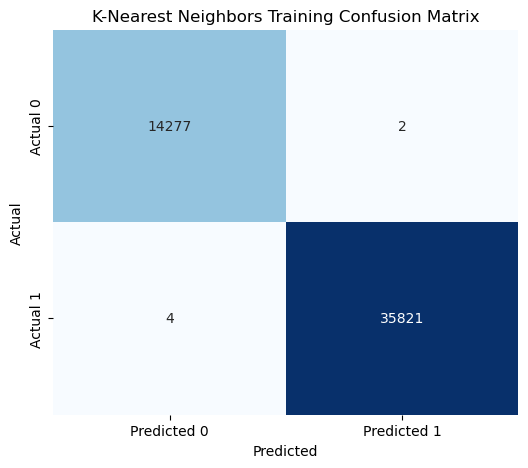

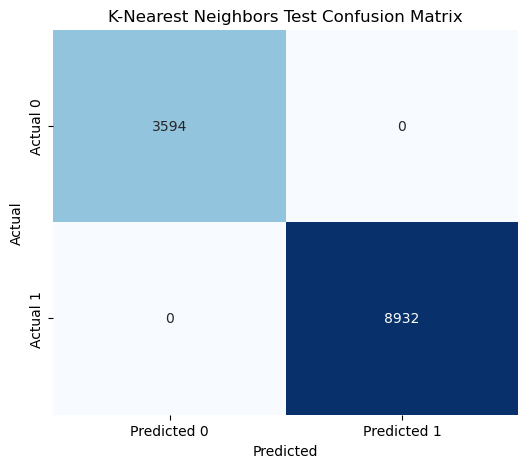

Training and evaluating Decision Tree...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 0.9998
Precision: 0.9998
Recall: 1.0000
F1 Score: 0.9999


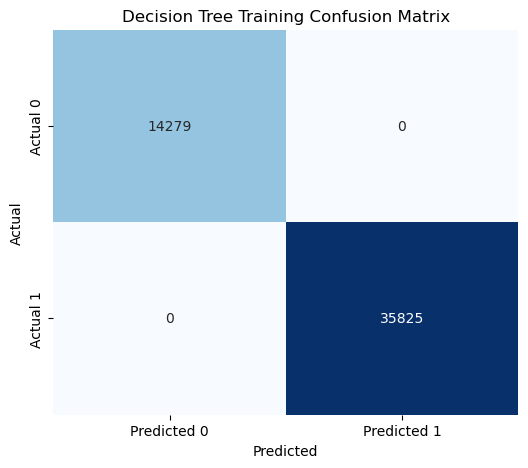

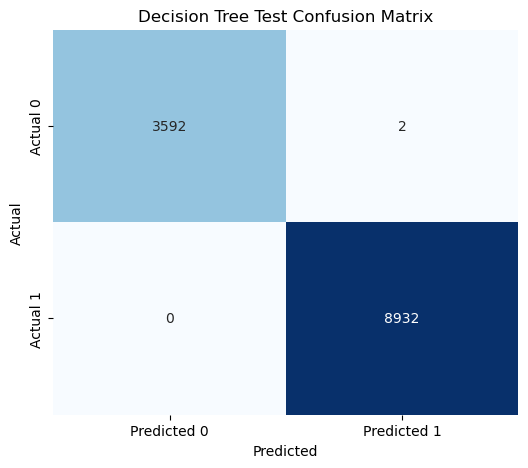

Training and evaluating AdaBoost...

Training Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 0.9999
F1 Score: 0.9999

Test Scores:
Accuracy: 0.9999
Precision: 0.9999
Recall: 1.0000
F1 Score: 0.9999


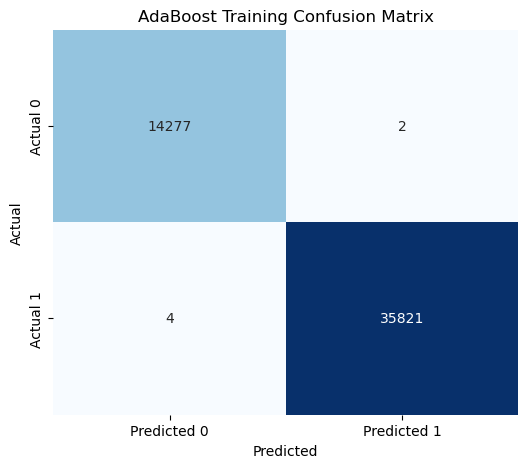

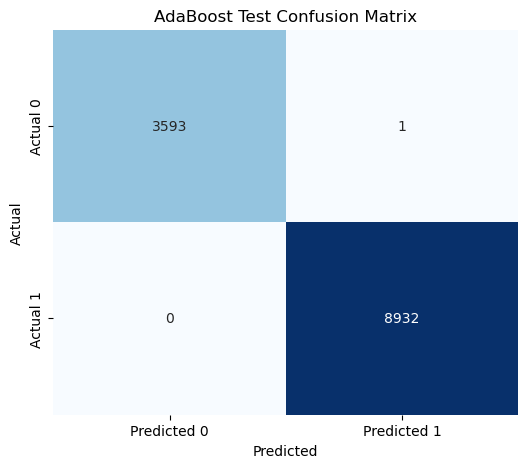

Training and evaluating Neural Network (Sigmoid)...

Training Scores:
Accuracy: 0.7150
Precision: 0.7150
Recall: 1.0000
F1 Score: 0.8338

Test Scores:
Accuracy: 0.7131
Precision: 0.7131
Recall: 1.0000
F1 Score: 0.8325


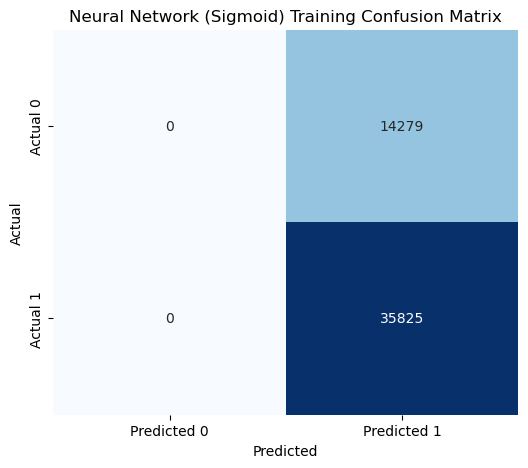

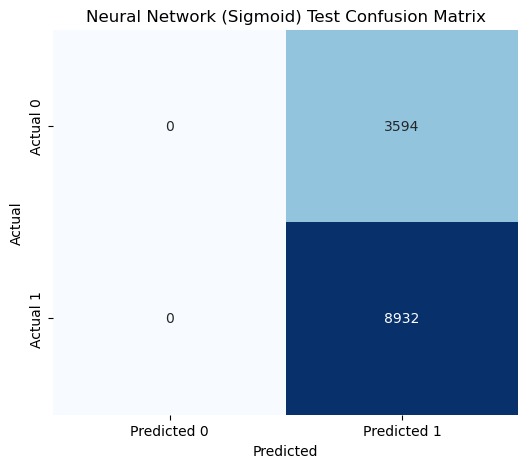

Training and evaluating XGBoost...

Training Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Test Scores:
Accuracy: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000


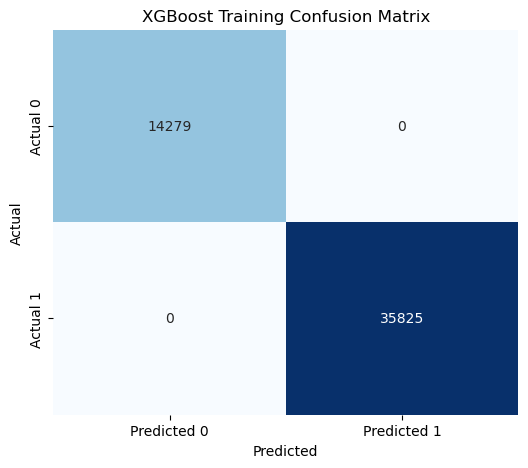

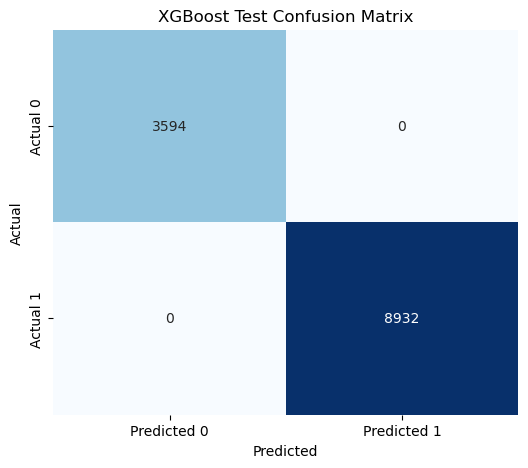

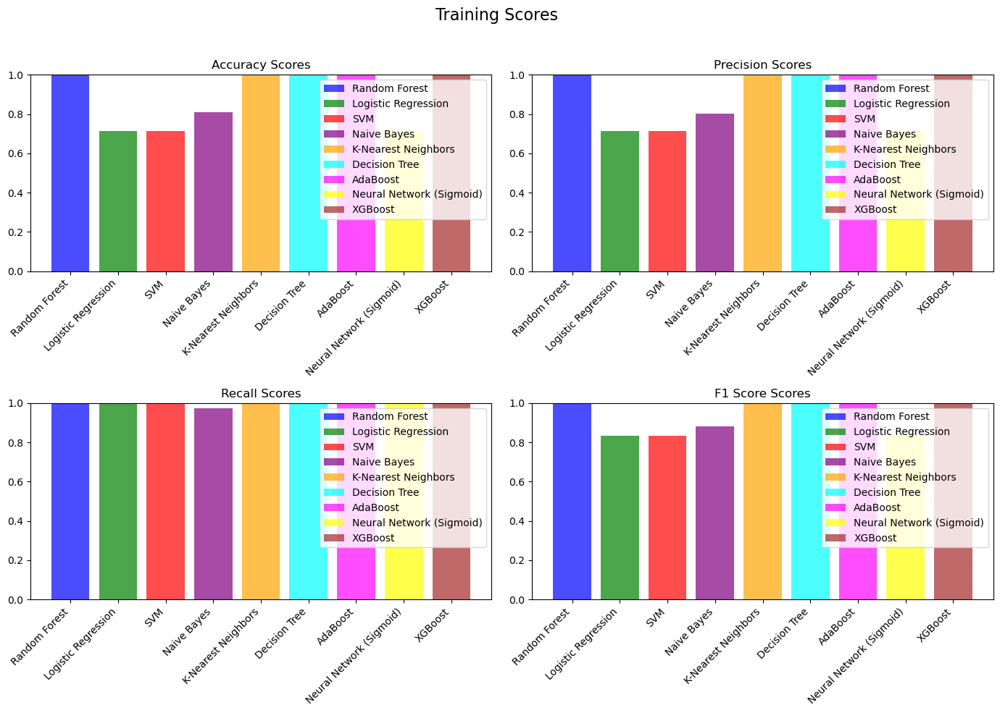

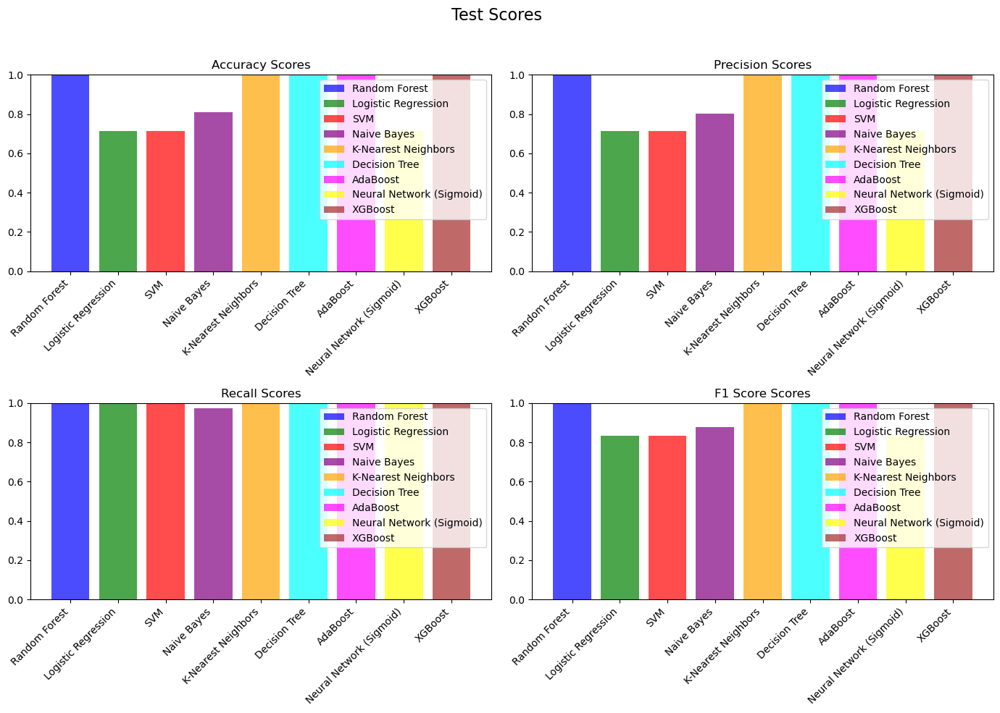

In [54]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train = X_train[['UTC', 'CNT', 'TVOCppb']]
X_test = X_test[['UTC', 'CNT', 'TVOCppb']]

logreg_classifier = LogisticRegression()
svm_classifier = SVC()
nb_classifier = GaussianNB()
knn_classifier = KNeighborsClassifier()
dt_classifier = DecisionTreeClassifier()
ada_classifier = AdaBoostClassifier()
sigmoid_nn_classifier = MLPClassifier(activation='logistic')
softmax_nn_classifier = MLPClassifier(activation='softmax')
xgb_classifier = xgb.XGBClassifier()
rf_classifier = RandomForestClassifier()
classifiers = {
    'Random Forest': rf_classifier,
    'Logistic Regression': logreg_classifier,
    'SVM': svm_classifier,
    'Naive Bayes': nb_classifier,
    'K-Nearest Neighbors': knn_classifier,
    'Decision Tree': dt_classifier,
    'AdaBoost': ada_classifier,
    'Neural Network (Sigmoid)': sigmoid_nn_classifier,
    'XGBoost': xgb_classifier
}

accuracy_scores_train = []
precision_scores_train = []
recall_scores_train = []
f1_scores_train = []

accuracy_scores_test = []
precision_scores_test = []
recall_scores_test = []
f1_scores_test = []

for name, classifier in classifiers.items():
    print(f"Training and evaluating {name}...")
    classifier.fit(X_train, y_train)

    y_train_pred = classifier.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    train_precision = precision_score(y_train, y_train_pred)
    train_recall = recall_score(y_train, y_train_pred)
    train_f1 = f1_score(y_train, y_train_pred)

    y_test_pred = classifier.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    test_precision = precision_score(y_test, y_test_pred)
    test_recall = recall_score(y_test, y_test_pred)
    test_f1 = f1_score(y_test, y_test_pred)

    conf_matrix_train = confusion_matrix(y_train, y_train_pred)
    conf_matrix_test = confusion_matrix(y_test, y_test_pred)
    
    accuracy_scores_train.append(train_accuracy)
    precision_scores_train.append(train_precision)
    recall_scores_train.append(train_recall)
    f1_scores_train.append(train_f1)

    accuracy_scores_test.append(test_accuracy)
    precision_scores_test.append(test_precision)
    recall_scores_test.append(test_recall)
    f1_scores_test.append(test_f1)
    
    print("\nTraining Scores:")
    print(f"Accuracy: {train_accuracy:.4f}")
    print(f"Precision: {train_precision:.4f}")
    print(f"Recall: {train_recall:.4f}")
    print(f"F1 Score: {train_f1:.4f}")

    print("\nTest Scores:")
    print(f"Accuracy: {test_accuracy:.4f}")
    print(f"Precision: {test_precision:.4f}")
    print(f"Recall: {test_recall:.4f}")
    print(f"F1 Score: {test_f1:.4f}")

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_train, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Training Confusion Matrix")
    plt.show()

    plt.figure(figsize=(6, 5))
    sns.heatmap(conf_matrix_test, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"{name} Test Confusion Matrix")
    plt.show()

score_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
colors = ['blue', 'green', 'red', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'brown']

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Training Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_train, precision_scores_train, recall_scores_train, f1_scores_train]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
fig.suptitle('Test Scores', fontsize=16)

for i, score_list in enumerate([accuracy_scores_test, precision_scores_test, recall_scores_test, f1_scores_test]):
    ax = axes[i // 2, i % 2]
    for j, (clf, score) in enumerate(zip(classifiers.keys(), score_list)):
        ax.bar(clf, score, color=colors[j % len(colors)], alpha=0.7, label=f'{clf}')

    ax.set_title(f'{score_names[i]} Scores')
    ax.set_ylim([0, 1])
    ax.set_xticklabels(classifiers.keys(), rotation=45, ha='right')  
    ax.legend()

plt.tight_layout(rect=[0, 0, 1, 0.96]) 

plt.show()
